In [5]:
from dendrocat import RadioSource
from astropy.io import fits
from spectral_cube import SpectralCube
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import sys
import importlib
from astropy.wcs import WCS
from scipy import interpolate
import pandas as pd
import sympy as syp
from astropy import units as u
import radio_beam
from astropy.table import Table
from radio_beam import Beam
from astropy import coordinates
from astropy import wcs
from astropy.nddata.utils import Cutout2D
from dendrocat.aperture import Ellipse
from regions import Regions, PixCoord
from astropy import stats
from itertools import chain
from radio_beam import Beams
from astropy.convolution import convolve
W51 = '/orange/adamginsburg/w51/TaehwaYoo/'
W51b6 = '/orange/adamginsburg/w51/TaehwaYoo/2015.1.01596.S_W51_B6_LB/continuum_images/'
W51cont='/orange/adamginsburg/w51/TaehwaYoo/b6contfits/'
w51e2_b6_briggs=W51cont+'W51e2_cont_bigbriggs.image.fits'
w51e2_b6_robust0=W51cont+'W51e2_cont_big_robust0.image.fits'
w51e2_b6_uniform=W51cont+'W51e2_cont_biguniform.image.fits'
w51e2_b6_superuniform=W51cont+'W51e2_cont_bigsuperuniform.image.fits'

w51n_b6_briggs = W51cont+'W51n_cont_bigbriggs.image.fits'
w51n_b6_robust0 = W51cont+'w51n_cont_big_robust0.image.fits'
w51n_b6_uniform = W51cont+'W51n_cont_biguniform.image.fits'
w51n_b6_superuniform = W51cont+'W51n_cont_bigsuperuniform.image.fits'
w51n_b6_natural = W51cont+'W51n_cont_bignatural.image.fits'

W51b3 = '/orange/adamginsburg/w51/TaehwaYoo/2017.1.00293.S_W51_B3_LB/may2021_successful_imaging/'

w51n_b3_tt0 = W51b3+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'
w51n_b3_tt1 = W51+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt1.pbcor.fits'
w51n_b3_alpha = W51+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.alpha.pbcor.fits'

w51conv = '/orange/adamginsburg/w51/TaehwaYoo/convolved_new/'
w51n_b6_conv = w51conv + 'w51n_cont_bigbriggs.image.convB3_briggs.fits'

w51e_b3_tt0 = W51b3+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'
w51e2_b3_tt1 = W51+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt1.pbcor.fits'
w51e2_b3_alpha = W51+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.alpha.pbcor.fits'

w51e2_b6_conv = w51conv + 'w51e2_cont_bigbriggs.image.convB3_briggs.fits'

w51e_b6_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51e_B6_conv.fits'
w51e_b3_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51e_B3_conv.fits'


w51n_b3_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51n_B3_conv.fits'

w51n_b6_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal9_finaliter.image.tt0.pbcor.fits'

w51n_b6_conv = w51conv + 'w51n_new_nocorr_in_area_B6_conv.fits'
#w51n_b3_conv = w51conv + 'w51n_B3_conv.fits'
#w51e_b3_conv = w51conv + 'w51e_B3_conv.fits'
w51e_b6_conv = w51conv + 'w51e_new_nocorr_in_area_B6_conv.fits'


w51e_matched_catalog = '/home/t.yoo/w51/catalogue/dendrogram/dendro_w51e_matched.fits'
w51n_matched_catalog = '/home/t.yoo/w51/catalogue/dendrogram/dendro_w51n_matched.fits'

w51e_b3_noiseregion = '/orange/adamginsburg/w51/TaehwaYoo/w51e_b3_std_sky.reg'
w51e_b6_noiseregion = '/orange/adamginsburg/w51/TaehwaYoo/w51e_b6_std_sky.reg'
w51n_b3_noiseregion = '/orange/adamginsburg/w51/TaehwaYoo/w51n_b3_std_sky.reg'
w51n_b6_noiseregion = '/orange/adamginsburg/w51/TaehwaYoo/w51n_b6_std_sky.reg'
w51e_b6_calibrated_pbcor = '/orange/adamginsburg/w51/TaehwaYoo/w51e2.spw0thru19.14500.robust0.thr0.15mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'
w51n_b6_calibrated_pbcor = '/orange/adamginsburg/w51/TaehwaYoo/w51n.spw0thru19.14500.robust0.thr0.1mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'


photometrydir = '/home/t.yoo/w51/catalogue/photometry/'
w51e_b3_flux = photometrydir+'w51e_b3_flux_size.fits'
w51n_b3_flux = photometrydir+'w51n_b3_flux_size.fits'
w51e_b6_flux = photometrydir+'w51e_b6_flux_size.fits'
w51n_b6_flux = photometrydir+'w51n_b6_flux_size.fits'
w51e_b6_conv_flux = photometrydir+'w51e_b6_conv_flux_size.fits'
w51n_b6_conv_flux = photometrydir+'w51n_b6_conv_flux_size.fits'


In [25]:
from astropy.table import Table
import matplotlib as mpl
import astropy.constants as c
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.rcParams['axes.labelsize']=25
plt.rcParams['xtick.labelsize']=25
plt.rcParams['ytick.labelsize']=25
plt.rcParams['axes.titlesize']=25
mpl.rcParams['axes.linewidth'] = 5
mpl.rcParams['xtick.major.size'] = 10
mpl.rcParams['xtick.major.width'] = 4
mpl.rcParams['xtick.minor.size'] = 5
mpl.rcParams['xtick.minor.width'] = 2
mpl.rcParams['ytick.major.size'] = 10
mpl.rcParams['ytick.major.width'] = 4
mpl.rcParams['ytick.minor.size'] = 5
mpl.rcParams['ytick.minor.width'] = 2
params = {"xtick.top": True, "ytick.right": True, "xtick.direction": "in", "ytick.direction": "in"}
plt.rcParams.update(params)


def get_noise(fitsfile, noiseregion):
    fitsdata = fits.open(b6data)
    image = fitsdata[0].data
    if len(image.shape)!=2:
        image = image[0][0] 
    hdrNB = fits.getheader(fitsfile)  
    wcsNB = WCS(hdrNB,naxis=2)
    container = []
    for reg in noiseregion:
        pix_reg = reg.to_pixel(wcsNB)
        noisemask = pix_reg.to_mask()
        noiseim = noisemask.cutout(image)
        container.append(noiseim.flatten())
    noiseim = list(chain.from_iterable(container))
    std = stats.mad_std(noiseim,ignore_nan=True)

    return std
def kappa(nu, nu0=271.1*u.GHz, kappa0=0.0114*u.cm**2*u.g**-1, beta=1.75):
    """
    Compute the opacity $\kappa$ given a reference frequency (or wavelength)
    and a power law governing the opacity as a fuction of frequency:
    $$ \kappa = \kappa_0 \left(\\frac{\\nu}{\\nu_0}\\right)^{\\beta} $$
    The default kappa=0.0114 at 271.1 GHz comes from extrapolating the
    Ossenkopf & Henning 1994 opacities for the thin-ice-mantle, 10^6 year model
    anchored at 1.0 mm with an assumed beta of 1.75.
    Parameters
    ----------
    nu: astropy.Quantity [u.spectral() equivalent]
        The frequency at which to evaluate kappa
    nu0: astropy.Quantity [u.spectral() equivalent]
        The reference frequency at which $\kappa$ is defined
    kappa0: astropy.Quantity [cm^2/g]
        The dust opacity per gram of H2 along the line of sight.  Because of
        the H2 conversion, this factor implicitly includes a dust to gas ratio
        (usually assumed 100)
    beta: float
        The power-law index governing kappa as a function of nu
    """
    return (kappa0*(nu.to(u.GHz,u.spectral())/nu0.to(u.GHz,u.spectral()))**(beta)).to(u.cm**2/u.g)
def get_S_thin(T_thin, surf_den_H_2, freq, r_thick,size):
    d = 5.41 * u.kpc
    radius = size * u.AU
    
    kappa_ = kappa(freq)
    
    avg_gas_mass = 2.8 * c.u
    surf_den = surf_den_H_2 * avg_gas_mass
    F_nu = np.pi * 2 * c.h * freq**3 / (c.c**2) * (np.e**(c.h*freq/(c.k_B*T_thin)) - 1)**(-1) * (1 - np.e**((-kappa_ * surf_den).to(u.dimensionless_unscaled)))
    
    S_nu_hole = (F_nu / np.pi) * ((np.pi * radius**2) - (np.pi * r_thick**2)) / d**2
    
    return S_nu_hole.to(u.mJy)

def thick_bb_emission(T, freq, radii):
    B_nu = (2 * freq**3 *c.h / (c.c**2) * 1 / (np.e**(c.h*freq/(c.k_B*T))-1)).to(u.W/u.m**2/u.Hz)
    d = 8.4 * u.kpc
    S_nu = B_nu * np.pi * radii**2 / d**2 
    
    return S_nu.to(u.mJy)

def total_emission(T_thin, T_thick, freq, surf_den, r_thick, r_total):
    flux = np.zeros((len(r_thick),len(surf_den)))
    for i,r in enumerate(r_thick):
        for j,den in enumerate(surf_den):
            flux[i,j] =  get_S_thin(T_thin, surf_den, freq, r_thick,r_total)+thick_bb_emission(T_thick, freq, r_thick)
    return flux
def get_bb_flux(size, freq, surf_den,T_thin):
    d = 5.41 * u.kpc
    radius = size * u.AU
    
    kappa_ = kappa(freq)
    
    F_nu = np.pi * 2 * c.h * freq**3 / (c.c**2) * (np.e**(c.h*freq/(c.k_B*T_thin)) - 1)**(-1) * (1 - np.e**((-kappa_ * surf_den).to(u.dimensionless_unscaled)))
    
    S_nu_hole = (F_nu / np.pi) * (np.pi * radius**2)/ d**2
    
    return S_nu_hole.to(u.Jy)

hdrNB3 = fits.getheader(w51n_b3_tt0)
my_beamNB3 = Beam.from_fits_header(hdrNB3)
r_max = np.sqrt(my_beamNB3.major/2*my_beamNB3.minor/2) * np.pi/180* 5.41*1000*206265
r_max = r_max.value
T_thin = 50 * u.K
T_thick = 50 * u.K
freq93 = 92.98 * u.GHz
freq225 = 226.69 * u.GHz

r_min = 1 # AU
#r_max = 713/2 # AU
r_thick = np.linspace(r_min, r_max, 1000) * u.AU
avg_gas_mass = 2.8 * c.u # from https://dust-emissivity.readthedocs.io/en/latest/api/dust_emissivity.blackbody.modified_blackbody.html
H_2_den_min = 1e+21 / u.cm**2
H_2_den_max = 1e+27 / u.cm**2
den_min = ((H_2_den_min  * avg_gas_mass).to(u.kg/u.m**2)).value
den_max = ((H_2_den_max * avg_gas_mass).to(u.kg/u.m**2)).value
surf_den = np.geomspace(den_min, den_max, 1000) * u.kg / u.m**2

b3flux_20 = get_bb_flux(r_max, freq93, surf_den, 20*u.K)
b6flux_20 = get_bb_flux(r_max, freq225, surf_den, 20*u.K)

b3flux_50 = get_bb_flux(r_max, freq93, surf_den, 50*u.K)
b6flux_50 = get_bb_flux(r_max, freq225, surf_den, 50*u.K)

b3flux_100 = get_bb_flux(r_max, freq93, surf_den, 100*u.K)
b6flux_100 = get_bb_flux(r_max, freq225, surf_den, 100*u.K)

"""
w51e_b3noise = get_noise(w51e_b3_tt0,w51e_b3_noiseregion)
w51e_b6noise = get_noise(w51e_b6,w51e_b3_noiseregion)
w51n_b3noise = get_noise(w51e_b3_tt0,w51e_b3_noiseregion)
w51n_b6noise = get_noise(w51e_b3_tt0,w51e_b3_noiseregion)
"""


w51e_catalog = Table.read(w51e_matched_catalog) 
w51n_catalog = Table.read(w51n_matched_catalog) 

w51e_peak_flux_b3 = w51e_catalog['flux_peak_b3']
w51e_peak_flux_b6 = w51e_catalog['flux_peak_b6']
w51n_peak_flux_b3 = w51n_catalog['flux_peak_b3']
w51n_peak_flux_b6 = w51n_catalog['flux_peak_b6']

w51e_b3_flux_fits = Table.read(w51e_b3_flux)
w51e_b6_flux_fits = Table.read(w51e_b6_flux)
w51n_b3_flux_fits = Table.read(w51n_b3_flux)
w51n_b6_flux_fits = Table.read(w51n_b6_flux)
w51e_b6_flux_conv_fits = Table.read(w51e_b6_conv_flux)
w51n_b6_flux_conv_fits = Table.read(w51n_b6_conv_flux)

w51e_b3_major = w51e_b3_flux_fits['deconvolved_major']
w51e_b6_major = w51e_b6_flux_fits['deconvolved_major']
w51n_b3_major = w51n_b3_flux_fits['deconvolved_major']
w51n_b6_major = w51n_b6_flux_fits['deconvolved_major']
w51e_b3_minor = w51e_b3_flux_fits['deconvolved_minor']
w51e_b6_minor = w51e_b6_flux_fits['deconvolved_minor']
w51n_b3_minor = w51n_b3_flux_fits['deconvolved_minor']
w51n_b6_minor = w51n_b6_flux_fits['deconvolved_minor']

w51e_b3_major_upperr = w51e_b3_flux_fits['deconvolved_major_upperr']
w51e_b6_major_upperr = w51e_b6_flux_fits['deconvolved_major_upperr']
w51n_b3_major_upperr = w51n_b3_flux_fits['deconvolved_major_upperr']
w51n_b6_major_upperr = w51n_b6_flux_fits['deconvolved_major_upperr']
w51e_b3_minor_upperr = w51e_b3_flux_fits['deconvolved_minor_upperr']
w51e_b6_minor_upperr = w51e_b6_flux_fits['deconvolved_minor_upperr']
w51n_b3_minor_upperr = w51n_b3_flux_fits['deconvolved_minor_upperr']
w51n_b6_minor_upperr = w51n_b6_flux_fits['deconvolved_minor_upperr']

w51e_b3_major_lowerr = w51e_b3_flux_fits['deconvolved_major_lowerr']
w51e_b6_major_lowerr = w51e_b6_flux_fits['deconvolved_major_lowerr']
w51n_b3_major_lowerr = w51n_b3_flux_fits['deconvolved_major_lowerr']
w51n_b6_major_lowerr = w51n_b6_flux_fits['deconvolved_major_lowerr']
w51e_b3_minor_lowerr = w51e_b3_flux_fits['deconvolved_minor_lowerr']
w51e_b6_minor_lowerr = w51e_b6_flux_fits['deconvolved_minor_lowerr']
w51n_b3_minor_lowerr = w51n_b3_flux_fits['deconvolved_minor_lowerr']
w51n_b6_minor_lowerr = w51n_b6_flux_fits['deconvolved_minor_lowerr']

w51e_b3_int_flux = w51e_b3_flux_fits['flux']
w51e_b6_int_flux = w51e_b6_flux_conv_fits['flux']
w51n_b3_int_flux = w51n_b3_flux_fits['flux']
w51n_b6_int_flux = w51n_b6_flux_conv_fits['flux']


w51e_b3_err = 2.065537678896079e-05
w51e_b6_err = 0.00012361802520203196
w51n_b3_err = 2.220660593897177e-05
w51n_b6_err = 8.95845803518789e-05


"""
w51e_b3_avg_size = np.sqrt(w51e_b3_major/2 * w51e_b3_minor/2) * np.pi/180 * 5.41*1000*206265
w51e_b6_avg_size = np.sqrt(w51e_b6_major/2 * w51e_b6_minor/2) * np.pi/180 * 5.41*1000*206265
w51n_b3_avg_size = np.sqrt(w51n_b3_major/2 * w51n_b3_minor/2) * np.pi/180 * 5.1*1000*206265
w51n_b6_avg_size = np.sqrt(w51n_b6_major/2 * w51n_b6_minor/2) * np.pi/180 * 5.1*1000*206265
"""
w51e_b3_avg_size = np.sqrt(w51e_b3_major*w51e_b3_minor) * 2 /2.355 * np.pi/180 * 5.41*1000*206265
w51e_b6_avg_size = np.sqrt(w51e_b6_major*w51e_b6_minor) * 2 /2.355 * np.pi/180 * 5.41*1000*206265
w51n_b3_avg_size = np.sqrt(w51n_b3_major*w51n_b3_minor) * 2 /2.355 * np.pi/180 * 5.1*1000*206265
w51n_b6_avg_size = np.sqrt(w51n_b6_major*w51n_b6_minor) * 2 /2.355 * np.pi/180 * 5.1*1000*206265

w51e_b3_snr_major = w51e_b3_major/(w51e_b3_major_upperr - w51e_b3_major_lowerr)
w51e_b6_snr_major = w51e_b6_major/(w51e_b6_major_upperr - w51e_b6_major_lowerr)
w51n_b3_snr_major = w51n_b3_major/(w51n_b3_major_upperr - w51n_b3_major_lowerr)
w51n_b6_snr_major = w51n_b6_major/(w51n_b6_major_upperr - w51n_b6_major_lowerr)
w51e_b3_snr_minor = w51e_b3_minor/(w51e_b3_minor_upperr - w51e_b3_minor_lowerr)
w51e_b6_snr_minor = w51e_b6_minor/(w51e_b6_minor_upperr - w51e_b6_minor_lowerr)
w51n_b3_snr_minor = w51n_b3_minor/(w51n_b3_minor_upperr - w51n_b3_minor_lowerr)
w51n_b6_snr_minor = w51n_b6_minor/(w51n_b6_minor_upperr - w51n_b6_minor_lowerr)



w51eind = np.where((w51e_peak_flux_b3>3*w51e_b3_err)&(w51e_peak_flux_b6>3*w51e_b6_err))[0]
w51nind = np.where((w51n_peak_flux_b3>3*w51n_b3_err)&(w51n_peak_flux_b6>3*w51n_b6_err))[0]

w51eind2 = np.where((w51e_peak_flux_b3>3*w51e_b3_err)&(w51e_peak_flux_b6>3*w51e_b6_err)&(w51e_b3_avg_size >0))[0]
w51nind2 = np.where((w51n_peak_flux_b3>3*w51n_b3_err)&(w51n_peak_flux_b6>3*w51n_b6_err)&(w51n_b3_avg_size >0))[0]

w51e_b3_snrind = np.where((w51e_b3_snr_major>3)&(w51e_b3_snr_minor>3))[0]
w51e_b6_snrind = np.where((w51e_b6_snr_major>3)&(w51e_b6_snr_minor>3))[0]
w51n_b3_snrind = np.where((w51n_b3_snr_major>3)&(w51n_b3_snr_minor>3))[0]
w51n_b6_snrind = np.where((w51n_b6_snr_major>3)&(w51n_b6_snr_minor>3))[0]


#w51e_snrind = np.where((w51e_peak_flux_b3>3*w51e_b3_err)&(w51e_peak_flux_b6>3*w51e_b6_err)&(w51e_b3_snr_major>3)&(w51e_b6_snr_major>3)&(w51e_b3_snr_minor>3)&(w51e_b6_snr_minor>3))[0]
#w51n_snrind = np.where((w51n_peak_flux_b3>3*w51n_b3_err)&(w51n_peak_flux_b6>3*w51n_b6_err)&(w51n_b3_snr_major>3)&(w51n_b6_snr_major>3)&(w51n_b3_snr_minor>3)&(w51n_b6_snr_minor>3))[0]



temparr = np.arange(1,5000,step=1)
def make_temp_hist(b3flux, b6flux, size, surf_den, temparr, b3freq, b6freq, index, plot=False):
    temp_yso_arr = []
   
    for i in range(len(b3flux)):
        if any([i not in index, ~np.isfinite(b3flux[i]), ~np.isfinite(b6flux[i])]):
            temp_yso = np.nan

        else:
            rad = size[i] #use B3 size because B6 size is measured from the image before convolution
            b6fluxarr = []
            isinsidearr=[]

            for temp in temparr:
                b3flux_bb = get_bb_flux(rad, b3freq, surf_den, temp*u.K)
                b6flux_bb = get_bb_flux(rad, b6freq, surf_den, temp*u.K)
                b3ind = np.searchsorted(b3flux_bb.value, b3flux[i])
                if b3ind==len(surf_den):
                    b3ind = len(surf_den)-1
                    isinsidearr.append(False)
                else:
                    isinsidearr.append(True)
                b6flux_inbetween = b6flux_bb[b3ind].value
                b6fluxarr.append(b6flux_inbetween)


            tempind = np.searchsorted(b6fluxarr, b6flux[i])
            if tempind==len(b6fluxarr):
                tempind = len(b6fluxarr)-1
            if not isinsidearr[tempind]:
                temp_yso=np.nan
            else:
                if tempind>=len(b6fluxarr)-1:
                    weight=0
                else:
                    weight = (b6flux[i] - b6fluxarr[tempind])/(b6fluxarr[tempind+1] - b6fluxarr[tempind])

                temp_yso = temparr[tempind] + weight
            
        print(b3flux[i], b6flux[i], temp_yso, rad) 
        temp_yso_arr.append(temp_yso)
            
        if plot:
            if not np.isfinite(temp_yso):
                continue
            cmap = plt.get_cmap('viridis')
            fig = plt.figure(figsize=(9,9))
            ax1 = fig.add_axes([0.12,0.12,0.8,0.8])

            r_max = size[i]
            b3flux_20 = get_bb_flux(r_max, b3freq, surf_den, 20*u.K)
            b6flux_20 = get_bb_flux(r_max, b6freq, surf_den, 20*u.K)

            b3flux_50 = get_bb_flux(r_max, b3freq, surf_den, 50*u.K)
            b6flux_50 = get_bb_flux(r_max, b6freq, surf_den, 50*u.K)

            b3flux_100 = get_bb_flux(r_max, b3freq, surf_den, 100*u.K)
            b6flux_100 = get_bb_flux(r_max, b6freq, surf_den, 100*u.K)

            b3flux_200 = get_bb_flux(r_max, b3freq, surf_den, 200*u.K)
            b6flux_200 = get_bb_flux(r_max, b6freq, surf_den, 200*u.K)

            ax1.plot(b3flux_20, b6flux_20, c='r', ls='dotted',lw=3)
            ax1.plot(b3flux_50, b6flux_50, c='magenta', ls='dotted',lw=3)
            ax1.plot(b3flux_100, b6flux_100, c='peru', ls='dotted',lw=3)
            ax1.plot(b3flux_200, b6flux_200, c='dodgerblue', ls='dotted',lw=3)


            plot=ax1.scatter(b3flux[i], b6flux[i],
                             c=temp_yso, vmin=0,vmax=200,cmap=cmap,zorder=50)



            axins1 = inset_axes(
            ax1,
            width="50%",  # width: 50% of parent_bbox width
            height="5%",  # height: 5%
            loc="upper center",
            )
            axins1.xaxis.set_ticks_position("bottom")
            axcbr = fig.colorbar(plot, cax=axins1, orientation="horizontal", ticks=[0, 100, 200])

            spectral_indices=[-1,0,1,2,3,4]
            for si in spectral_indices:
                ax1.plot([1e-5,1e-1],10**(np.log10([1e-5,1e-1]) - np.log10(b3freq/b6freq) * si), c='grey',ls='dashed')      
            axcbr.set_label('temperature (K)')
            ax1.set_xscale('log')
            ax1.set_yscale('log')
            ax1.set_xlabel(r'$F_{\rm int, B3}$ (Jy)')
            ax1.set_ylabel(r'$F_{\rm int, B6}$ (Jy)')
            ax1.set_xlim(2e-5,3e-1)
            ax1.set_ylim(1e-4,3e0)
            
            ax1.text(1e-3,0.3, "T=%d K"%temp_yso,fontsize=20)


            plt.show()
            plt.savefig('check_bbtemp/%d.png'%i)
            plt.close()

            
            

    return temp_yso_arr



0.00028981672949157655 0.004075360018759966 101.88484977991595 109.47261638310839


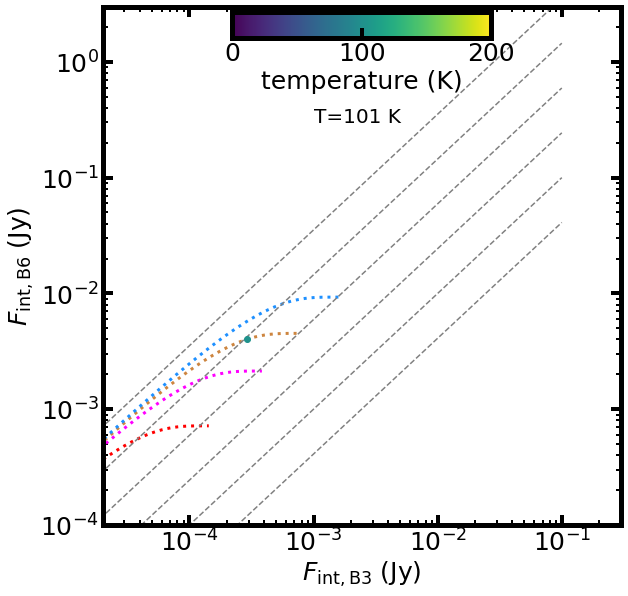

0.000723325414583087 0.005837399512529373 71.44451949646772 149.08255475127402


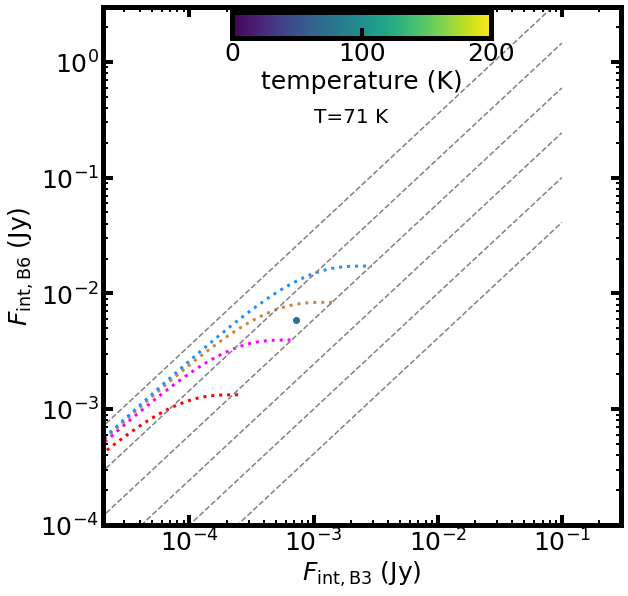

0.0003622146905399859 0.0032297095749527216 182.95500553055888 67.80113576228767


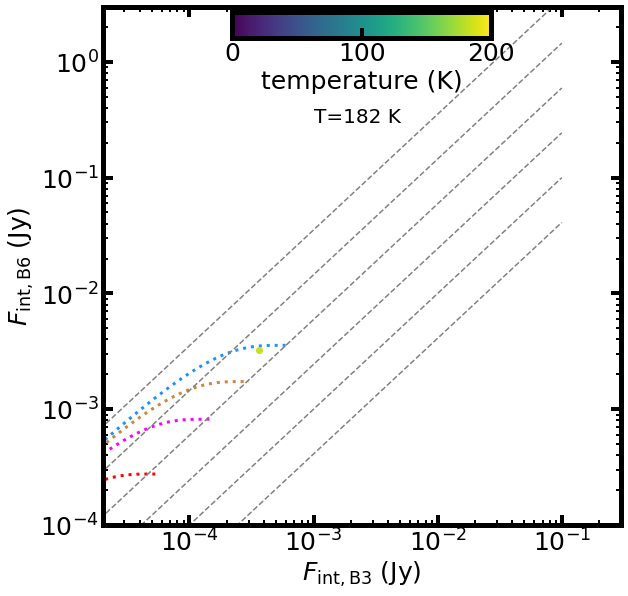

0.0002649113885127008 0.004860314540565014 nan 67.80113576228767
0.0010115148033946753 0.012647823430597782 177.00976116239957 140.3461971481459


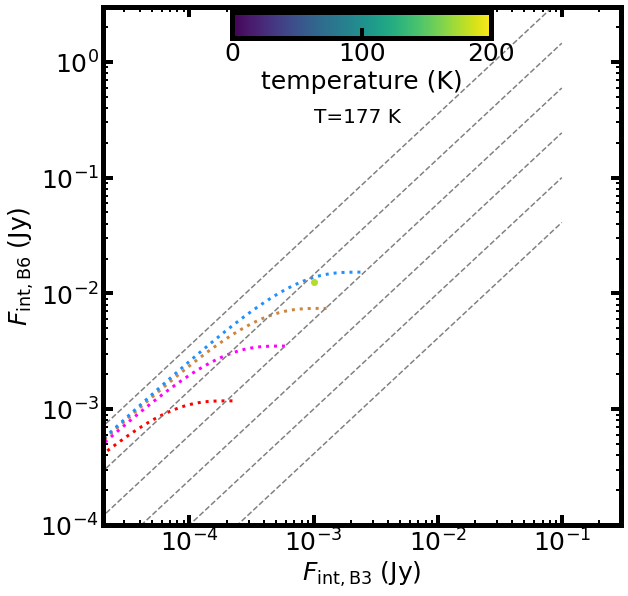

0.0002912691852543503 0.0027366483118385077 nan 140.3461971481459
0.00024948277859948575 0.0023236048873513937 nan 140.3461971481459
0.0011108798207715154 0.0020879453513771296 nan 60.875101475055516
0.0018308806465938687 0.012855528853833675 97.93782386201124 186.71745173572808


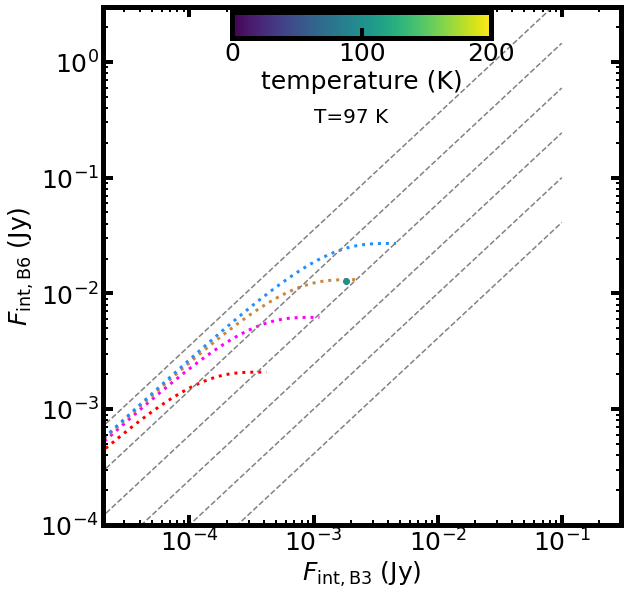

0.0011863460531458259 0.009275981225073338 66.66749353548842 194.99808812920307


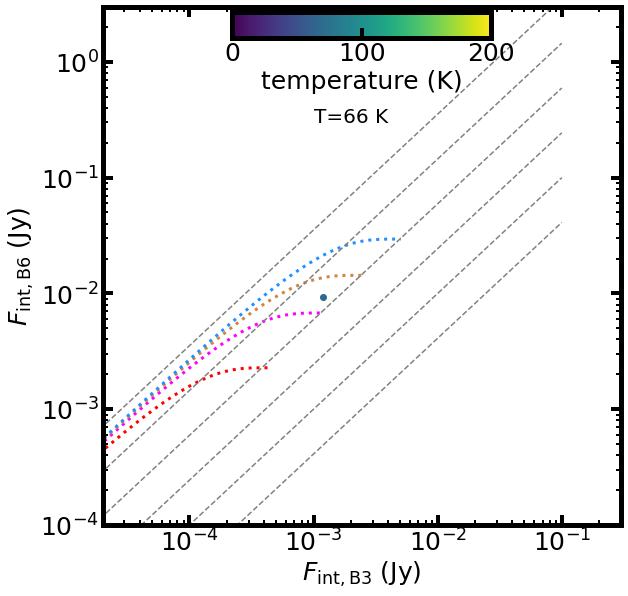

0.0012209415435791016 0.009243454784154892 121.31719968325895 141.53810935992644


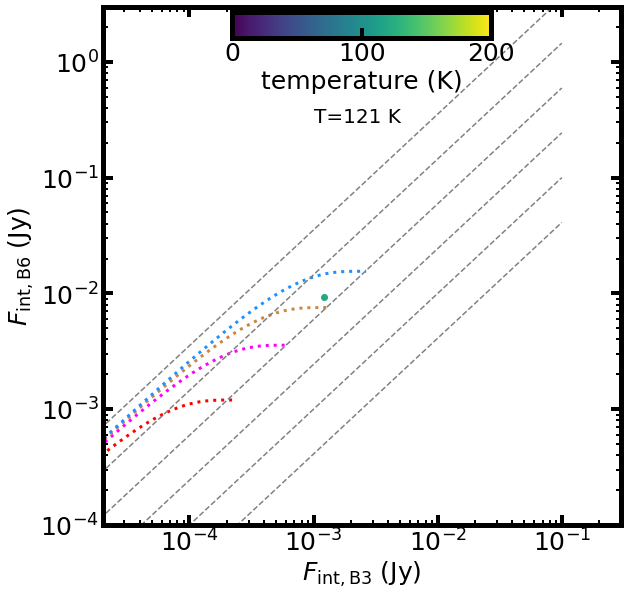

0.0005888029700145125 0.006534035317599773 94.11047501405987 138.50325726417927


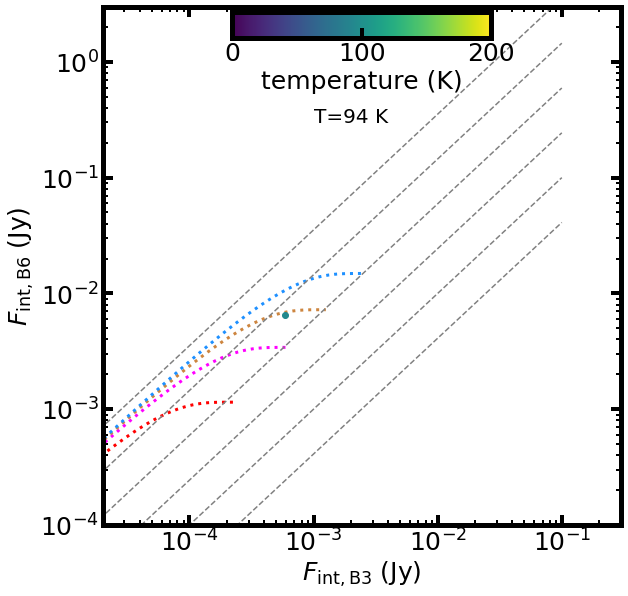

0.0006863924791105092 0.003643784439191222 nan 138.61663625608622
0.000640205922536552 0.004567628726363182 62.118736539790675 142.08245602009157


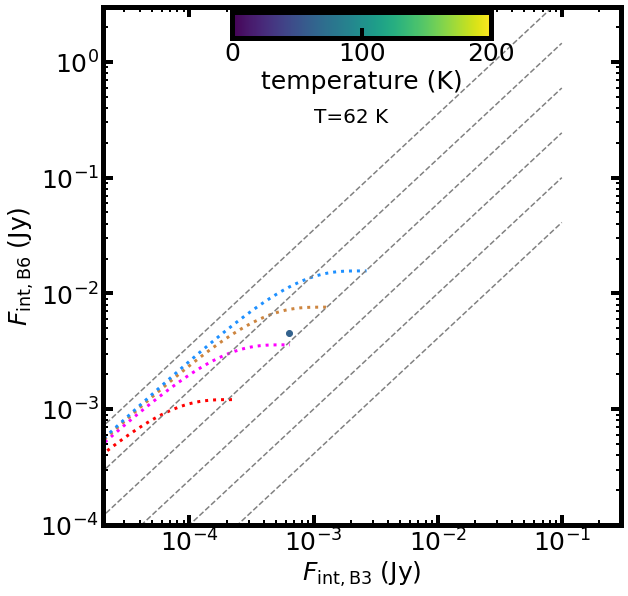

0.00022997977794148028 0.002843068912625313 125.77475708381517 79.52025426899651


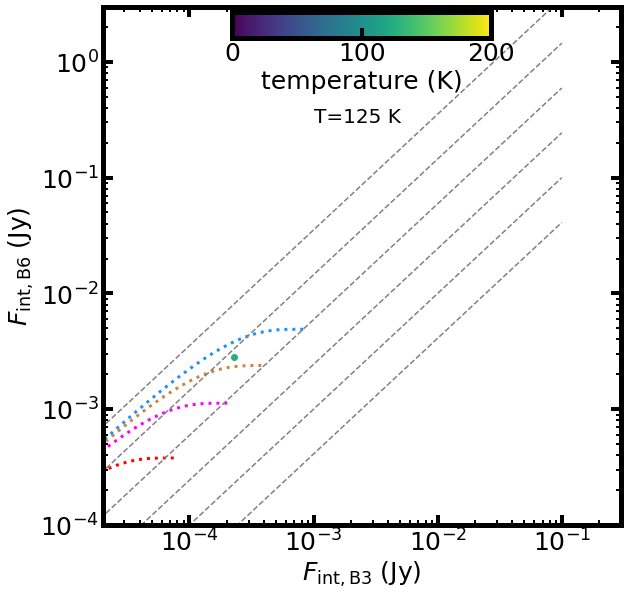

0.00048157619312405586 0.004008767195045948 49.76883166457431 150.72525361541915


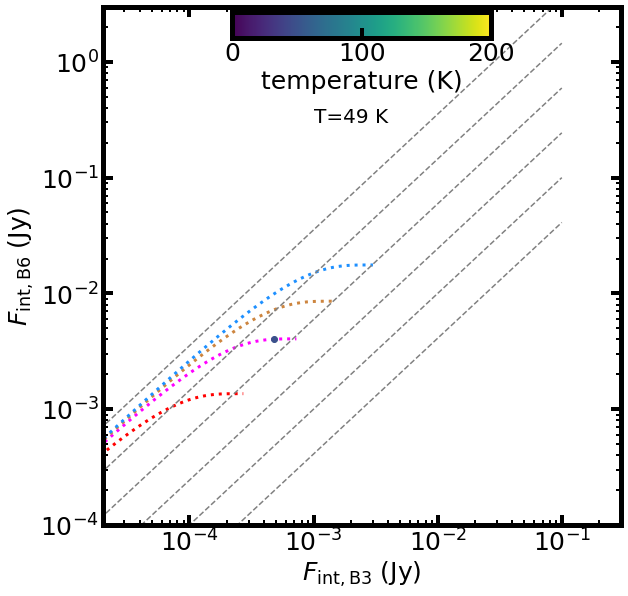

0.00022161494416650385 0.0024123312905430794 139.3986014169094 68.2329544764


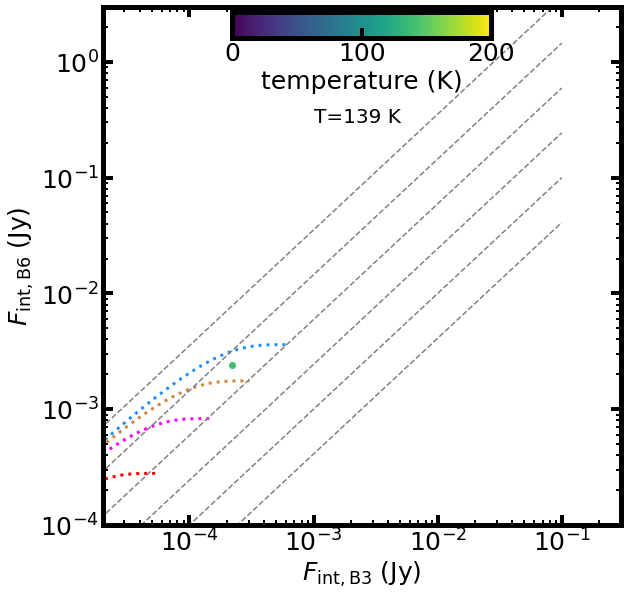

0.0005224276101216674 0.003887384431436658 36.55976677721681 176.49311227449556


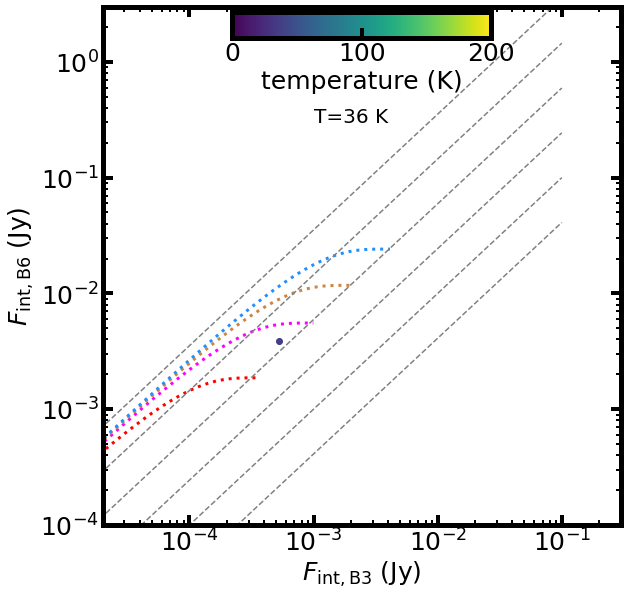

0.00022471438569482416 0.00413220189511776 131.34946312436045 108.57564094798707


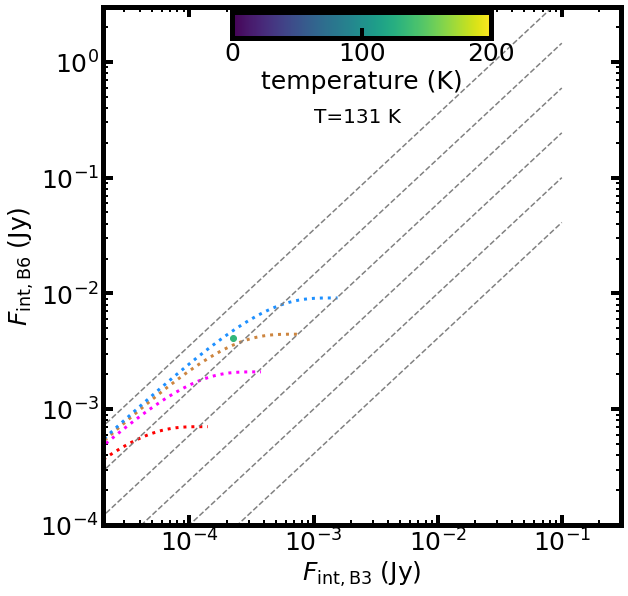

0.0006800990086048841 0.005430302117019892 35.44119506464582 212.65426064249078


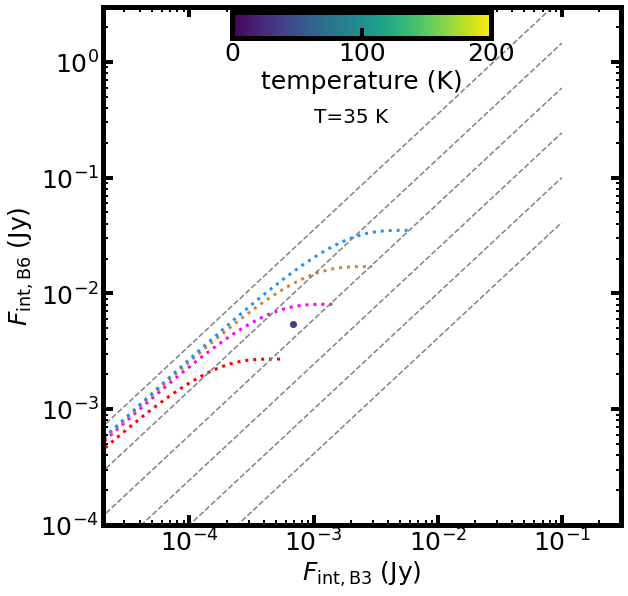

0.000837120518554002 0.005438896827399731 24.833565298661103 262.7257492540028


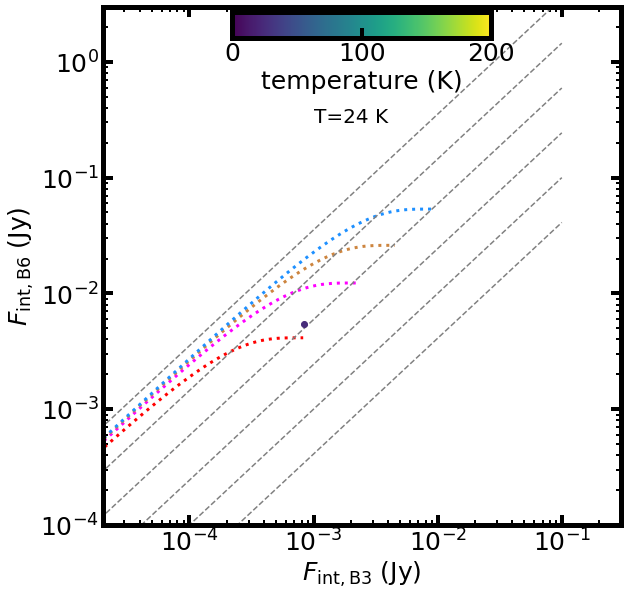

0.00018655447638593614 0.0020851795561611652 217.7297189894883 50.492193478217295


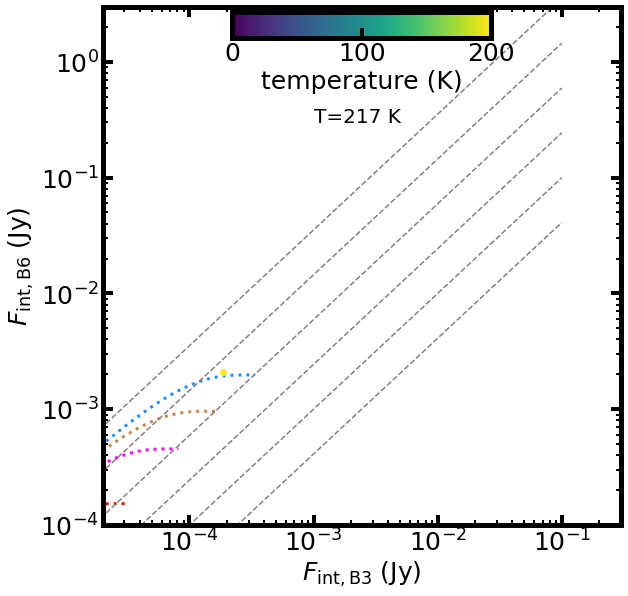

0.0005825479165650904 0.006830072961747646 92.69294603462416 143.67075124469258


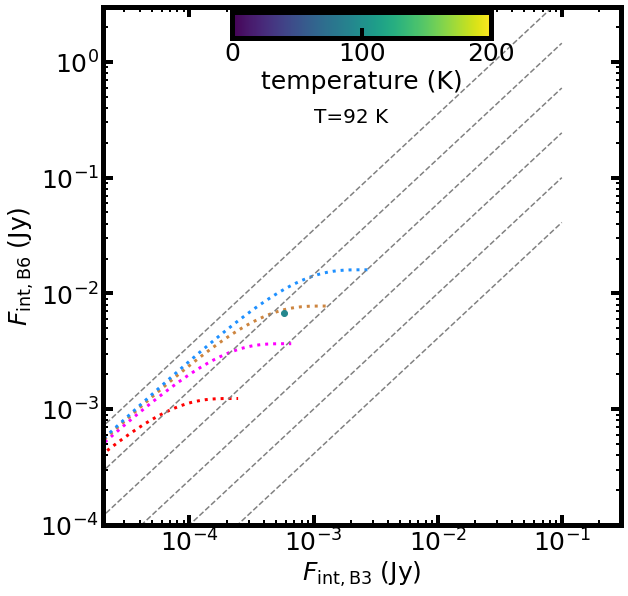

0.0029631643556058407 0.017291374504566193 73.87260750881943 251.6160454917646


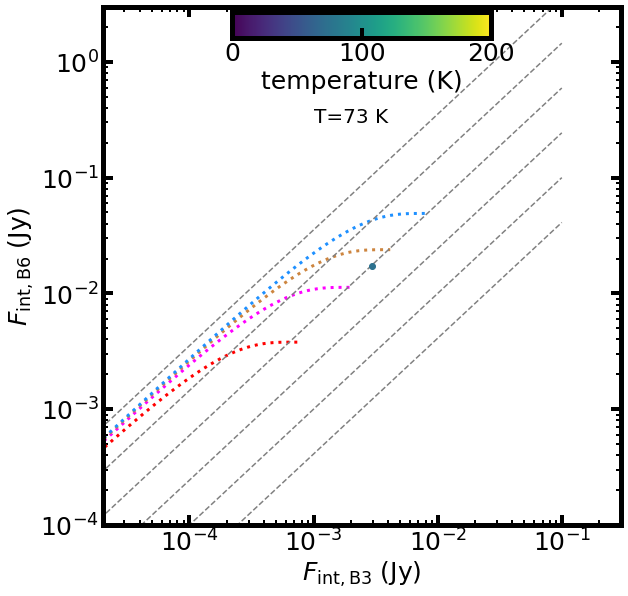

0.0007817334262654185 0.006655377335846424 69.91124624041052 161.23928623998248


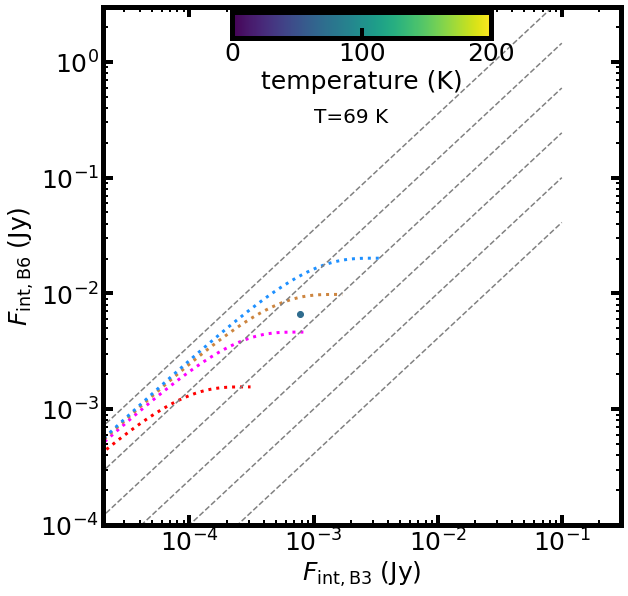

0.0012890561483800411 0.006839474197477102 nan 212.7964857342591
0.0005030257743783295 0.0071219573728740215 nan 212.7964857342591
0.0016793574905022979 0.01597253419458866 102.41389274358346 204.5894228633495


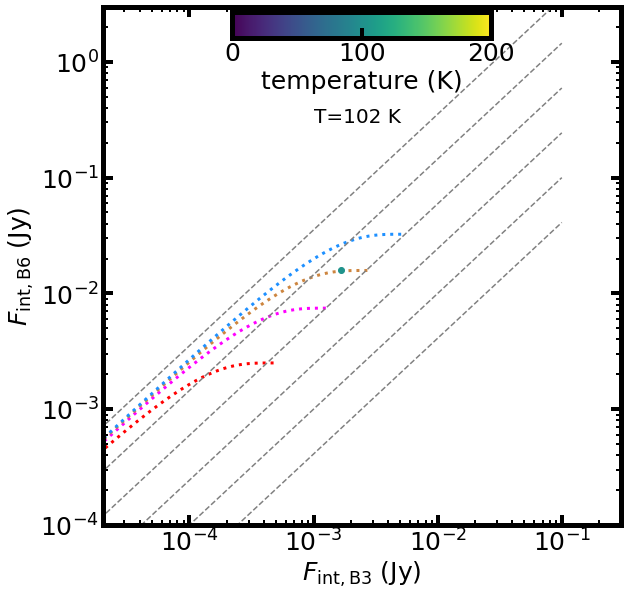

0.002507863100618124 0.01341317966580391 nan 172.14506284931386
0.003998085390776396 0.010542112402617931 nan 0.0
0.0008201099699363112 0.011844162829220295 71.98071257472839 226.37447859734692


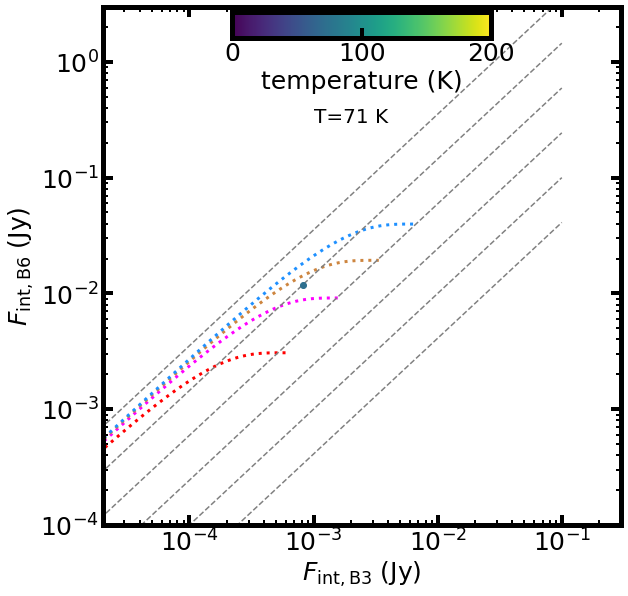

0.0015531436074525118 0.014683580957353115 222.82109052350683 130.8983595788619


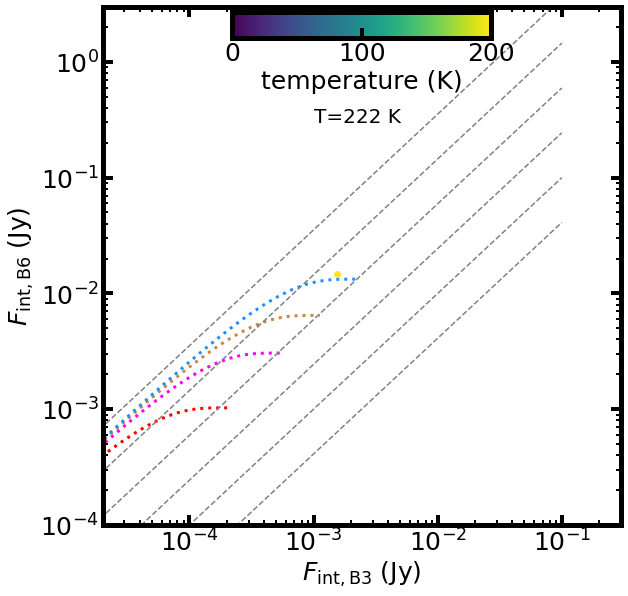

0.0013649063184857368 0.017086448147892952 57.90634850498111 297.37220417551373


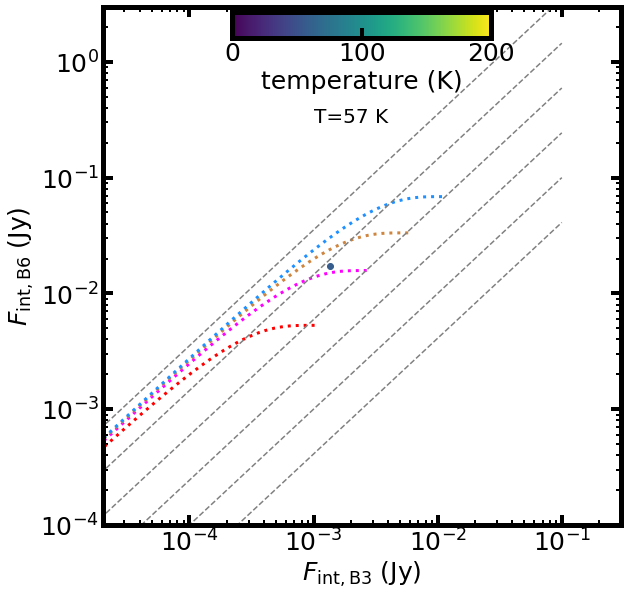

0.010856641456484795 0.03737970441579819 nan 85.33877738092002
0.0010323168244212866 0.006253501866012812 nan 85.33877738092002
0.00019100721692666411 0.0016401627799496055 29.25436937232168 131.1884219252166


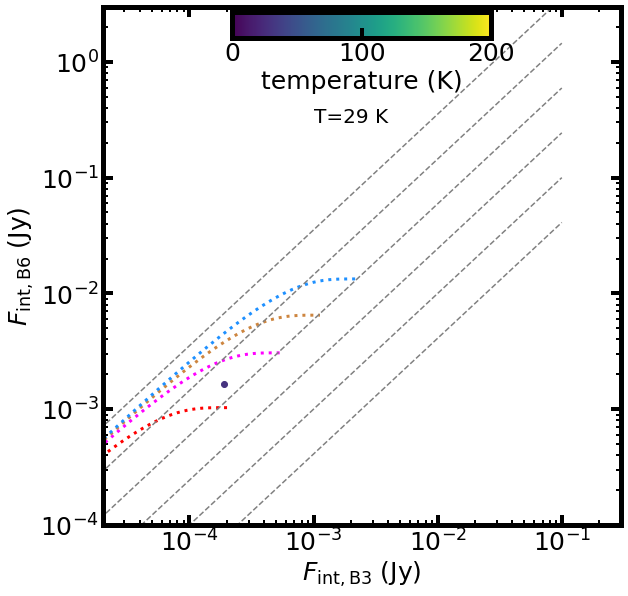

0.00018334992637392133 0.002269868040457368 47.65903660986355 120.61418561907


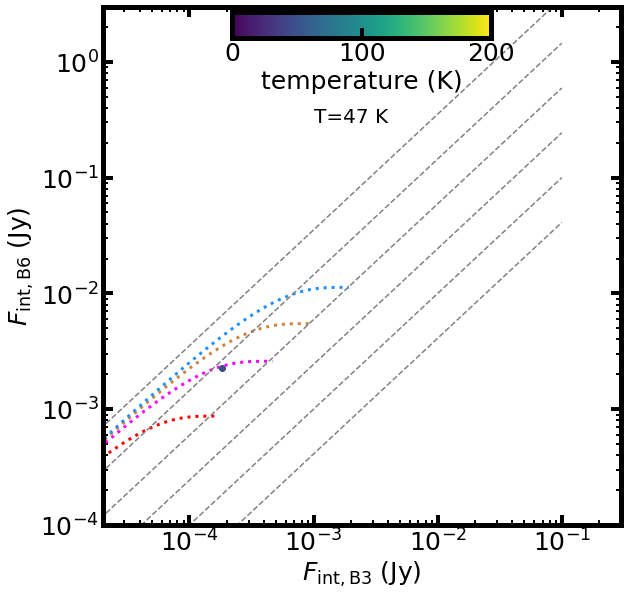

0.0011655690614134073 0.00631312932819128 nan 179.9539260189187
0.00034410154330544174 0.004282091744244099 86.12560565154244 119.5008959185772


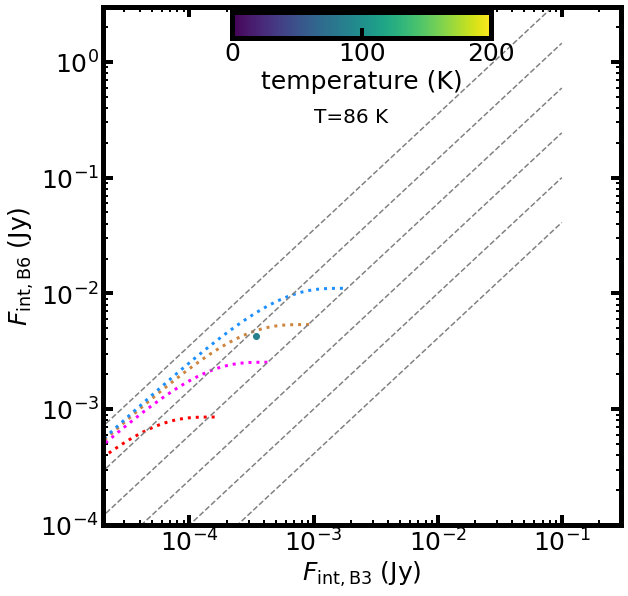

0.0003787163586821407 0.004078243393450975 16.99204070198303 300.9872256201094


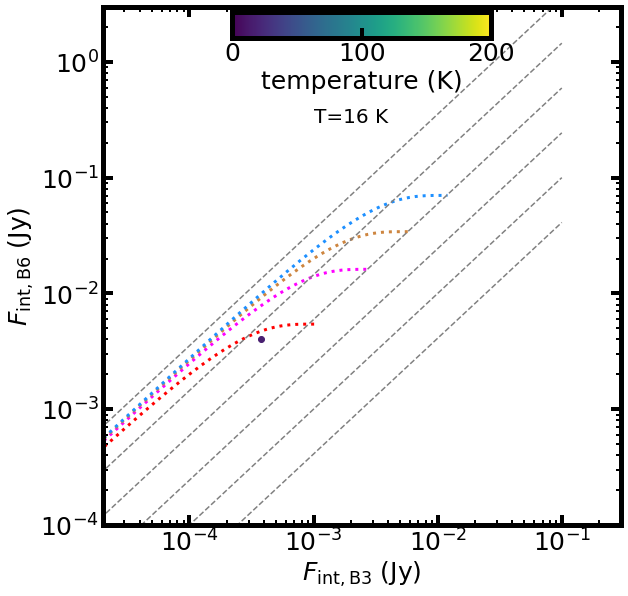

0.01166063267737627 0.052054934203624725 nan 194.7266931233552
0.06072087585926056 0.051788777112960815 nan 490.3061113928724
0.00015749425801914185 0.0011411147424951196 nan 490.3061113928724
0.0011846469715237617 0.00927072111517191 40.356705294673844 257.7113803169882


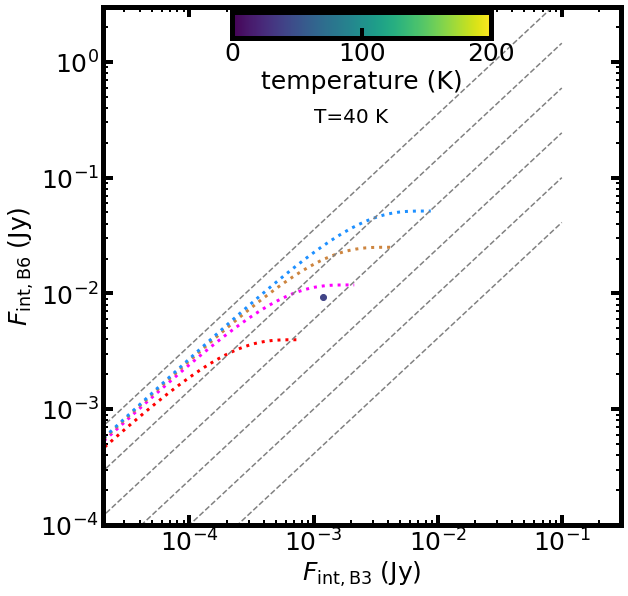

0.0007429184042848647 0.003984416835010052 nan 0.0
0.000245553208515048 0.0024525548797100782 46.97173678020224 122.79127885533714


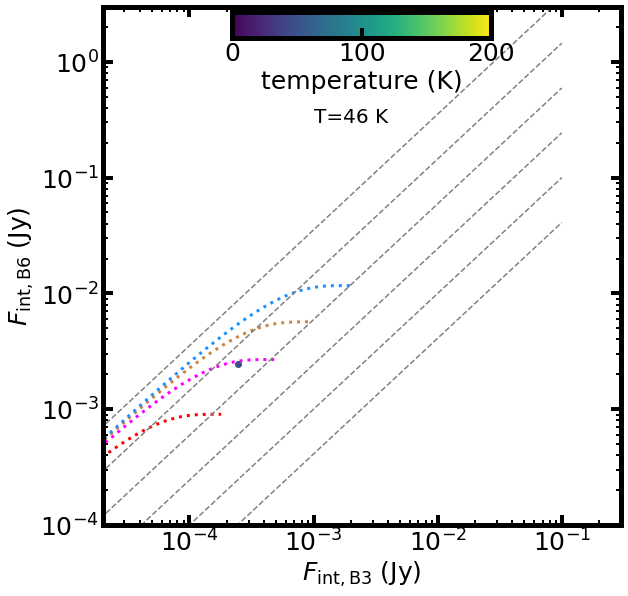

0.0005175493424758315 0.006493736989796162 29.723598425134945 271.7333641058114


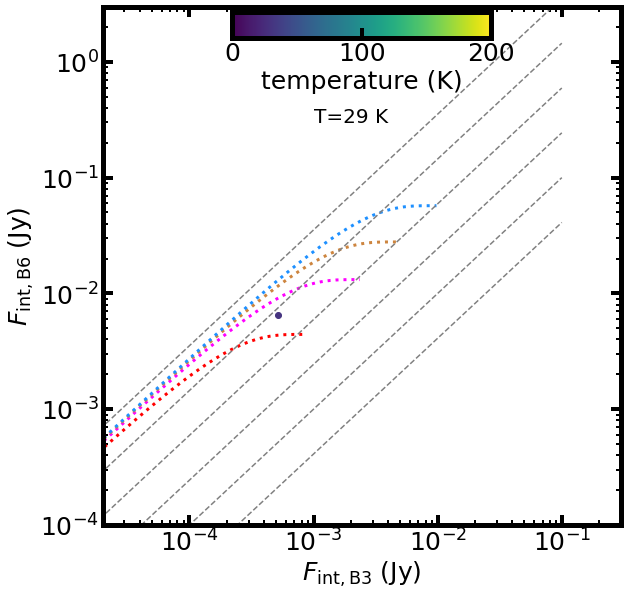

0.00019110650464426726 0.0020323889330029488 42.16722638107578 119.61900885875754


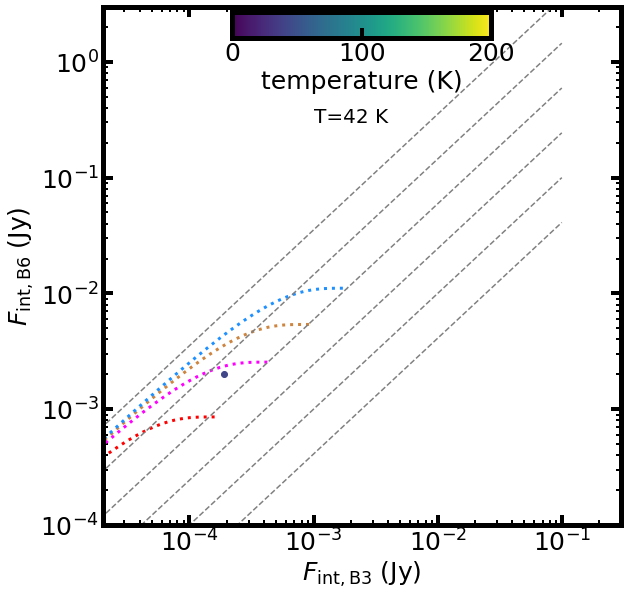

0.002756155328825116 0.01677277870476246 55.358601632828076 289.9190660060032


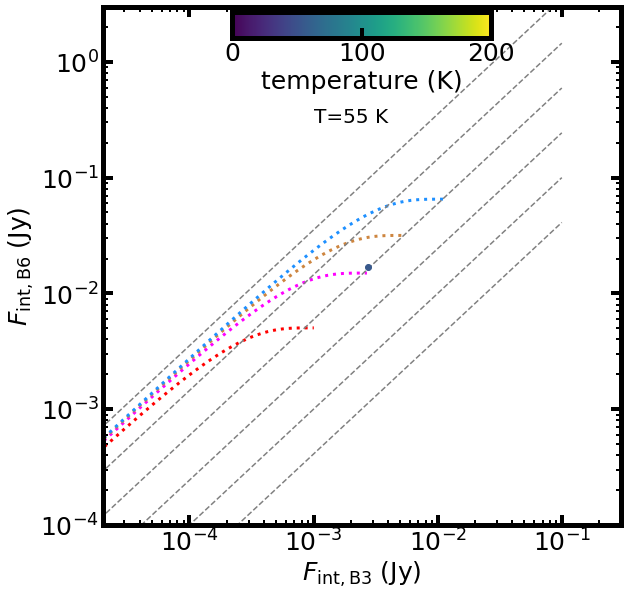

0.00026219236315228045 0.0016396812861785293 47.33857325950052 98.87490362130949


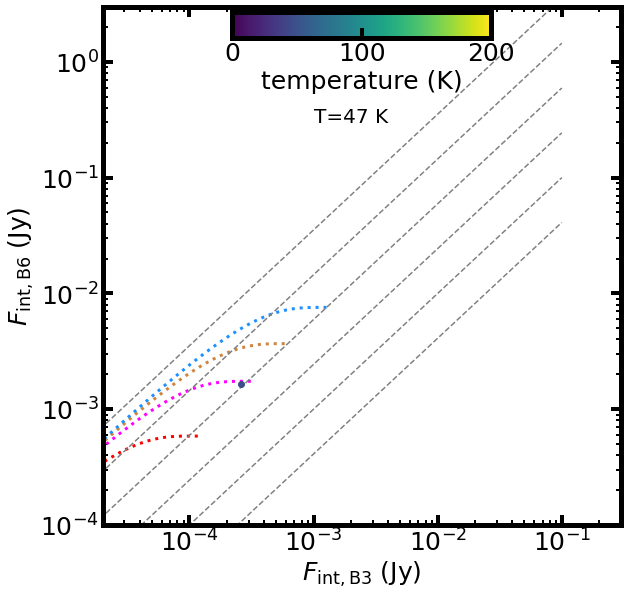

0.0010210442123934627 0.010510486550629139 124.89352004013872 150.17418970678222


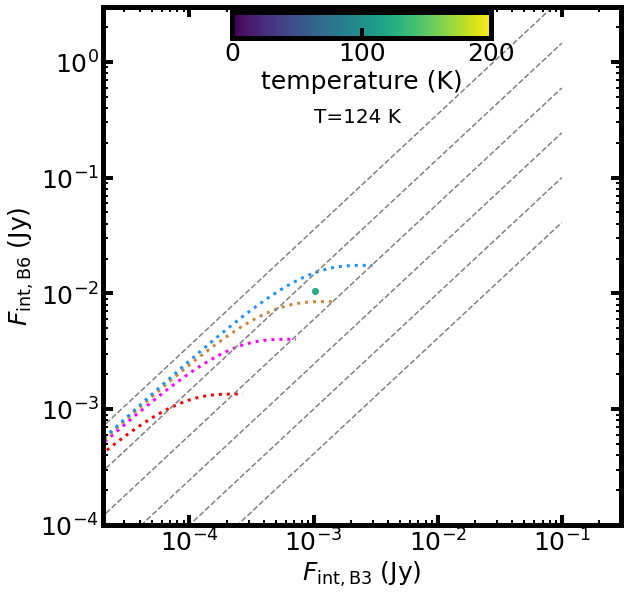

0.000876446720212698 0.0071525899693369865 65.44803977512925 173.08385322567568


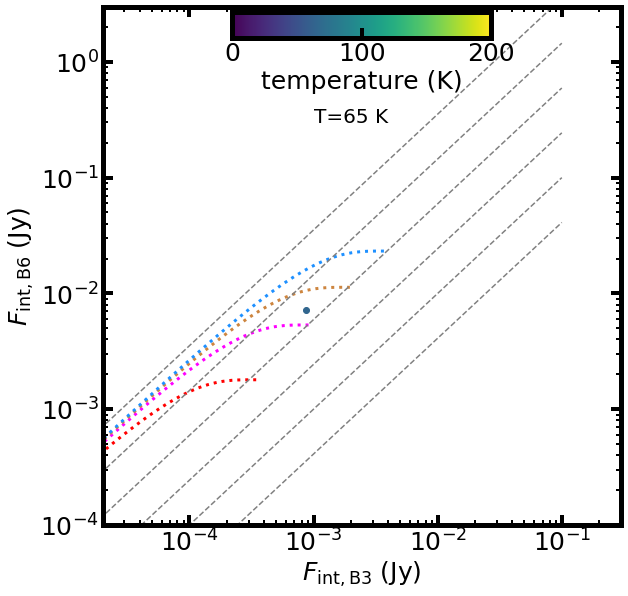

0.0011923987185582519 0.006806893274188042 39.39425066173162 223.51765928346887


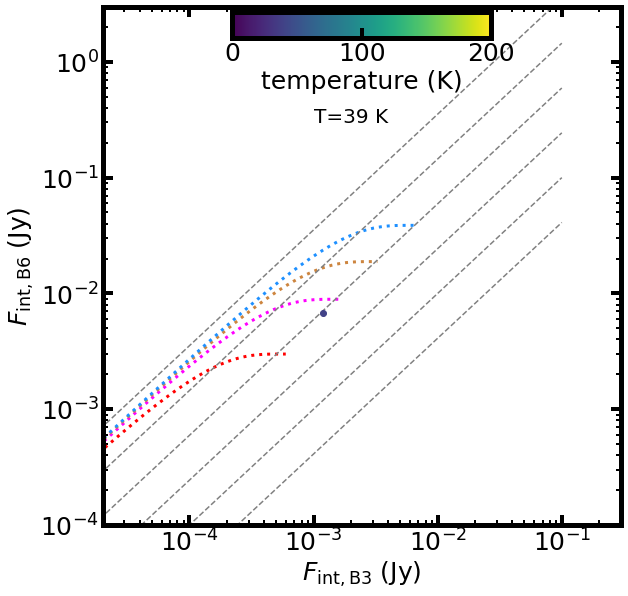

0.0003129806718789041 0.0030180548783391714 65.42883282047187 113.1489236113718


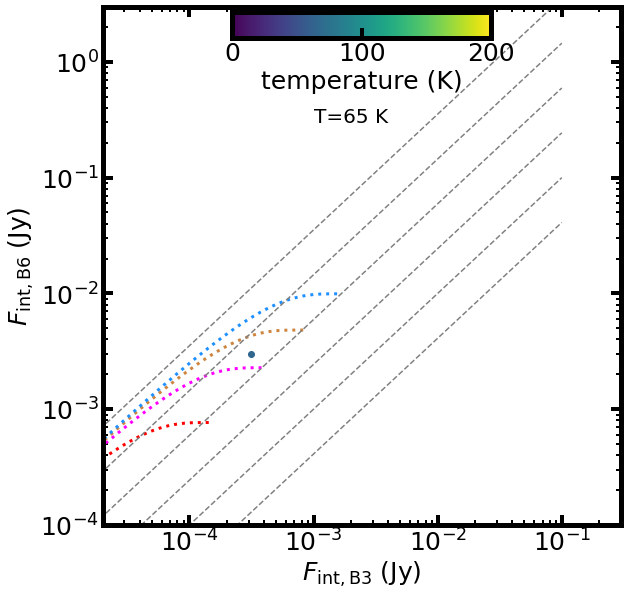

0.00033407105365768075 0.0038732998073101044 31.24442079999512 199.99275777741244


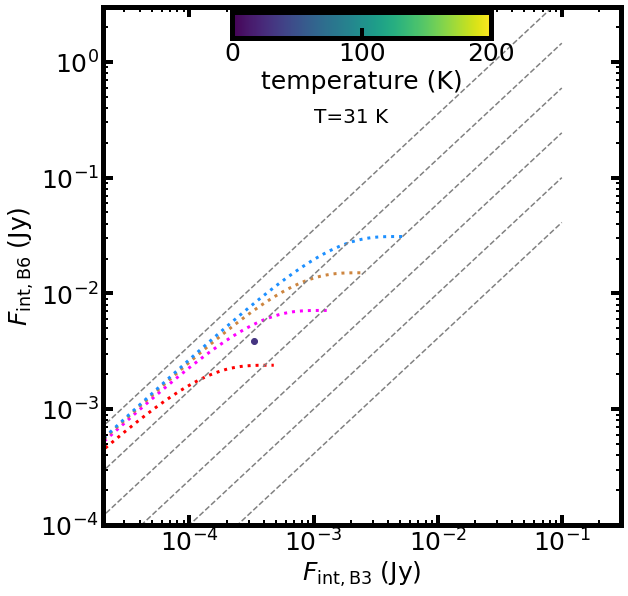

0.0005263125640340149 0.005293559283018112 63.632550339233845 152.5699121641343


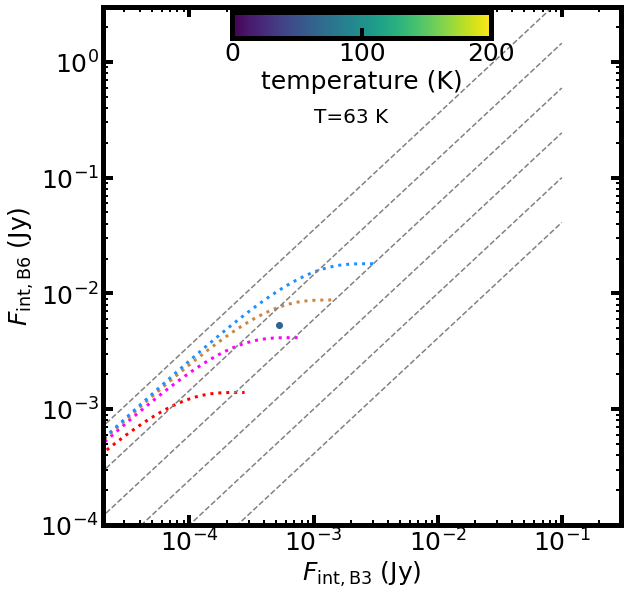

0.00033711272408254445 0.0034213049802929163 32.38856013439316 180.30448134825127


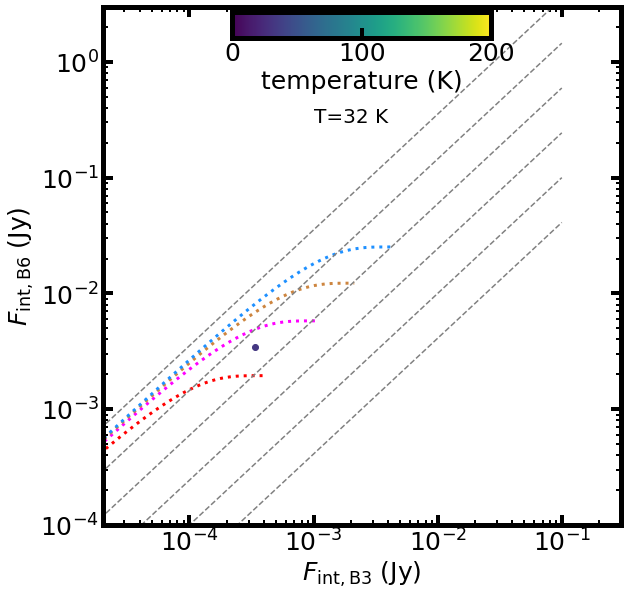

0.0005835084011778235 0.004446803126484156 33.9801349263206 197.0673224506127


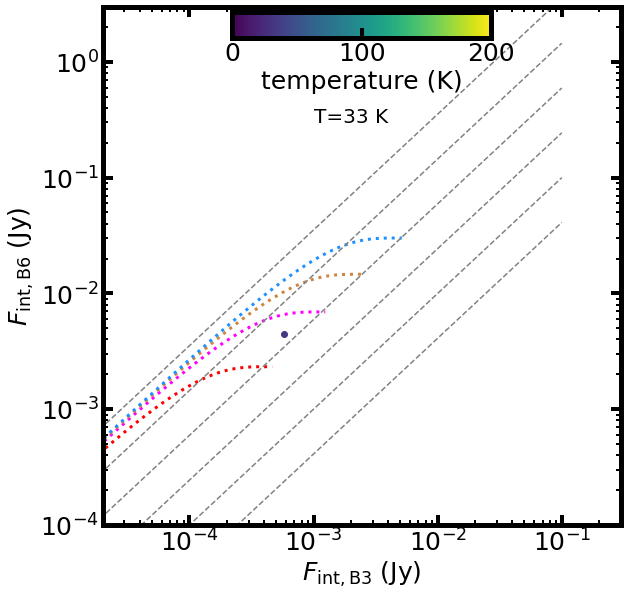

0.0003616974572651088 0.005772543139755726 78.65728154557351 156.40316577195543


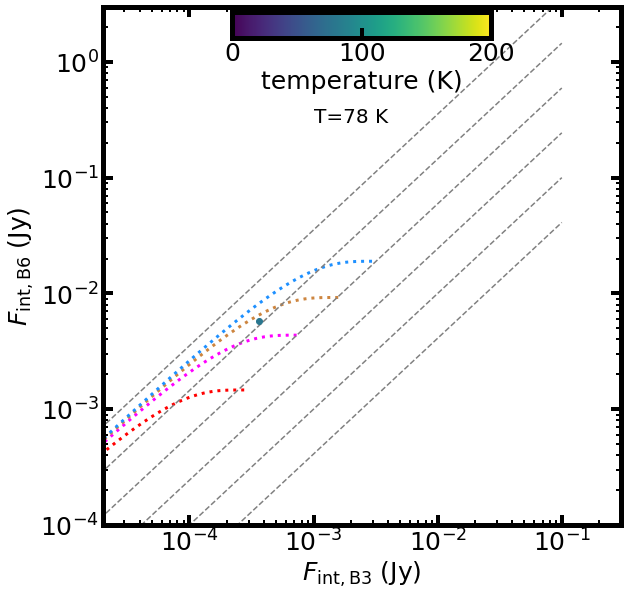

0.001107288640923798 0.008714394643902779 35.64777405905364 268.4029601585717


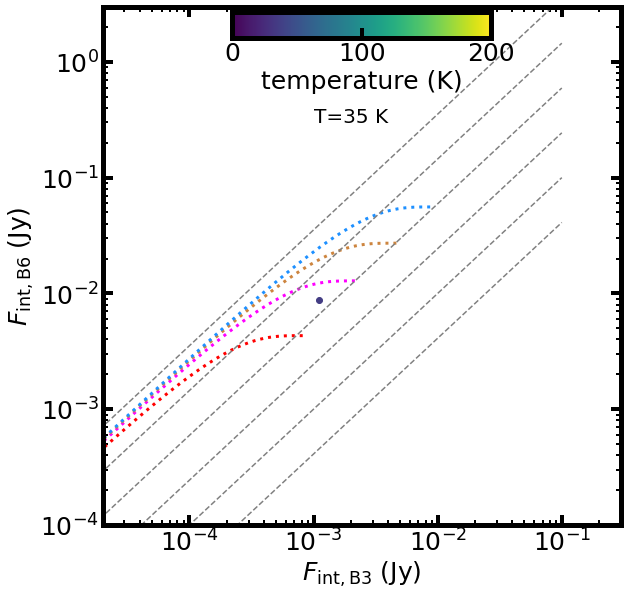

0.0005270488909445703 0.005706137511879206 47.21856984853692 188.40674144202873


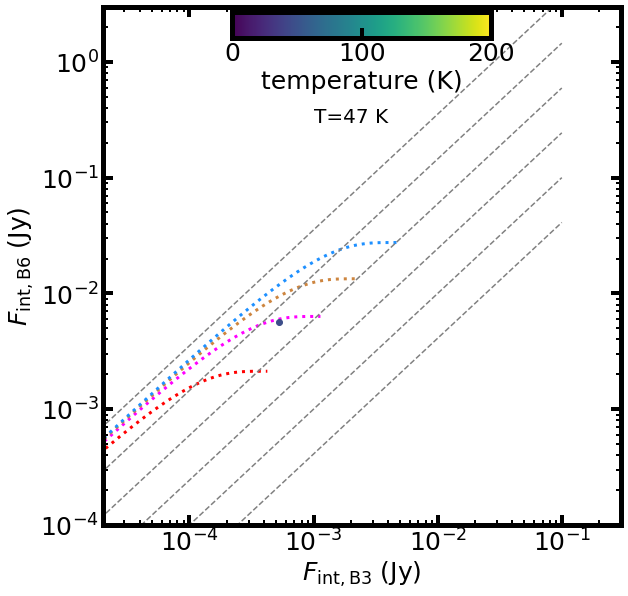

0.00042066629976034164 0.006499127484858036 75.59474950357702 167.87277878298787


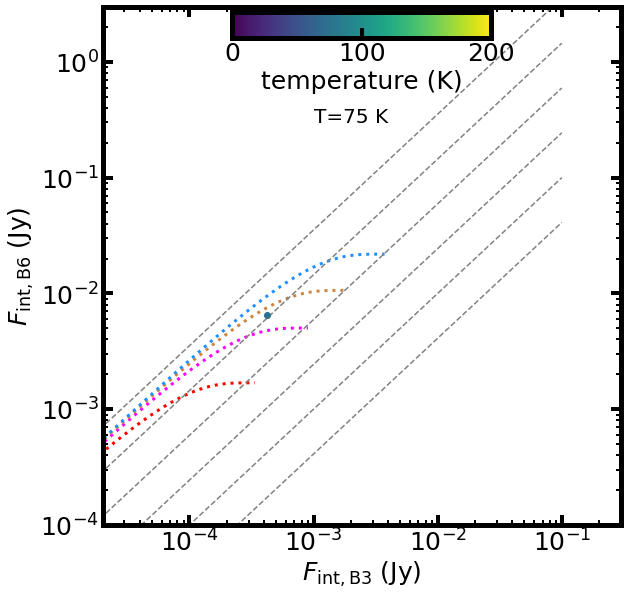

0.0008017705986276269 0.00587966525927186 82.3553307855793 138.47417709506848


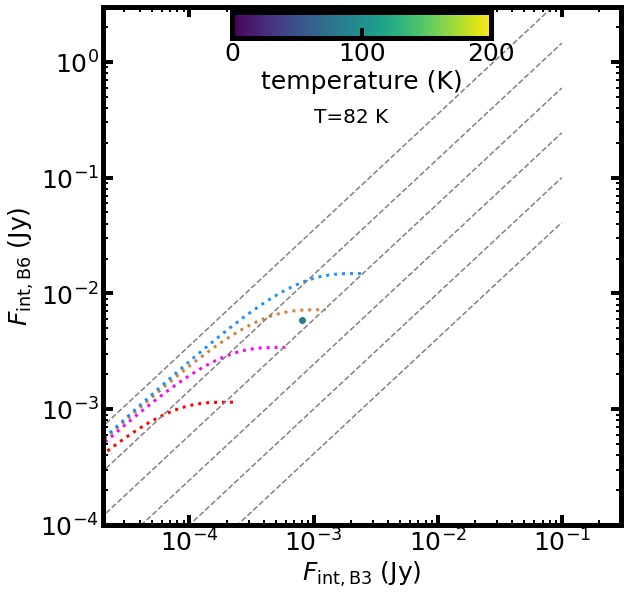

0.0003715365019161254 0.002700451295822859 56.20398964806808 115.41810598340884


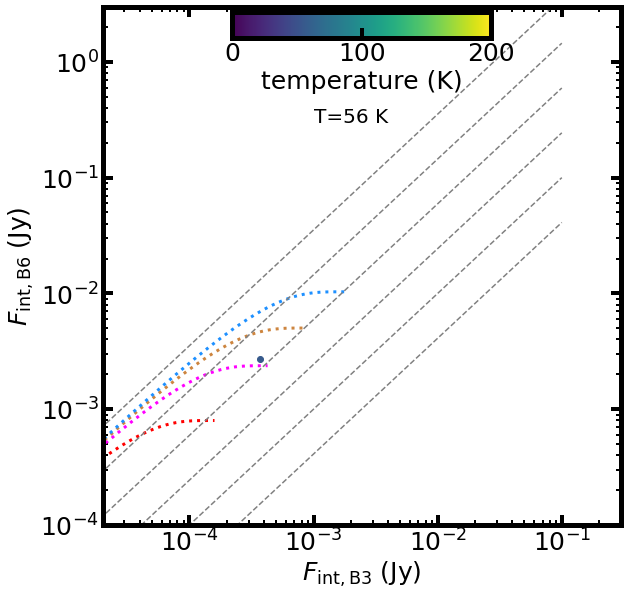

0.00020322049385868013 0.0018079353030771017 29.62829213562284 136.9977594070138


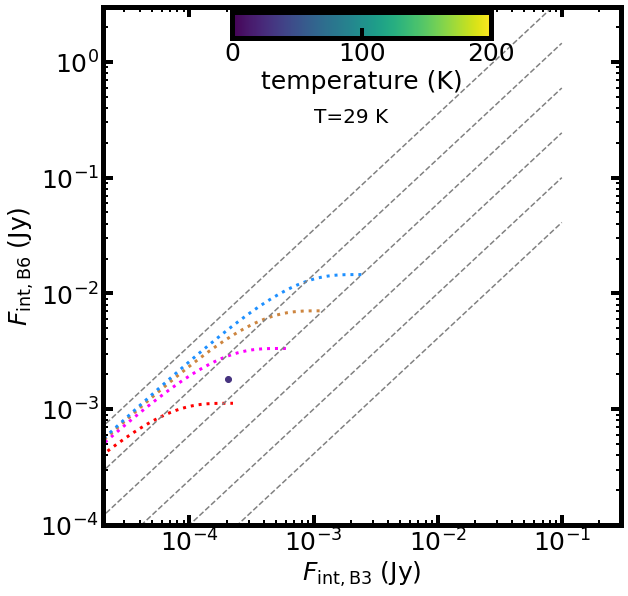

0.0010251844068989158 0.008310596458613873 62.67872013282123 190.99454414090408


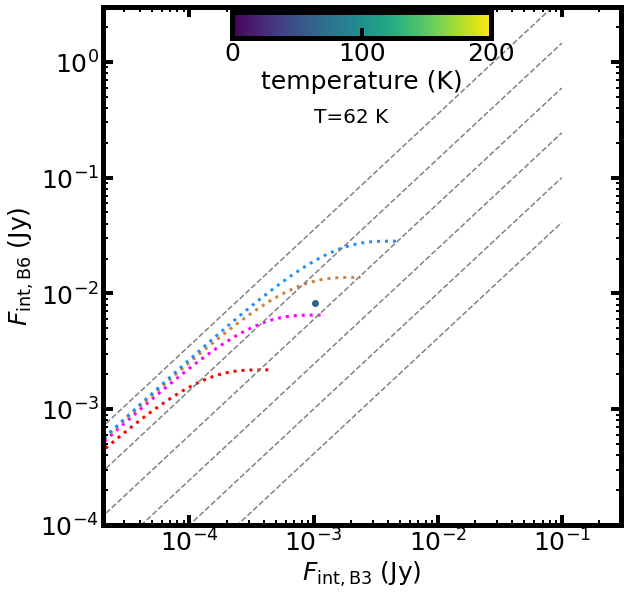

0.0002016635990003124 0.0017015315825119615 67.16176566938262 83.30403622454473


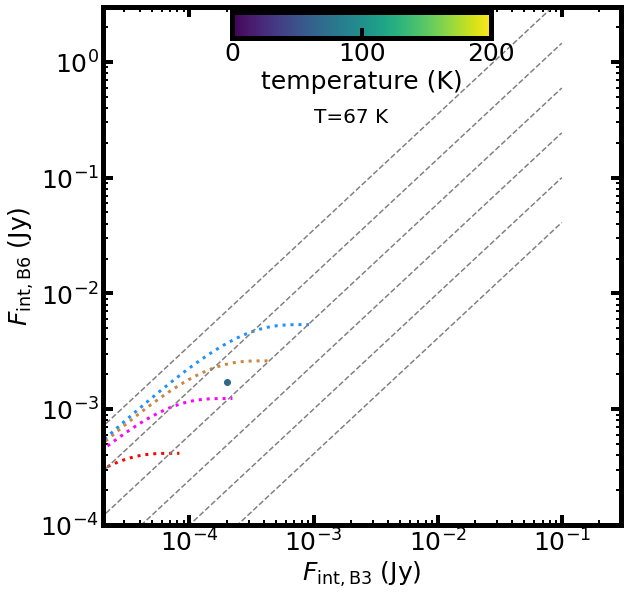

0.00026242659077979624 0.0008660375024192035 nan 83.30403622454473
0.0005867637228220701 0.0038312477990984917 929.1799519397701 32.268181539311094


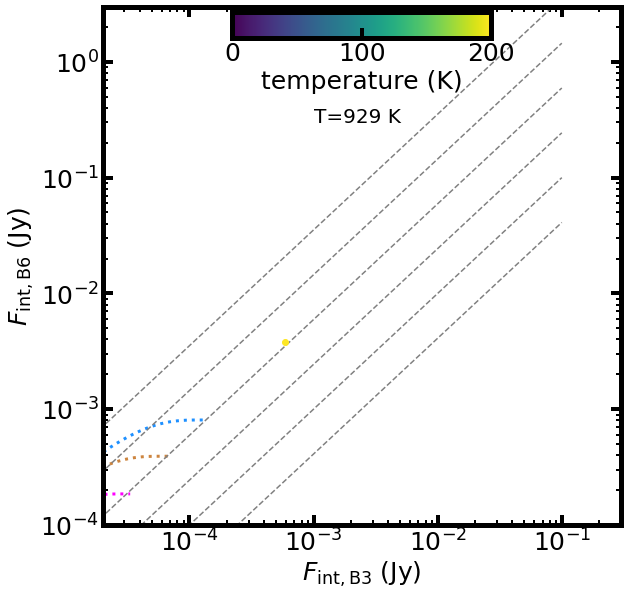

0.0003063970652874559 0.0019097129115834832 73.49725431469561 83.84921268755186


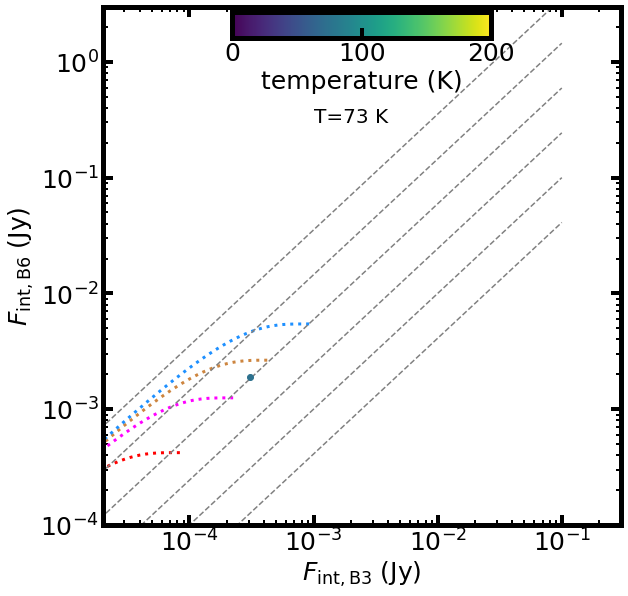

0.00036977886338718235 0.003950049169361591 108.61813335262624 99.41402729315693


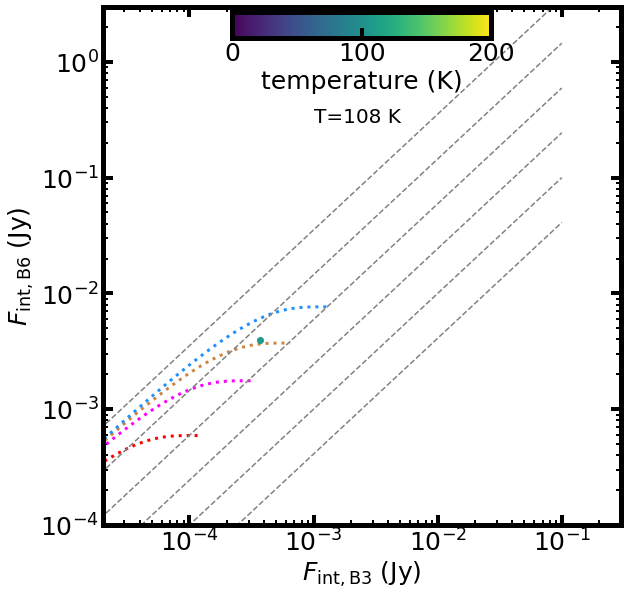

0.0002813786268234253 0.0032258392311632633 0.9956593886580315 1637474149.6094482


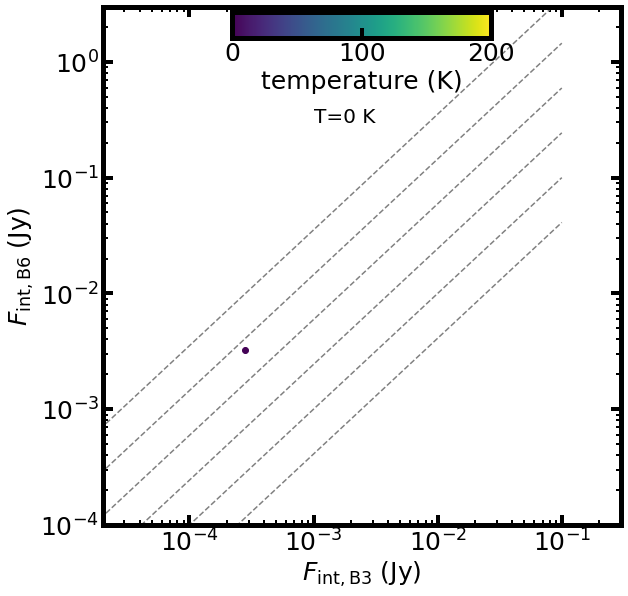

0.0002823786926455796 0.00037085407560609587 nan 1637474149.6094482
0.0003192986187059432 0.00037085407560609587 nan 1637474149.6094482
0.0008913062047213316 0.00037085407560609587 nan 1637474149.6094482
0.0005091436323709786 0.00037085407560609587 nan 1637474149.6094482
0.0002700852055568248 0.00037085407560609587 nan 1637474149.6094482
0.0014215386472642422 0.00037085407560609587 nan 1637474149.6094482
0.00020523018611129373 0.00037085407560609587 nan 1637474149.6094482
0.00016292897635139525 0.00037085407560609587 nan 1637474149.6094482
0.00016722935833968222 0.00037085407560609587 nan 1637474149.6094482
0.0001717081613605842 0.00037085407560609587 nan 1637474149.6094482
0.0001943312381627038 0.00037085407560609587 nan 1637474149.6094482
6.196613036688237e-05 0.006300941575318575 nan 1637474149.6094482
6.196613036688237e-05 0.0024589793756604195 nan 1637474149.6094482
6.196613036688237e-05 0.004289872013032436 nan 1637474149.6094482
6.196613036688237e-05 0.003282790770754218 nan 163

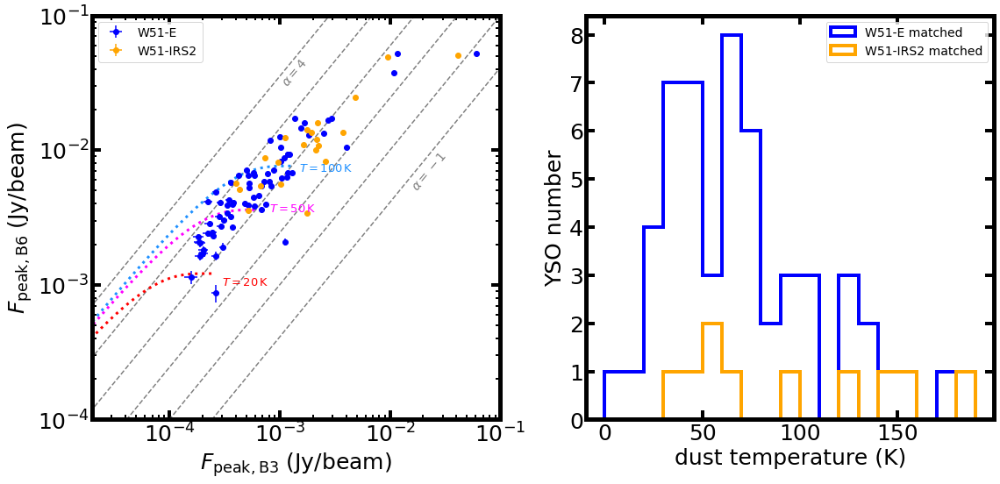

In [22]:
temp_yso_arr_w51e = make_temp_hist(w51e_peak_flux_b3, w51e_peak_flux_b6,w51e_b6_avg_size, surf_den, temparr, freq93, freq225, w51eind2,plot=True )
temp_yso_arr_w51n = make_temp_hist(w51n_peak_flux_b3, w51n_peak_flux_b6,w51n_b6_avg_size, surf_den, temparr, freq93, freq225, w51nind2 )
fig = plt.figure(figsize=(17,8))
ax1 = fig.add_axes([0.12,0.15,0.38,0.8])
ax2 = fig.add_axes([0.58,0.15,0.38,0.8])

ax1.errorbar(w51e_peak_flux_b3[w51eind], w51e_peak_flux_b6[w51eind], xerr=w51e_b3_err, yerr=w51e_b6_err,fmt='o',c='b', label='W51-E')
ax1.errorbar(w51n_peak_flux_b3[w51nind], w51n_peak_flux_b6[w51nind], xerr=w51n_b3_err, yerr=w51n_b6_err,fmt='o',c='orange', label='W51-IRS2')

b3freq = 92982346121.91989 
b6freq = 226691598706.70853
spectral_indices=[-1,0,1,2,3,4]
for si in spectral_indices:
    ax1.plot([1e-5,1e-1],10**(np.log10([1e-5,1e-1]) - np.log10(b3freq/b6freq) * si), c='grey',ls='dashed')
ax1.text(1e-3,3e-2,r'$\alpha=4$',rotation=50,fontsize=14,c='gray')

ax1.text(1.5e-2,5e-3,r'$\alpha=-1$',rotation=50,fontsize=14,c='gray')
ax1.plot(b3flux_20, b6flux_20, c='r', ls='dotted',lw=3)
ax1.plot(b3flux_50, b6flux_50, c='magenta', ls='dotted',lw=3)
ax1.plot(b3flux_100, b6flux_100, c='dodgerblue', ls='dotted',lw=3)
ax1.text(1.5e-3,7e-3,r'$T=100\,{\rm K}$',c='dodgerblue',fontsize=13)
ax1.text(8e-4,3.5e-3,r'$T=50\,{\rm K}$',c='magenta',fontsize=13)
ax1.text(3e-4,1e-3,r'$T=20\,{\rm K}$',c='r',fontsize=13)
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel(r'$F_{\rm peak, B3}$ (Jy/beam)')
ax1.set_ylabel(r'$F_{\rm peak, B6}$ (Jy/beam)')
ax1.set_xlim(2e-5,1e-1)
ax1.set_ylim(1e-4,1e-1)
ax1.legend(fontsize=14)


tempbin = np.arange(0,200,step=10)


ax2.hist(temp_yso_arr_w51e, bins=tempbin, facecolor='none',edgecolor='b', histtype='step',label='W51-E matched',lw=4)
ax2.hist(temp_yso_arr_w51n, bins=tempbin, facecolor='none',edgecolor='orange', histtype='step',label='W51-IRS2 matched',lw=4)
ax2.set_xlabel('dust temperature (K)')
ax2.set_ylabel('YSO number')
ax2.legend(fontsize=14)
plt.savefig('flux_flux.png')

0.0005865685801980568 0.006688137605271487 71.65969821697556 162.9451911989364


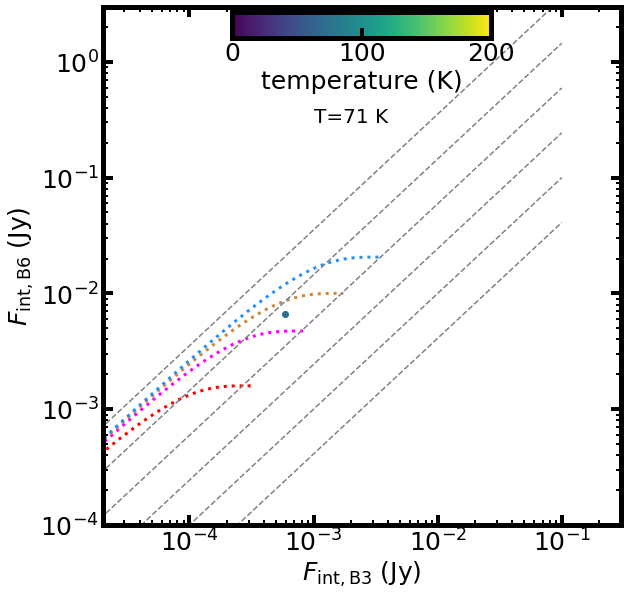

0.0020729694756933177 0.12408639869796285 4999 971.7487379795192


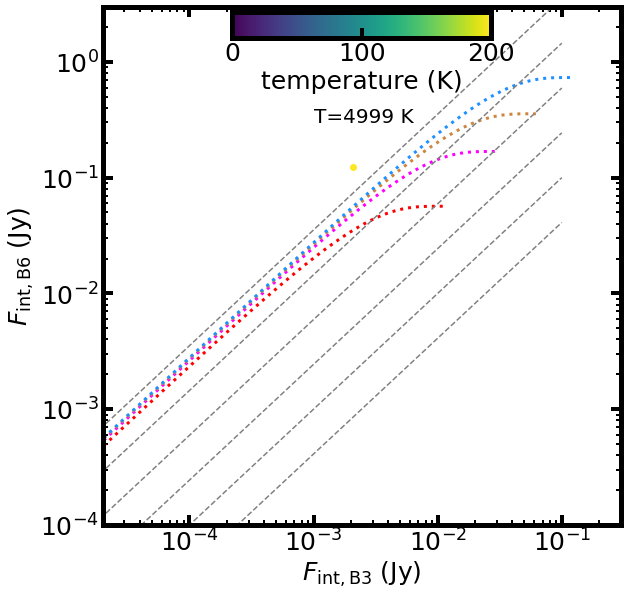

0.0006222344519150951 0.0035310445973215014 nan 86.43512855609411
0.0002523743117323614 0.006369556671769133 nan 86.43512855609411
0.0020991947069285925 0.028673988865488113 166.58172068058562 222.13976218836217


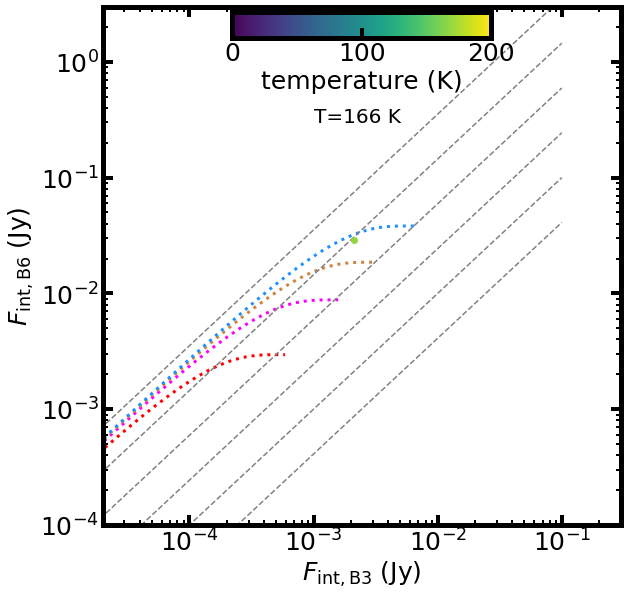

0.00037515503512167793 0.00387623342983852 nan 222.13976218836217
0.0003380620296481779 0.002745010866296234 nan 222.13976218836217
0.0019107592717923826 0.003249904952496175 nan 81.43803071170477
0.003917385633544493 0.030514075394097083 171.55036463586305 214.8513660274108


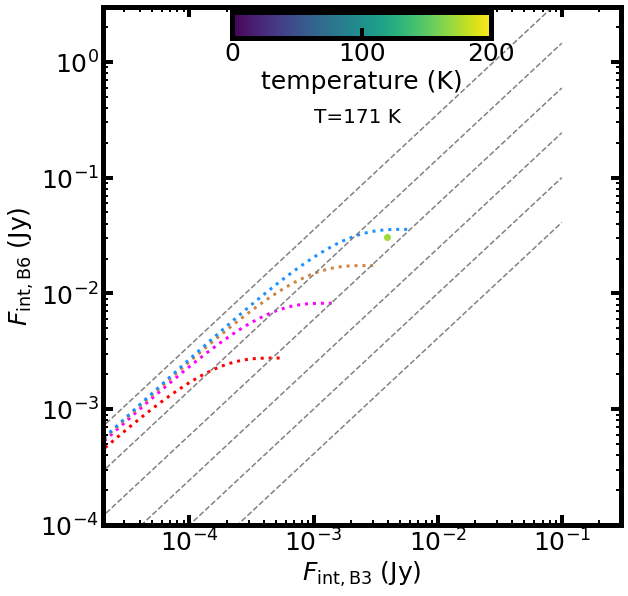

0.003003972823396757 0.026445204207878048 84.93220508013916 289.8205864471958


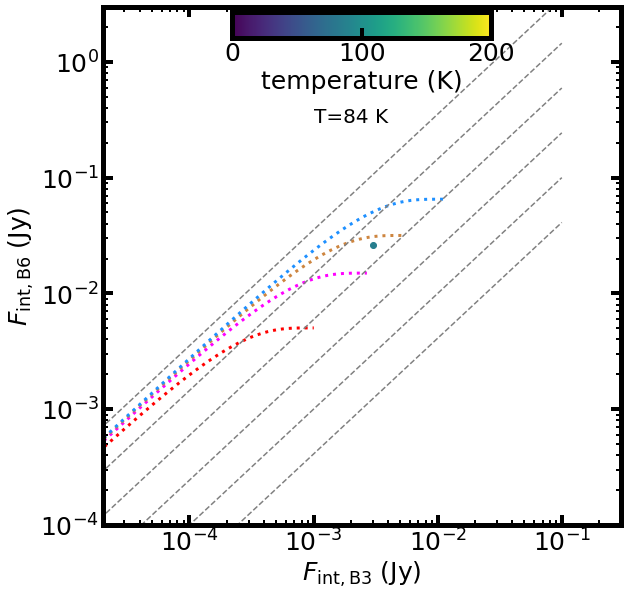

0.0024977907170130797 0.019437552025959638 101.92764027473198 224.9544853408744


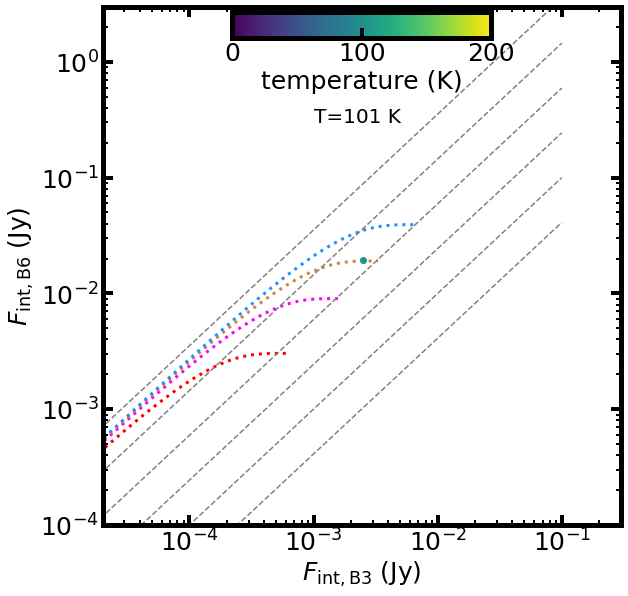

0.0008279680863168688 0.012885580272617169 87.53353107857728 218.53215836101262


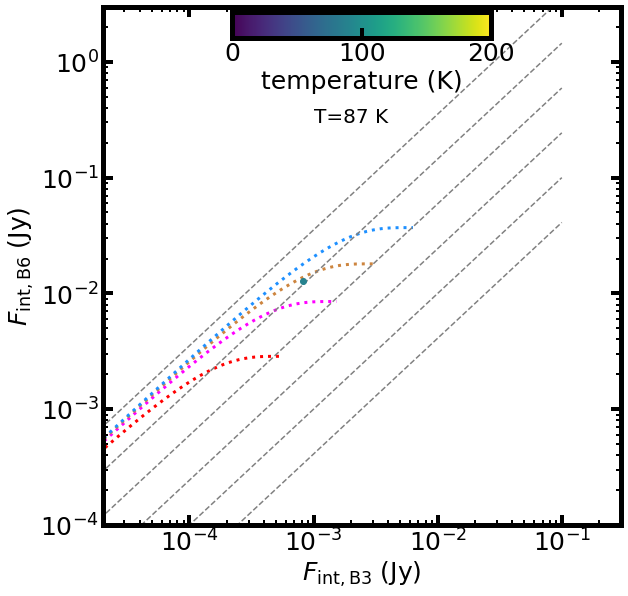

0.0013649457461969207 0.006739543514629275 nan 262.8050957682639
0.0015560767436361784 0.011168745601525686 33.128501044174946 316.6888207799884


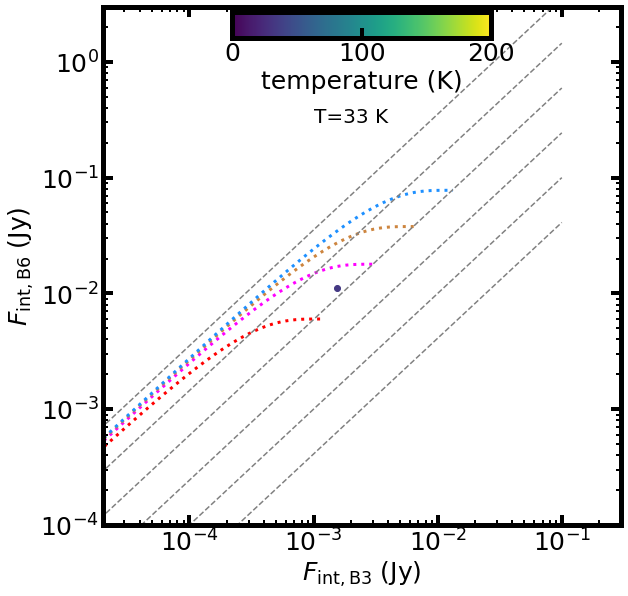

0.0004094084071910979 0.005720763722221932 32.21684017936839 251.041357778636


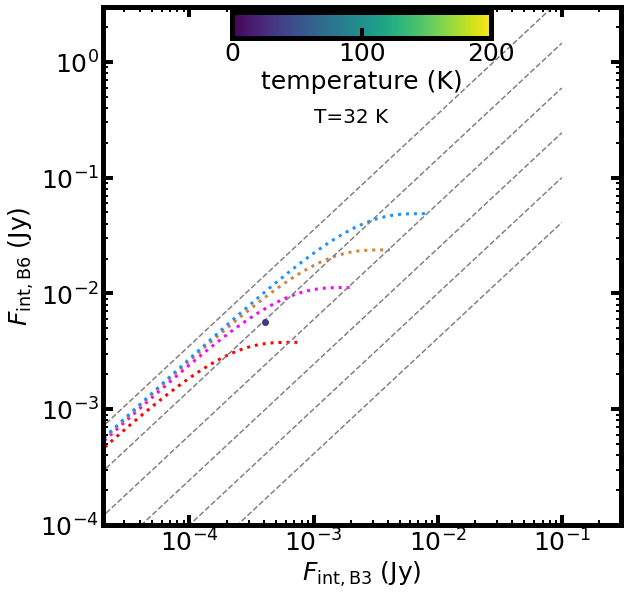

0.0008959355396379989 0.00924565976573736 62.17504771159095 204.8417475243473


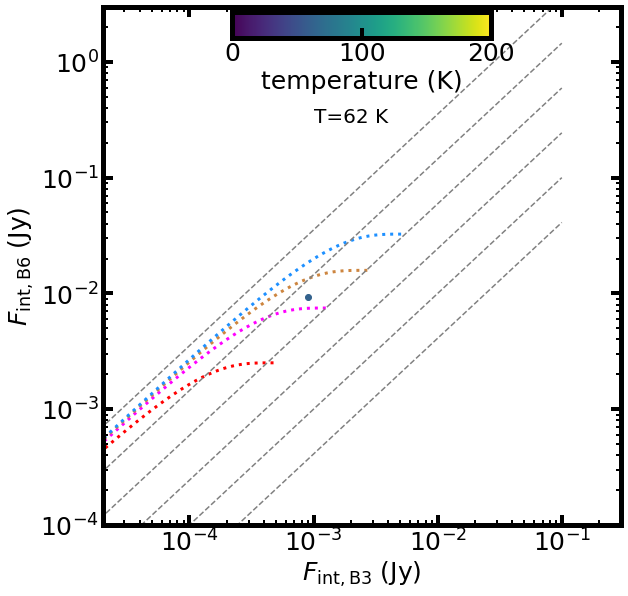

0.00041347000974706056 0.0032378518315986393 30.85431721295735 178.12493867613574


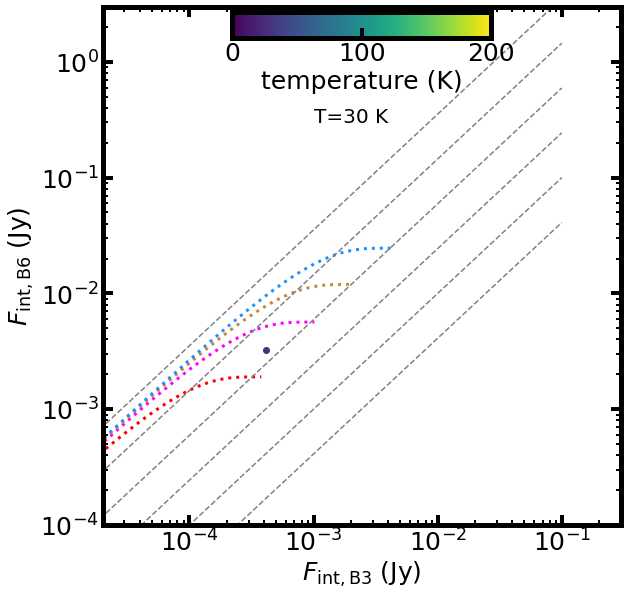

0.0016573439400217739 0.00884916965107044 25.51348630550755 329.5258425808341


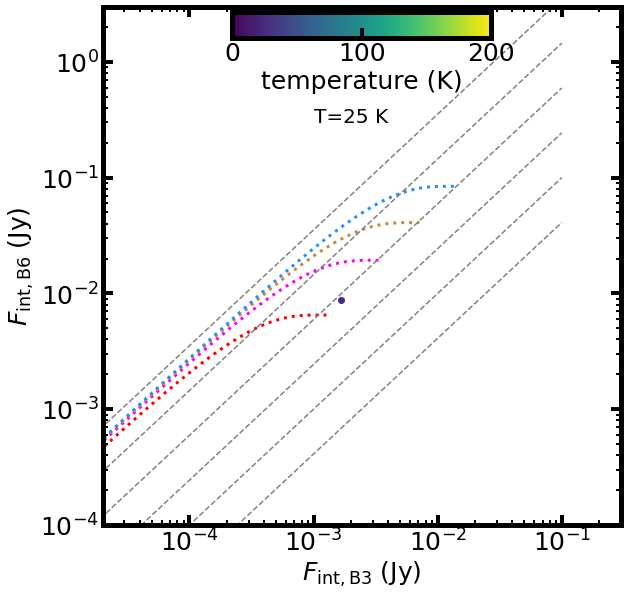

0.00036614928196590697 0.007870302942303838 146.00766317328782 169.27919144199555


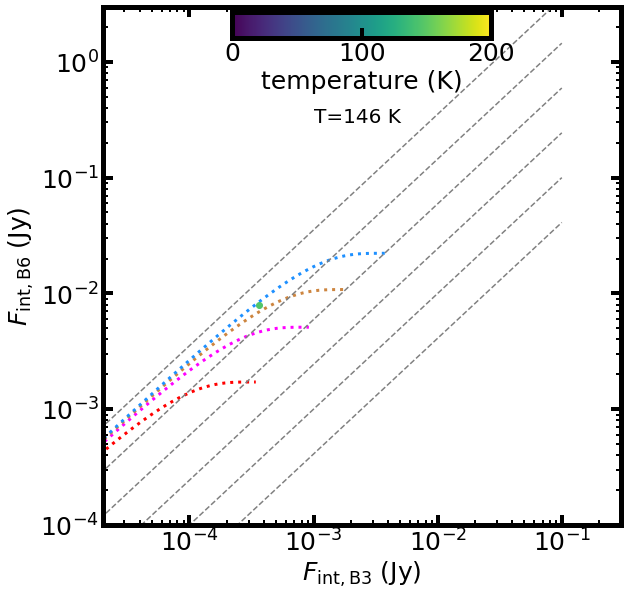

0.001652310217976127 0.011645744772563417 37.137233226279314 302.5558210452102


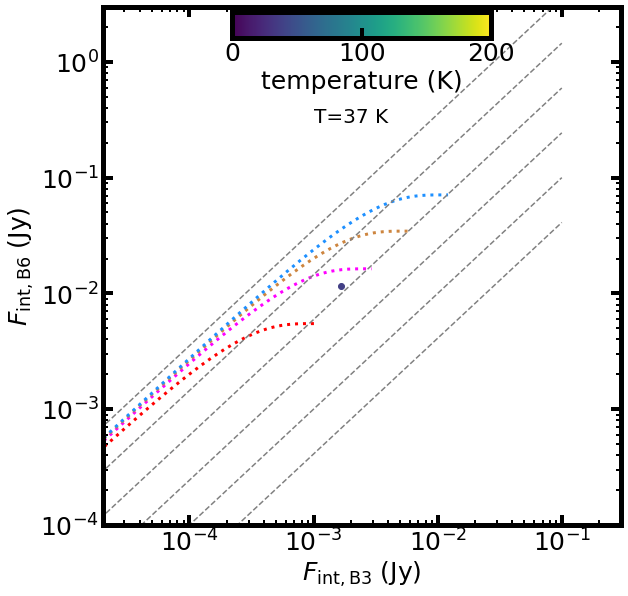

0.002266832947363187 0.022403996952291564 32.489875738771836 459.9198220989378


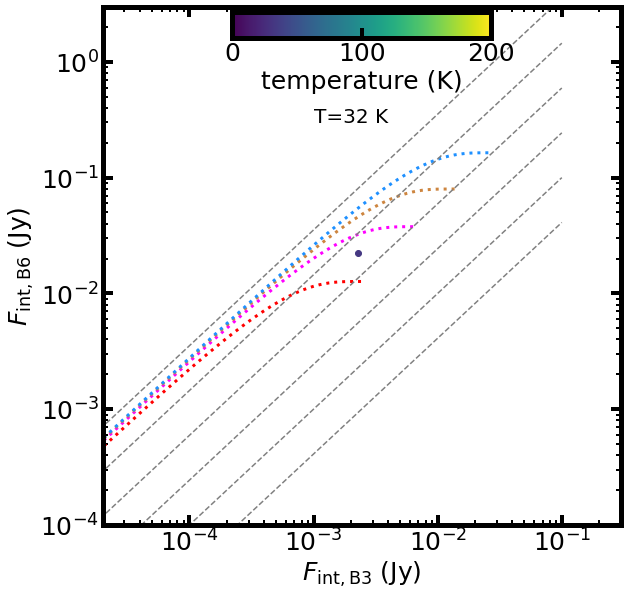

0.0003478380697611399 0.006467287189169416 31.23594564336307 319.79550710998234


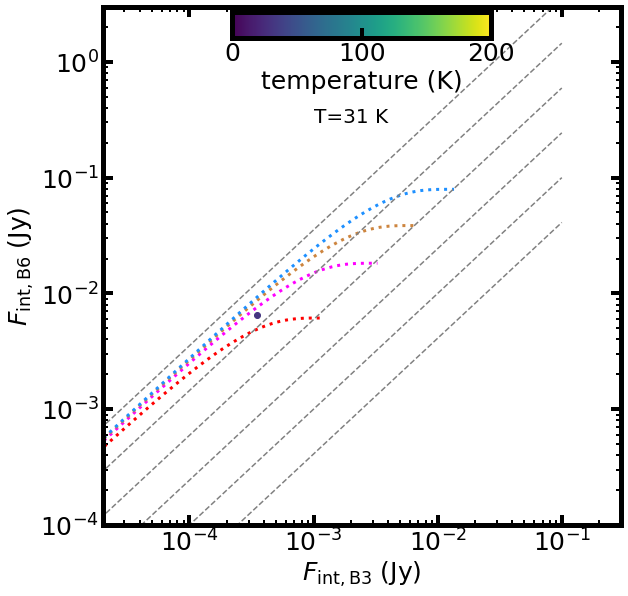

0.0007606249251595758 0.1496133995167473 4999 1082.8166303133535


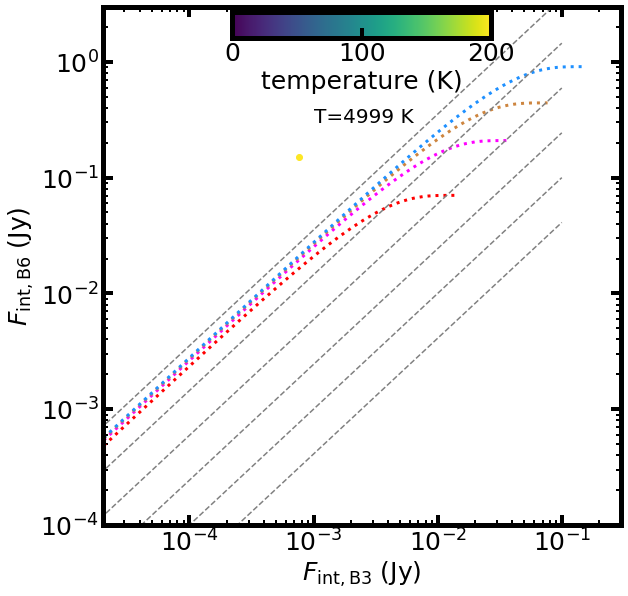

0.007629545511588087 0.06002023585991923 141.7560238114926 332.6445454623873


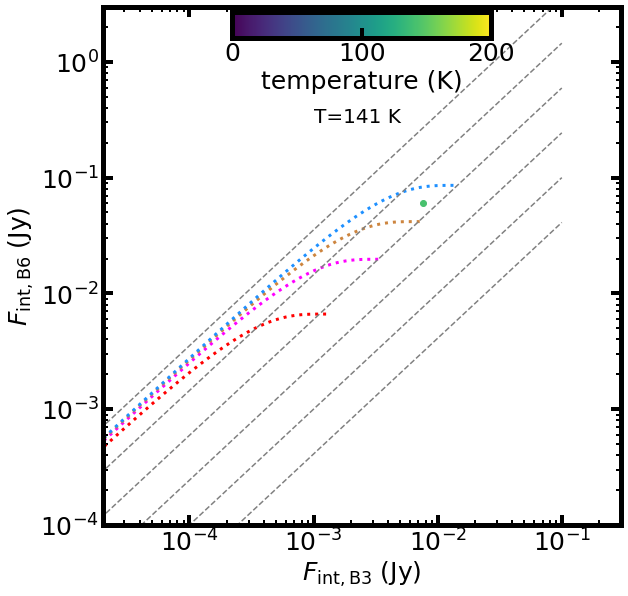

0.0016958930494872656 0.019366174181829763 44.6161125911888 361.25130518011605


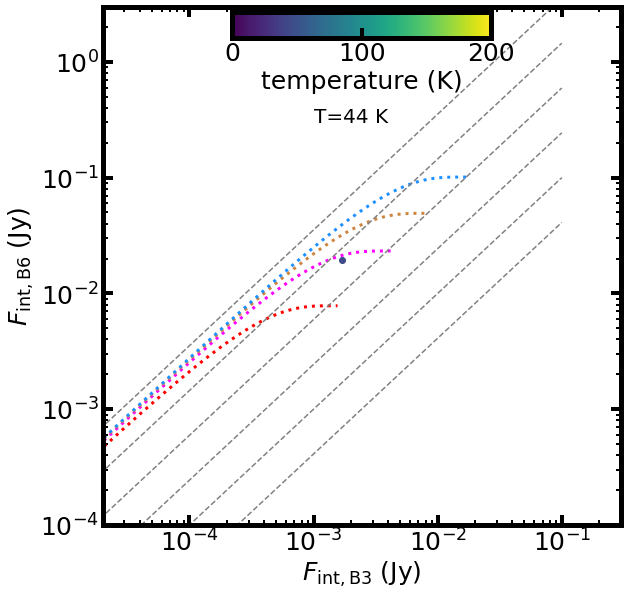

0.004045659539243426 0.025759602896787446 68.72705075647922 319.30359048027395


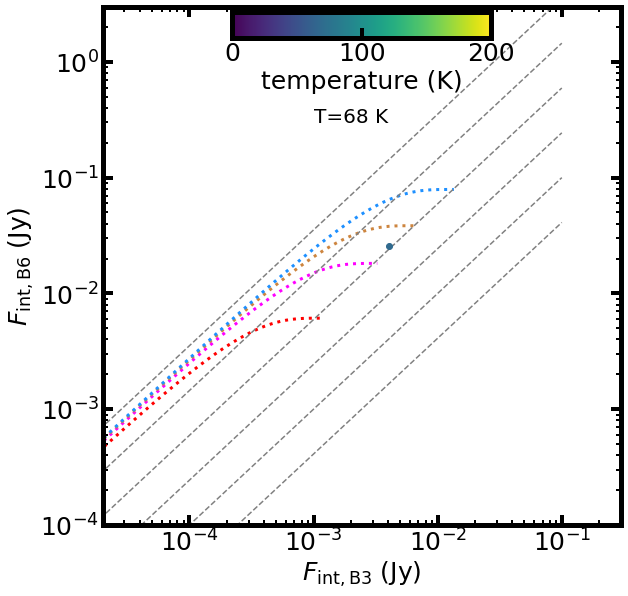

0.0006484831447405993 0.009337976865940786 nan 319.30359048027395
0.0038344795393469343 0.03806671185347853 114.8441059212575 297.9740025411829


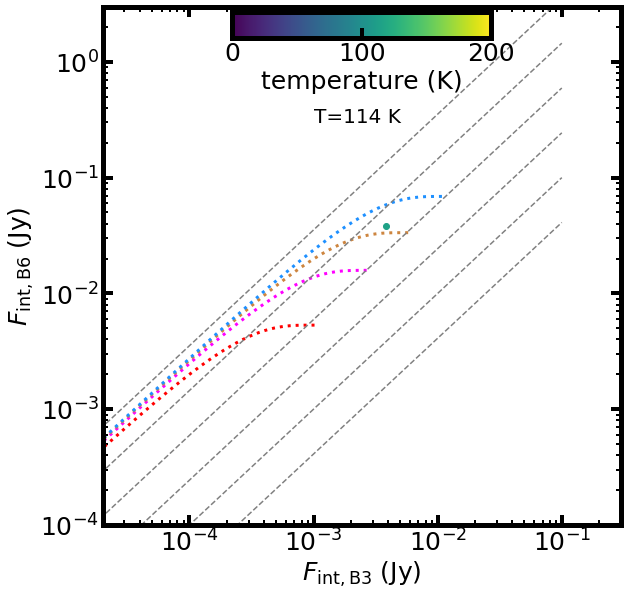

0.006989759988649661 0.0346062783581253 nan 363.4772455065131
0.0055156095214449145 -99.0 0.9905947960137058 1637474149.6094482


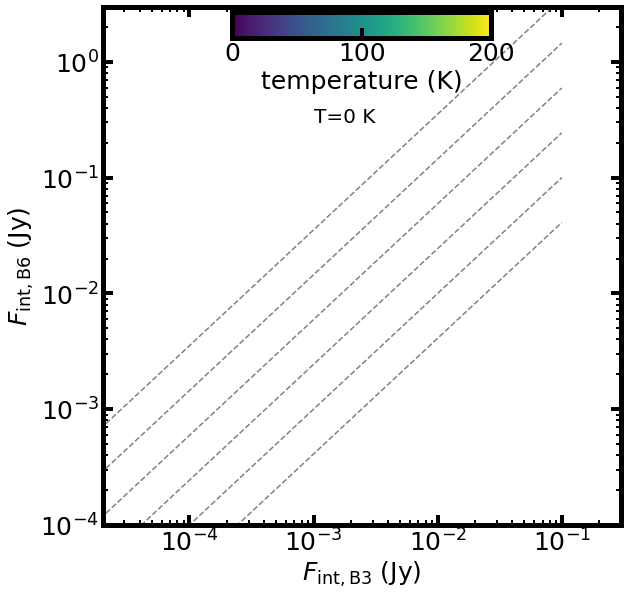

0.0011287673530131206 -99.0 0.9905947960137058 1637474149.6094482


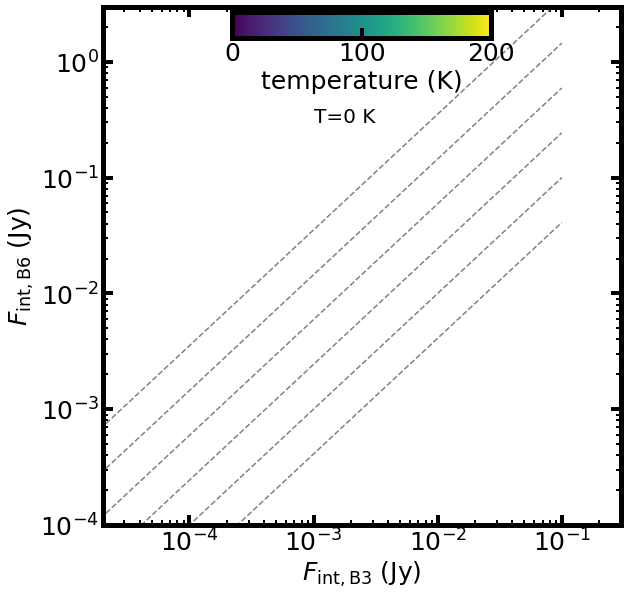

0.0026604826289975125 0.09291232900582262 4999 612.3075942062965


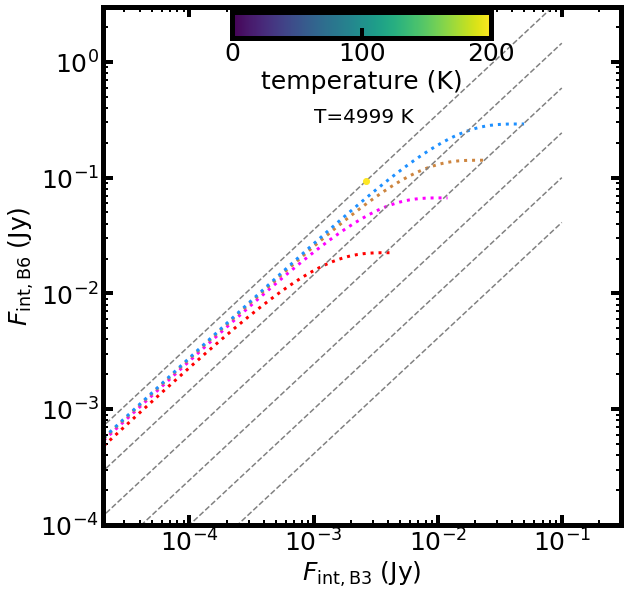

0.0029928474549930253 0.08653497604733566 4999 529.5114300204168


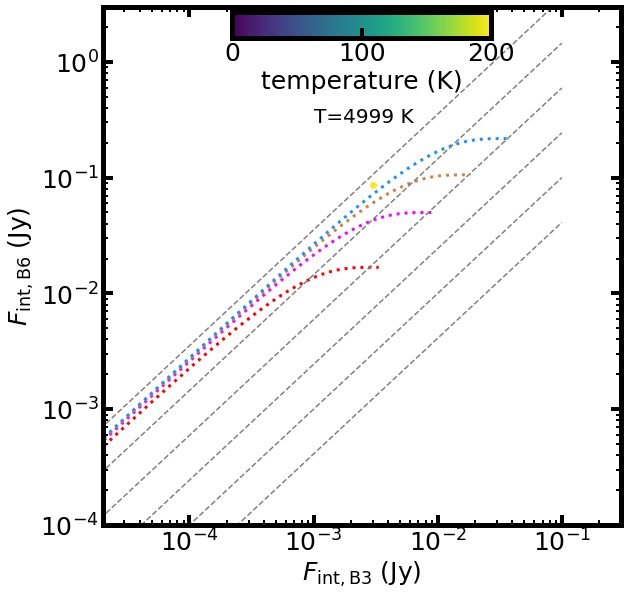

0.01977006115577901 0.10309083733879537 nan 322.3938325736602
0.0011921905722368266 -99.0 nan 322.3938325736602
0.0008416882004193461 0.013282964955905509 20.440080015019927 548.6528895056135


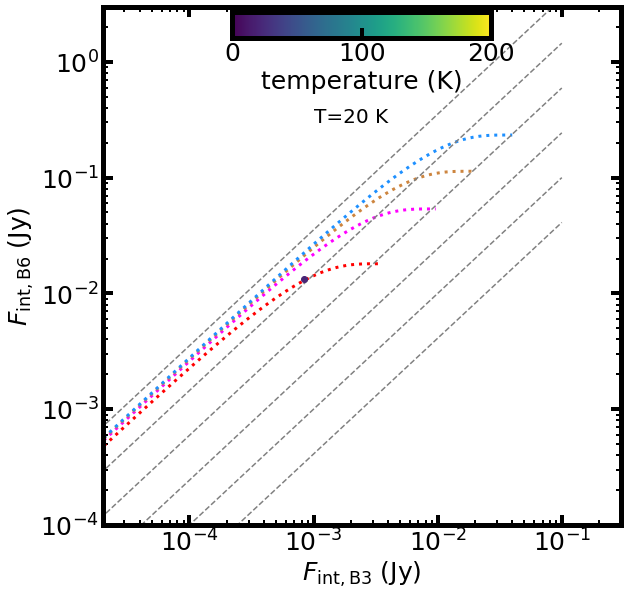

0.00025789847642761 0.004826495014115232 46.96770506752097 215.58730377078095


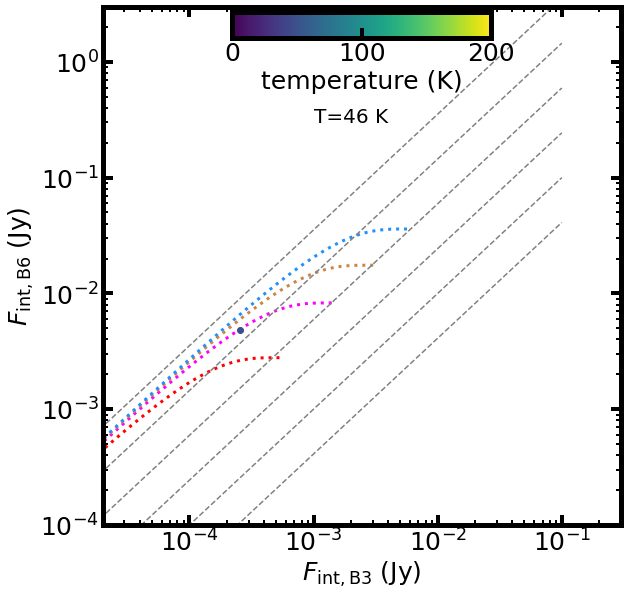

0.0024492797706670154 0.014897272823100664 83.47372966092493 218.7571855306396


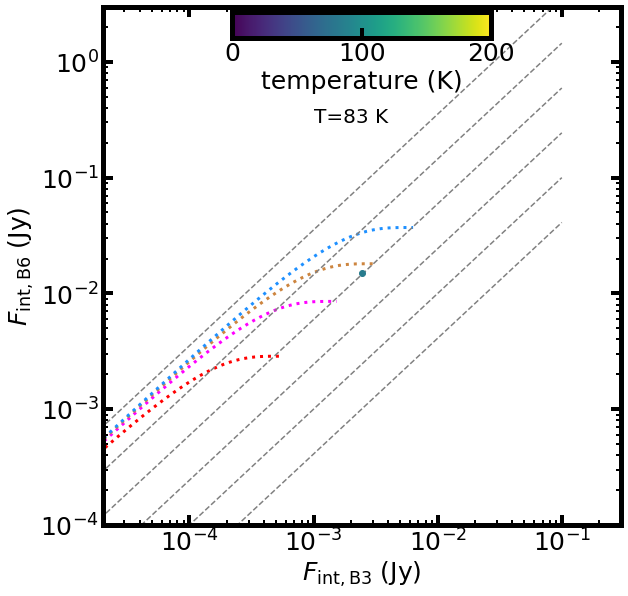

0.0005739670310871417 0.00824609317067696 97.33892345855888 160.6280729494241


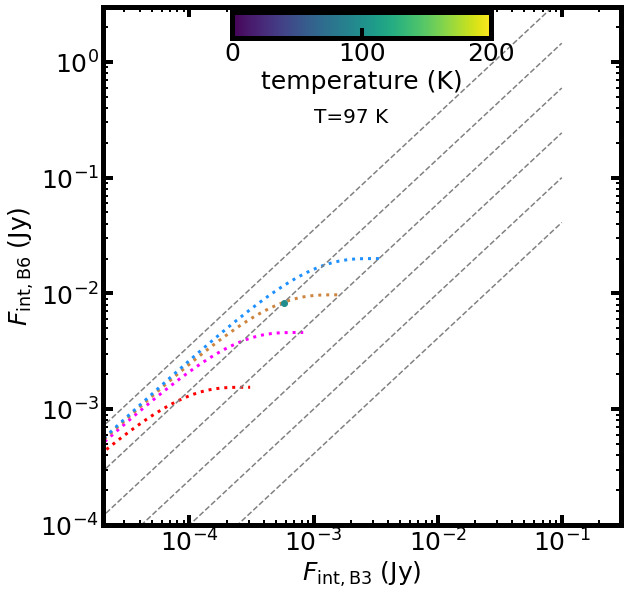

0.0013421883187632161 0.011172405486953323 26.86660130583473 360.355773764843


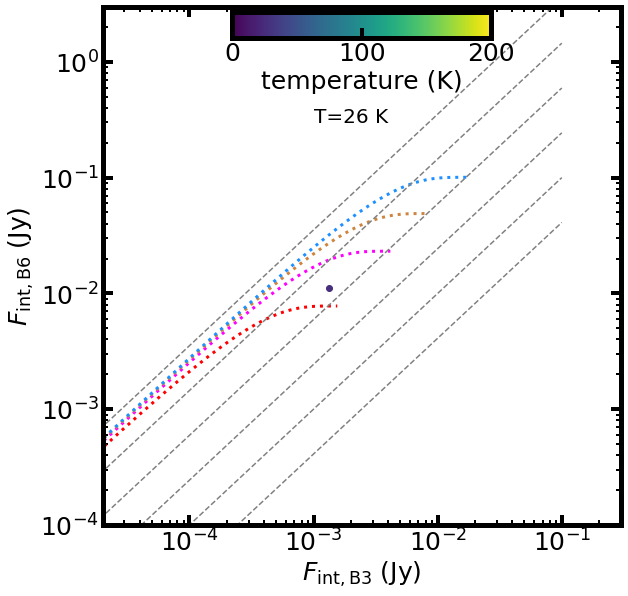

0.028482051262173715 0.17651360345180744 381.16776317415827 343.4128663358835


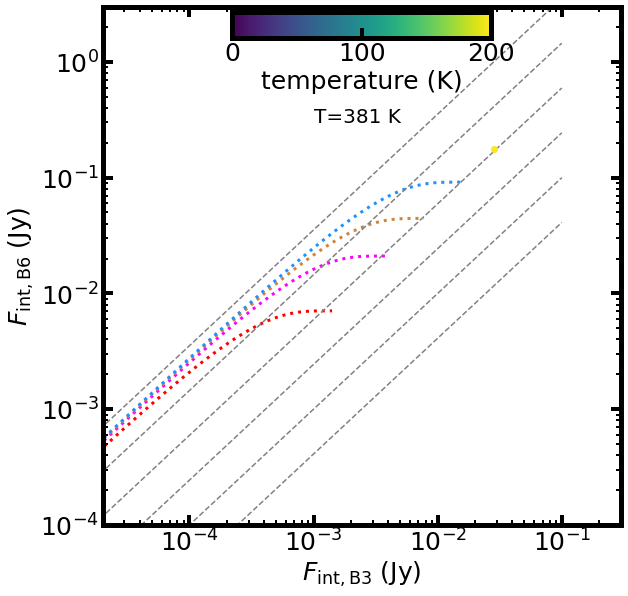

0.43811790749557106 0.2828790954496554 nan 613.6130200219723
0.00022356472829108295 0.002082262695221939 nan 613.6130200219723
0.002930477013872645 0.023602897820098157 52.87811473221881 353.3710630677107


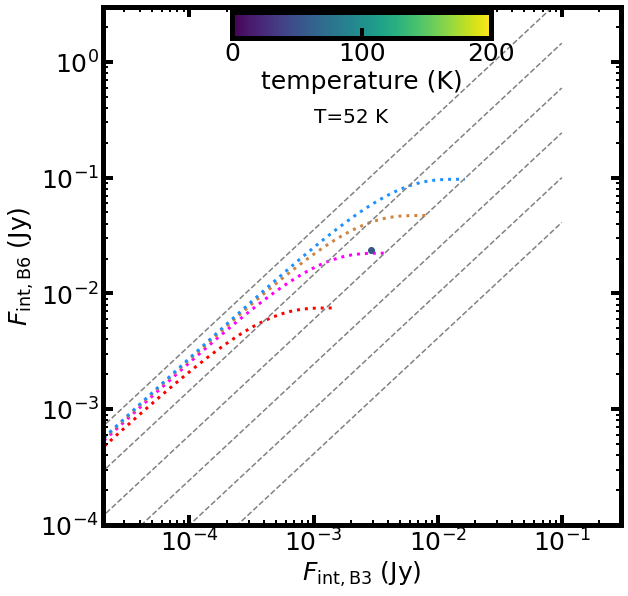

0.0010744581078015055 0.003945899246510033 nan 135.6953250922241
0.0003704543413365679 0.004609847529264181 61.08208894885835 149.3890513474484


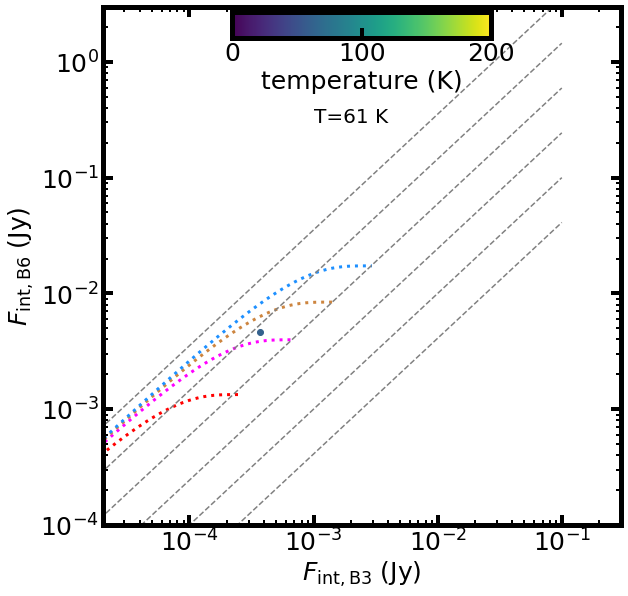

0.0014841186399355694 0.037702923655414285 146.67846748531554 560.3820432196407


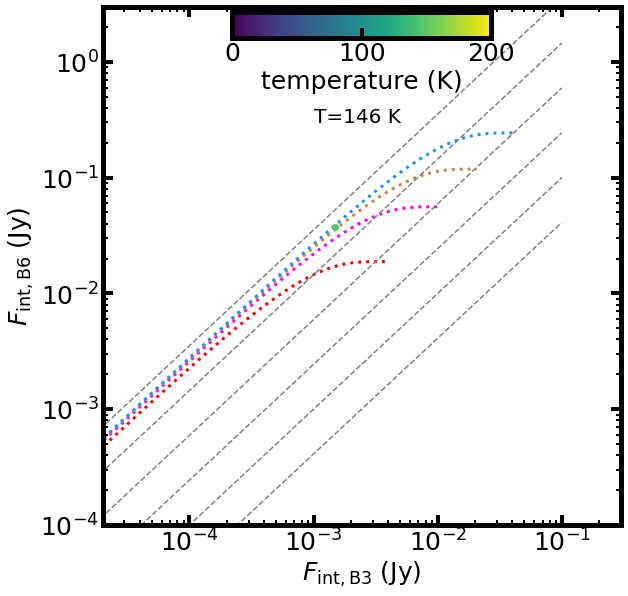

0.00044427362069266726 0.005280376555250255 34.37964450112769 220.90137796983146


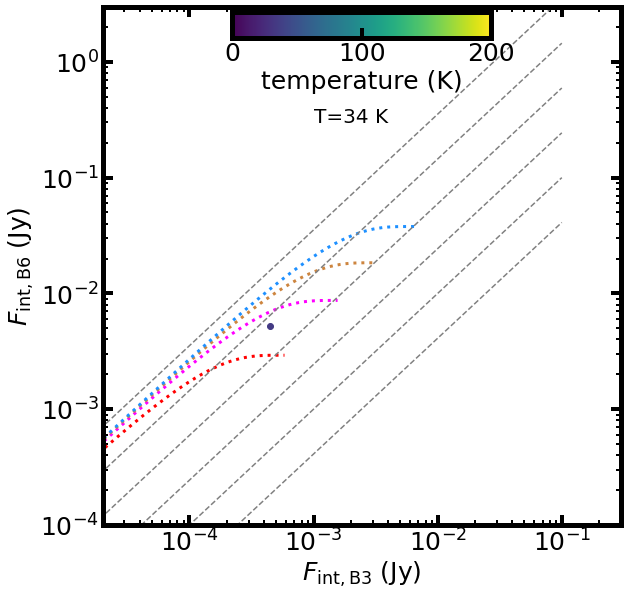

0.009167183165401287 0.08228830449932945 123.15279653823286 420.3030114615475


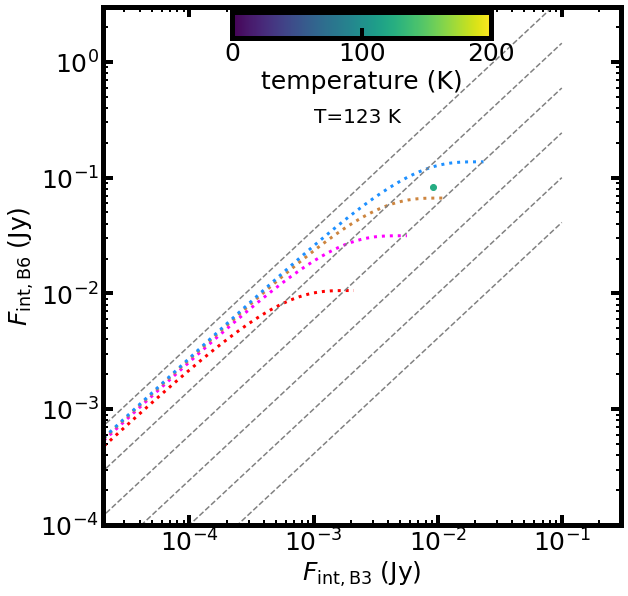

0.00048287485575981175 0.003026808312652947 48.06117430596821 133.20401445401149


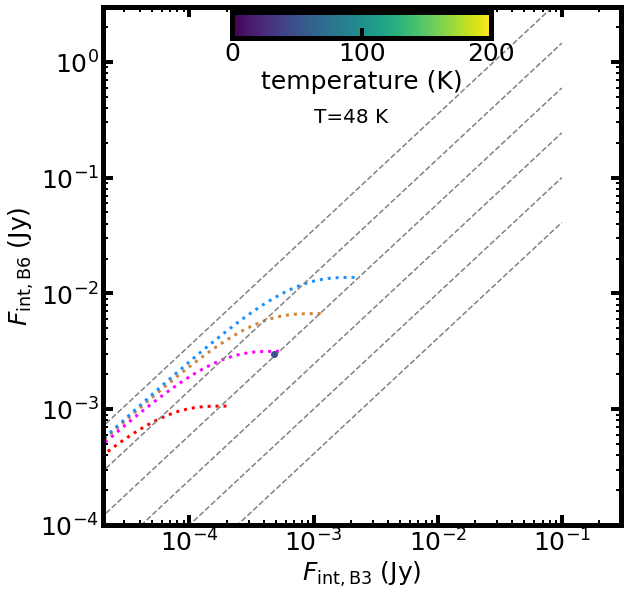

0.002982629696736079 0.035945746837847424 87.97695297870894 340.5283281706345


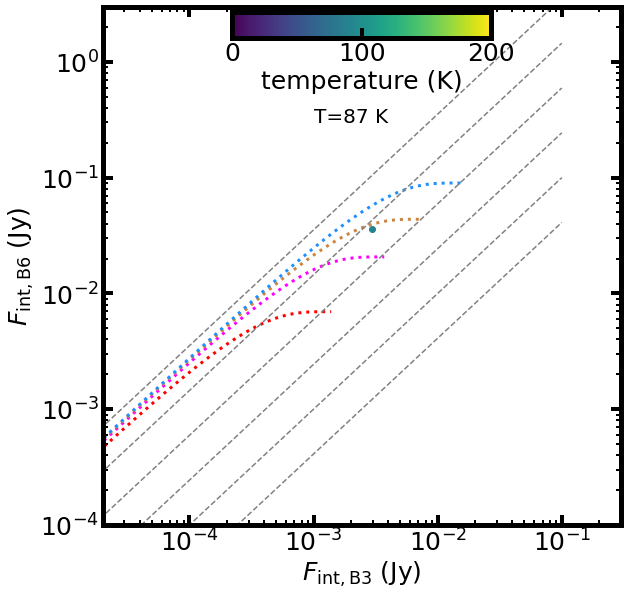

0.0011583438863694152 0.17182118875847244 4999 1082.8166303133535


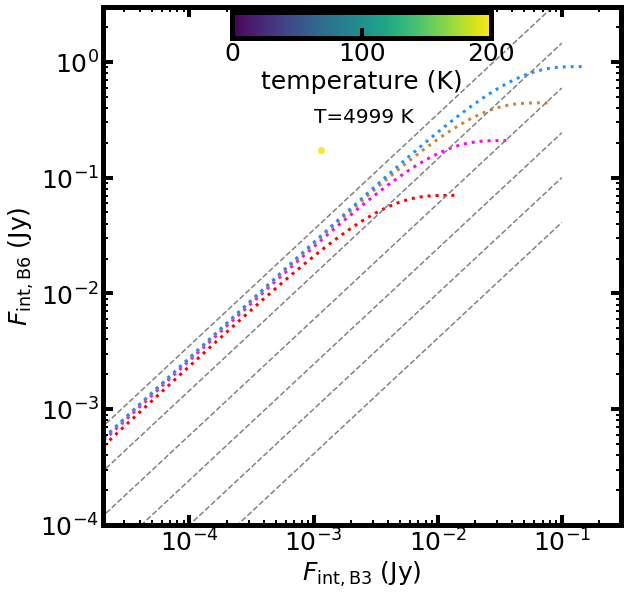

0.002808258756168211 0.014247293358227142 nan 250.82061853494108
0.0005809453643044378 0.004339925999206861 40.03410888593558 176.97518424818327


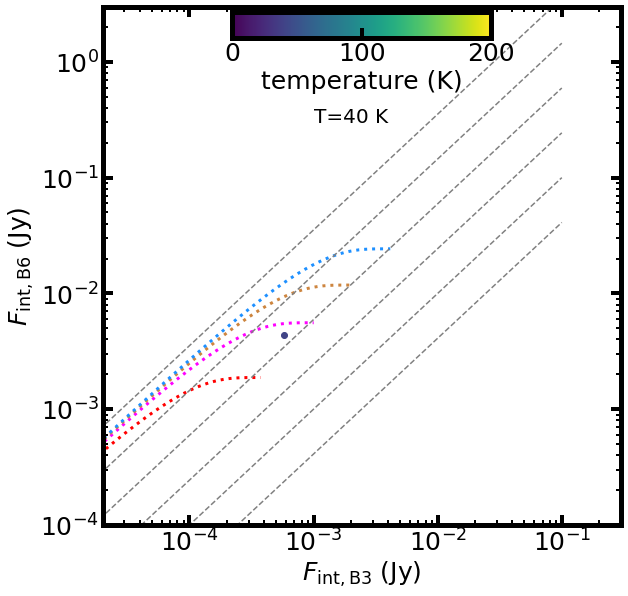

0.0006738895351346341 0.009714632382536788 33.8185837519213 320.564528692509


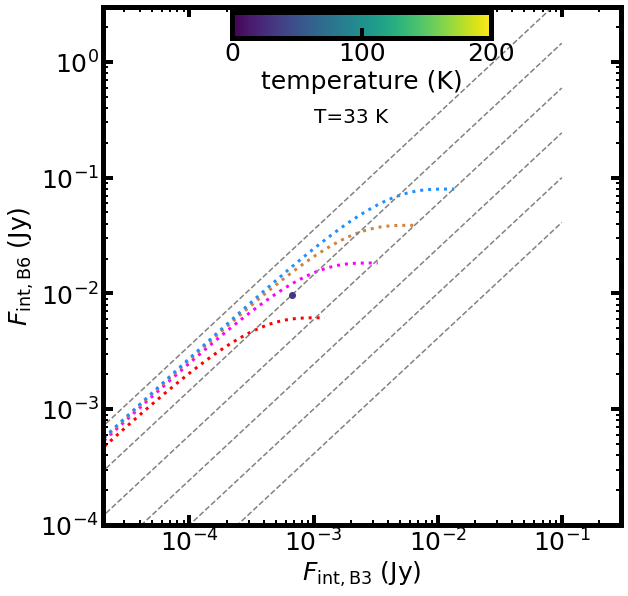

0.0007437723776060436 0.014340210129029066 50.90343878090602 351.0544916221421


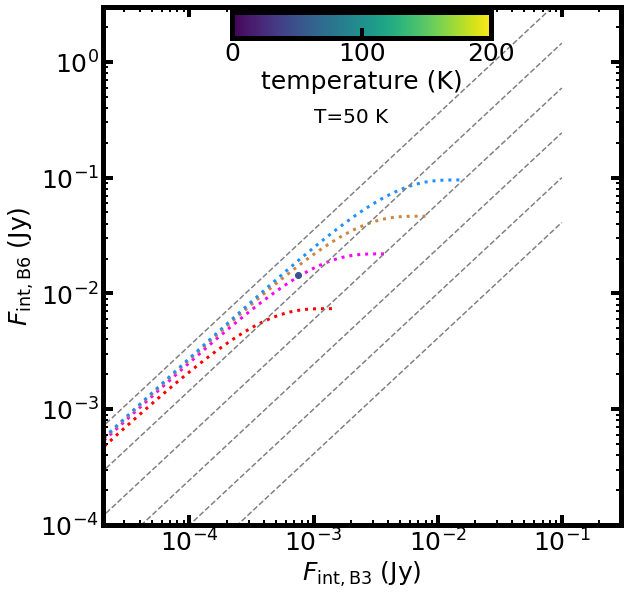

0.001068233178390398 0.011293668793961095 21.030715702271593 431.45249634493626


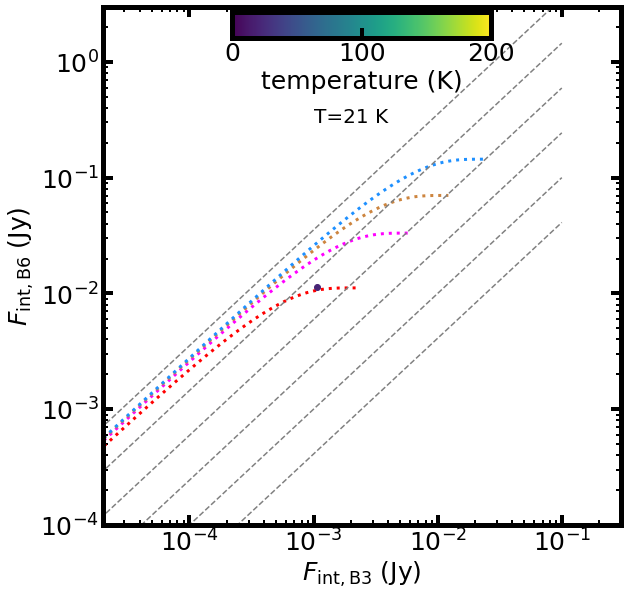

0.0011155199133701572 0.008386870643309334 56.33491330305457 203.20389550403


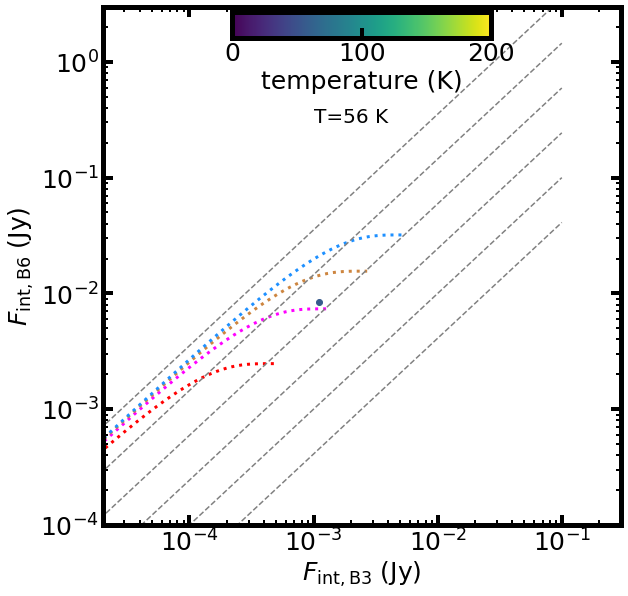

0.0009032697826085849 0.013116839752151208 69.17910404609677 243.49088383741508


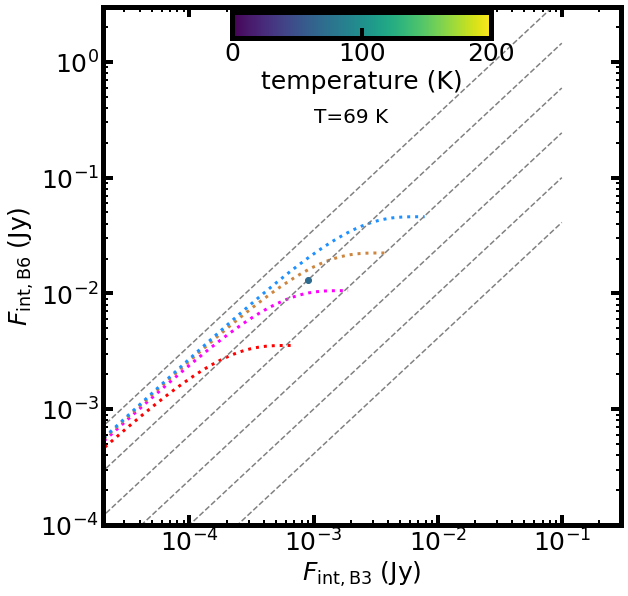

0.0034663532796841844 0.037157545659221164 67.33563629998497 393.95230304933415


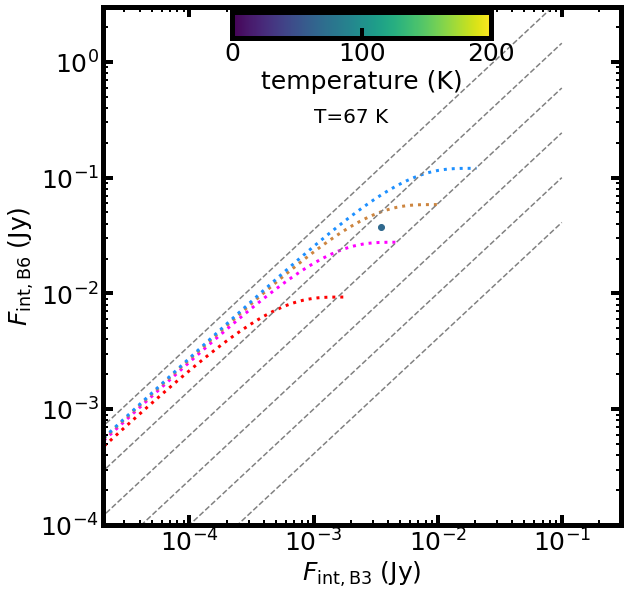

0.0014720432486625798 0.03313685556150193 82.39565388059991 514.9592503803506


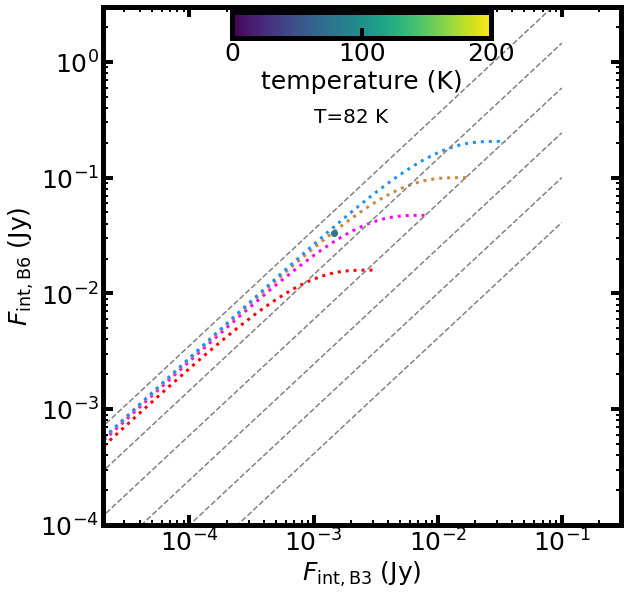

0.0010507539620148105 0.0165523315532985 64.42650586874701 294.54928929535726


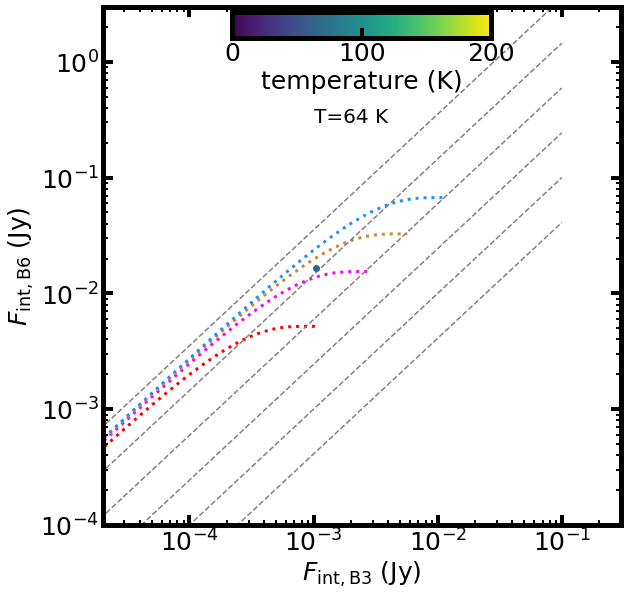

0.001438086682697705 0.011582846461304972 108.63115871660565 167.98923333697002


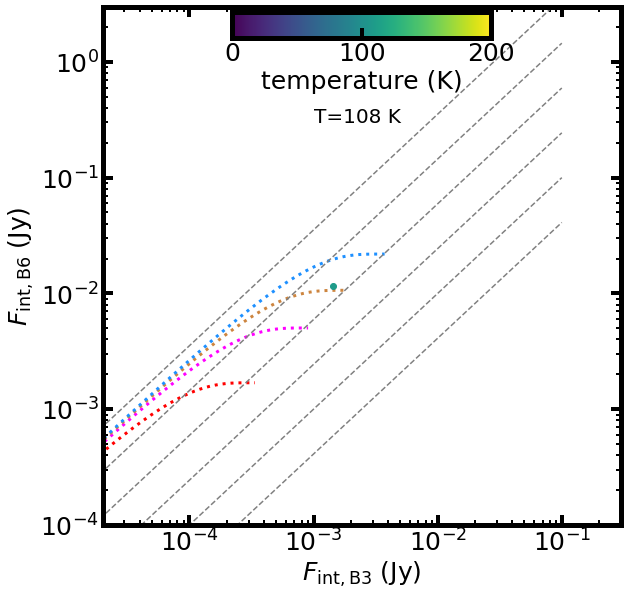

0.0006469137728097431 0.004620985097254242 51.91559569757126 157.72194879566223


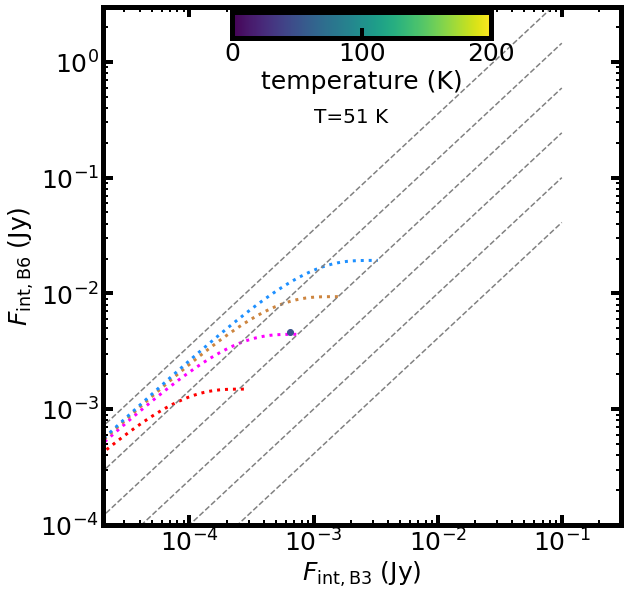

0.0003862104245695568 0.003932319379149492 26.568267833415394 218.52021190724463


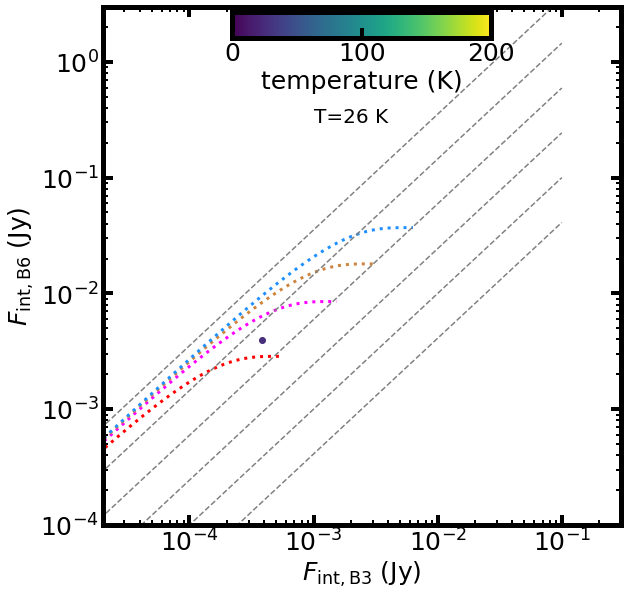

0.0021307428897416798 0.02195367890816543 115.01724852643135 226.73797998090797


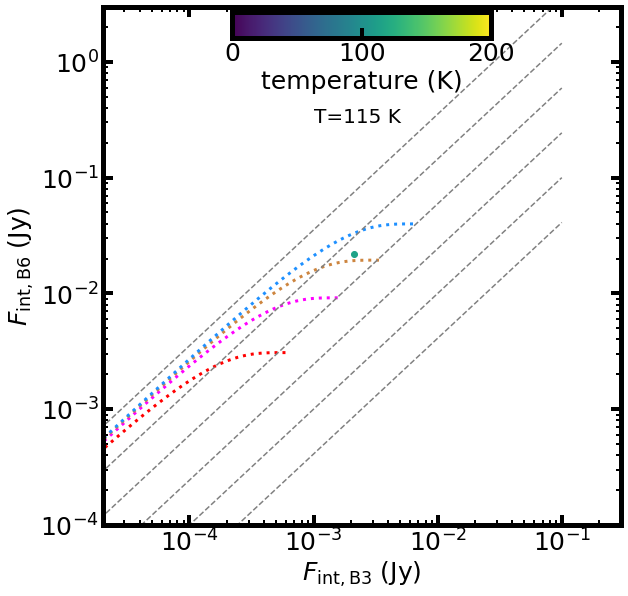

0.00036471821263844715 0.004245282141153761 33.00496395765171 202.48178579746673


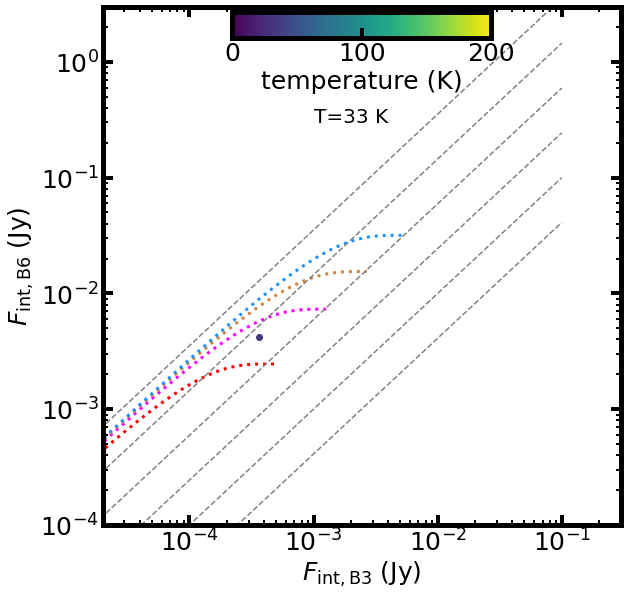

0.0003934679707398818 0.001413573319324293 nan 202.48178579746673
0.0009142764483877702 0.007316920830499835 62.198674971546986 179.9150712295136


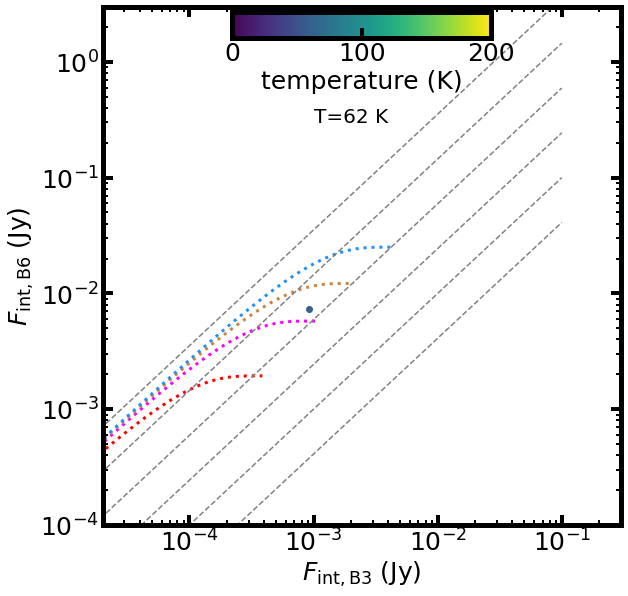

0.0006060335486430339 0.004082918062653091 36.56945850618262 180.71112801523202


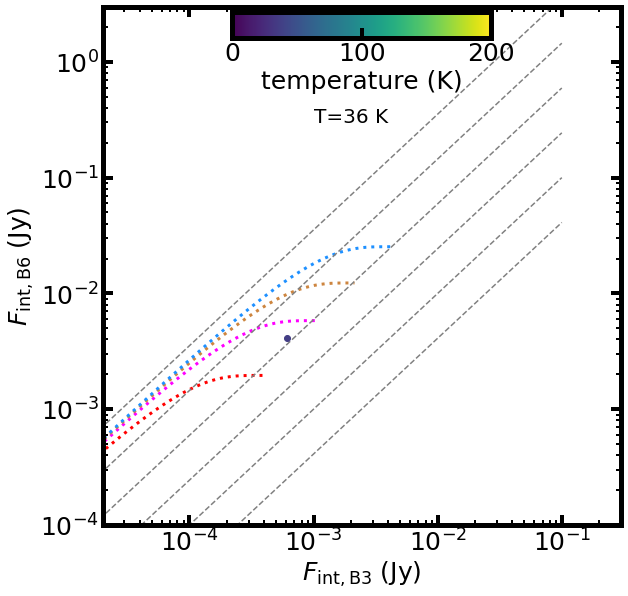

0.0006803474455428603 0.008277384516592674 47.84427408767429 228.92052697454636


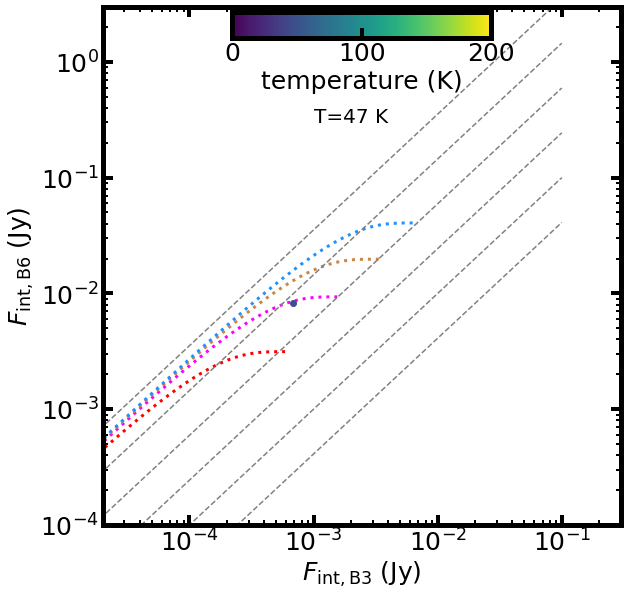

0.0004321110194387138 -99.0 0.9905947960137058 1637474149.6094482


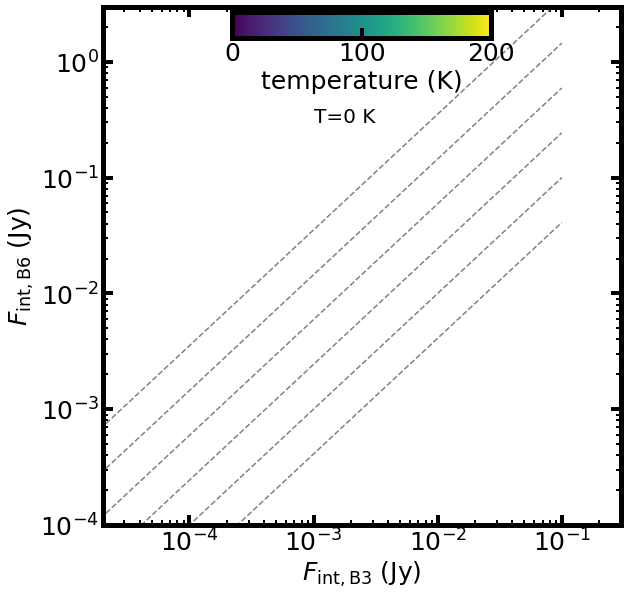

0.0008487039722741826 -99.0 nan 1637474149.6094482
0.001389291318268661 -99.0 nan 1637474149.6094482
0.007108987030290119 -99.0 nan 1637474149.6094482
0.0013661213725452194 -99.0 nan 1637474149.6094482
0.0008774477800300893 -99.0 nan 1637474149.6094482
0.005826146786990842 -99.0 nan 1637474149.6094482
0.00032268852279354127 -99.0 nan 1637474149.6094482
0.0002845828205627842 -99.0 nan 1637474149.6094482
0.0003668657257405809 -99.0 nan 1637474149.6094482
0.0002701401132852133 -99.0 nan 1637474149.6094482
0.00030358839322835134 -99.0 nan 1637474149.6094482
-99.0 0.02188495869512123 nan 1637474149.6094482
-99.0 0.01645183448944408 nan 1637474149.6094482
-99.0 0.09908504965703487 nan 1637474149.6094482
-99.0 0.0469895866141562 nan 1637474149.6094482
-99.0 0.003622051762534739 nan 1637474149.6094482
-99.0 0.009044584875349081 nan 1637474149.6094482
-99.0 0.011028529634734883 nan 1637474149.6094482
-99.0 0.015790104774611406 nan 1637474149.6094482
-99.0 0.0018073577458101618 nan 1637474149.60

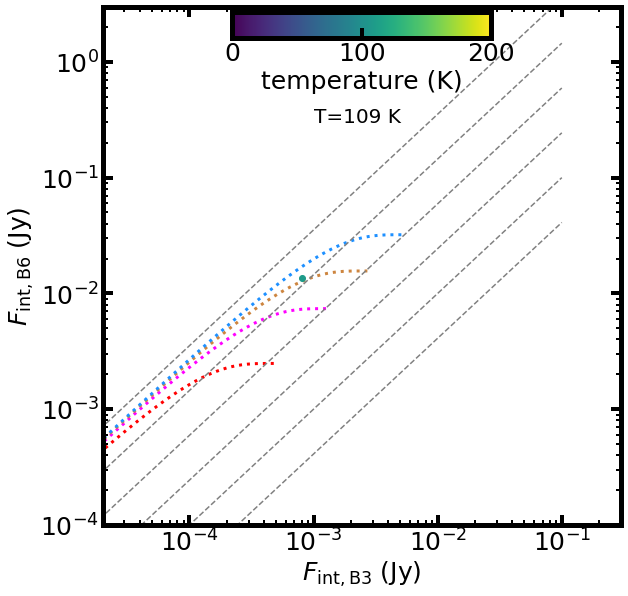

0.001709415857491231 0.010808754055746477 128.44010356560713 148.48402119821606


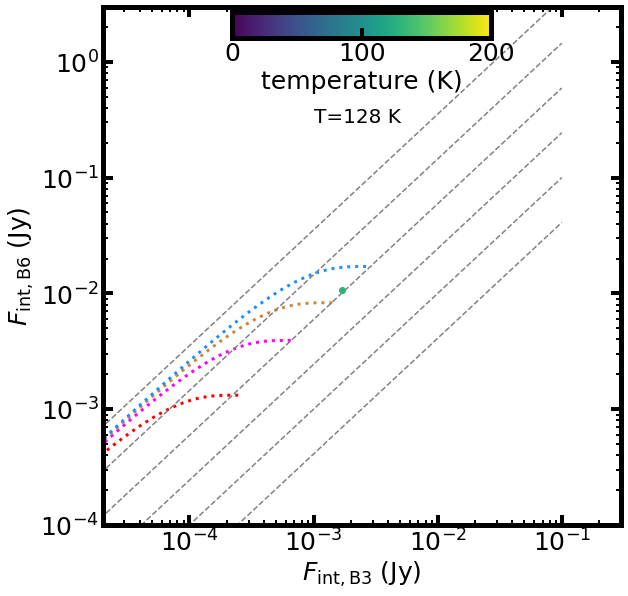

0.0025721796530461297 0.004735369543847812 nan 35.9840454101704
0.08719365221108977 0.10972245498276298 nan 160.97028211427283
0.005684483537694778 0.05924919490743553 137.05950497167285 339.9194134561489


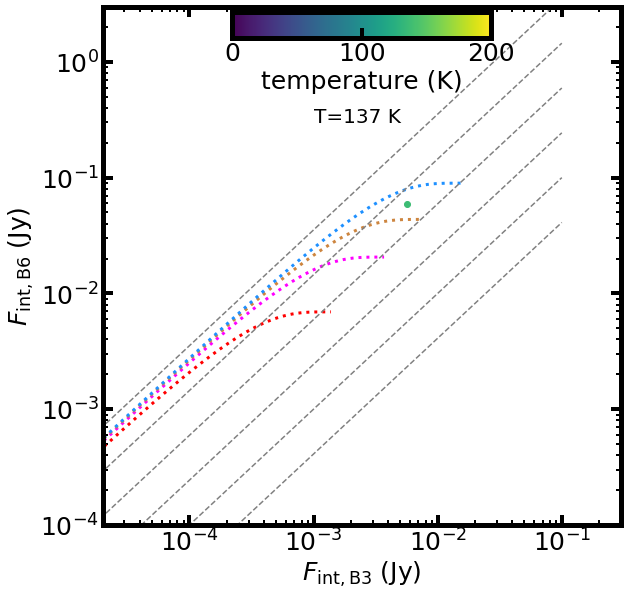

0.0019818239318409488 0.01910726896500474 49.44358674526484 332.29184118515076


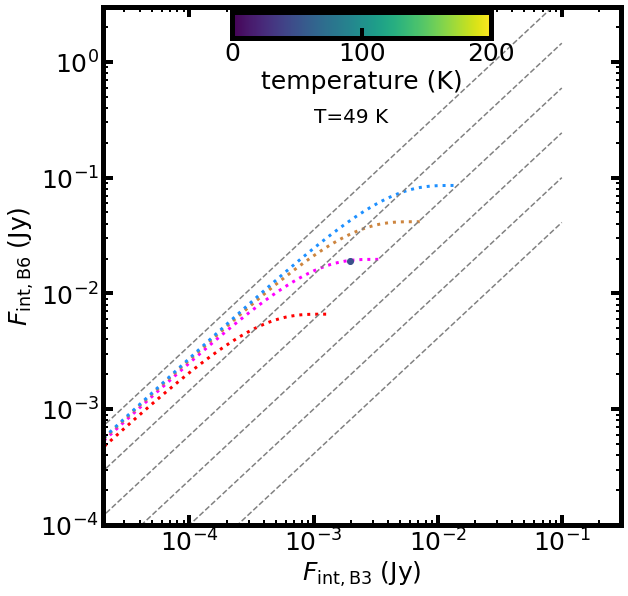

0.0034882991812697326 0.03430132626059081 148.975342164965 246.76918358171164


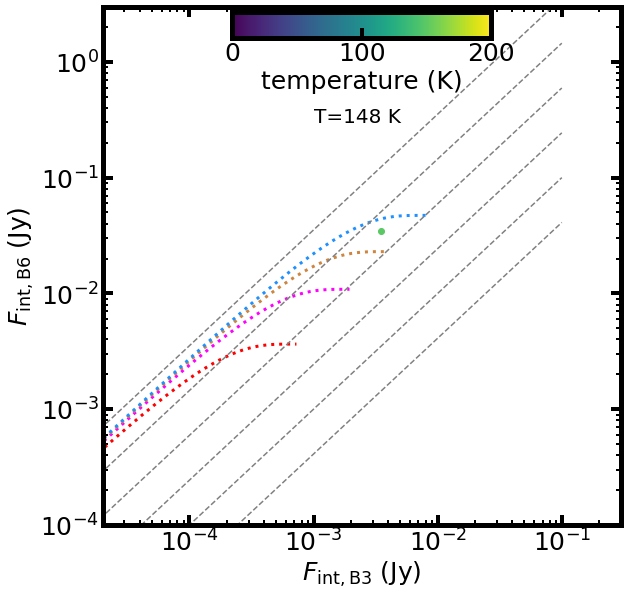

0.0028688566652024607 0.05429214309330014 95.01841366315207 477.8672486478051


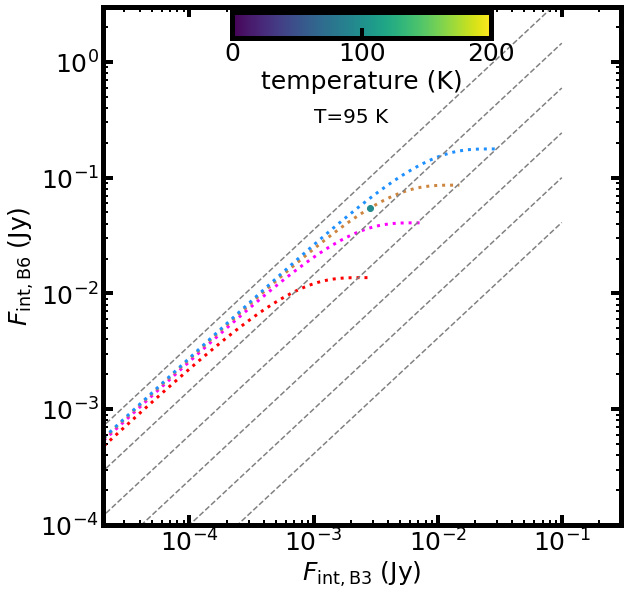

0.0018782458134395707 0.05709034070610952 4999 379.6735107667661


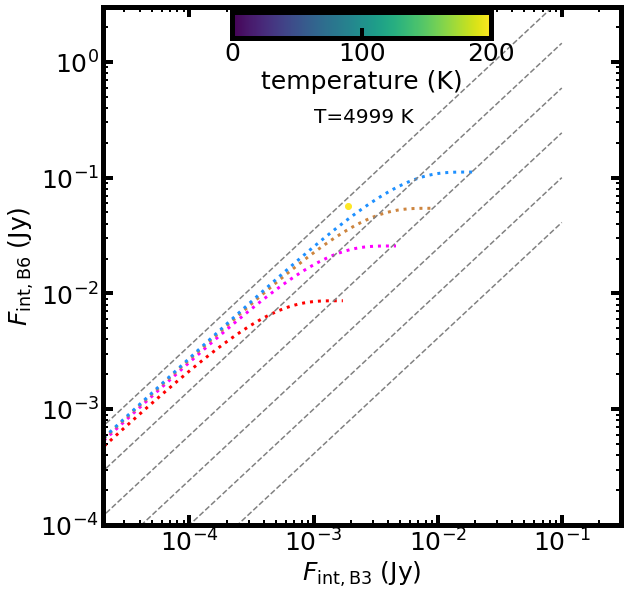

0.01812375018267982 0.14963944753147354 193.57576469156268 447.42965828672874


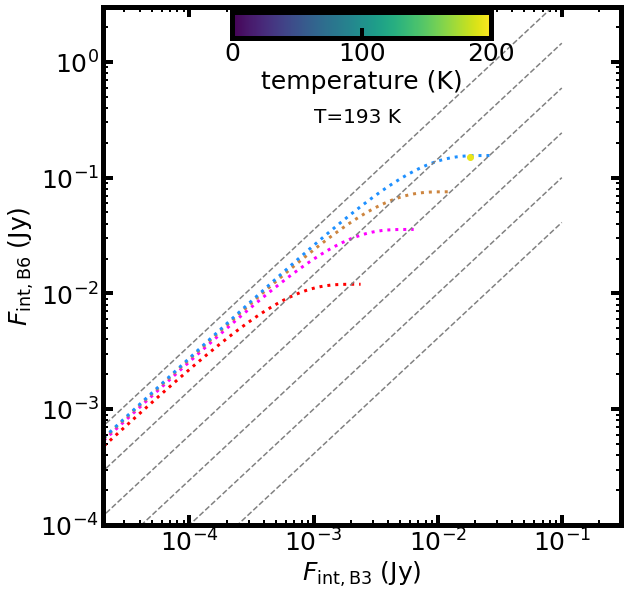

0.050487448696136666 0.9743588875206525 521.2475060569219 844.4944699480494


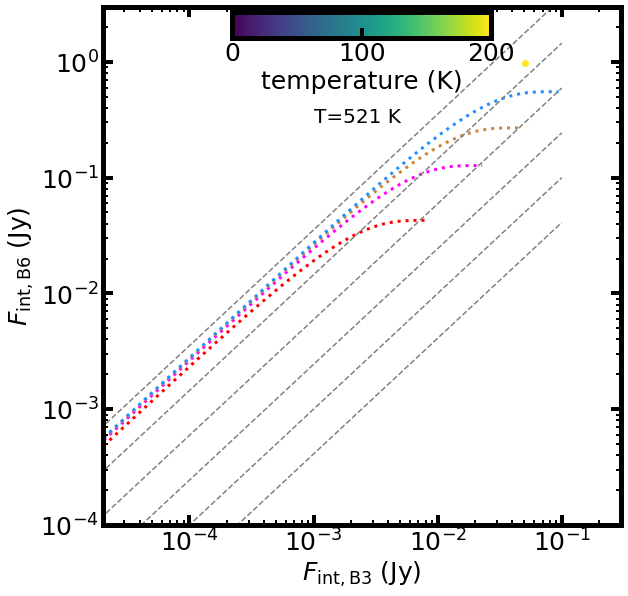

0.005480780586020189 0.04206829578054478 94.60158638230803 344.21086334252936


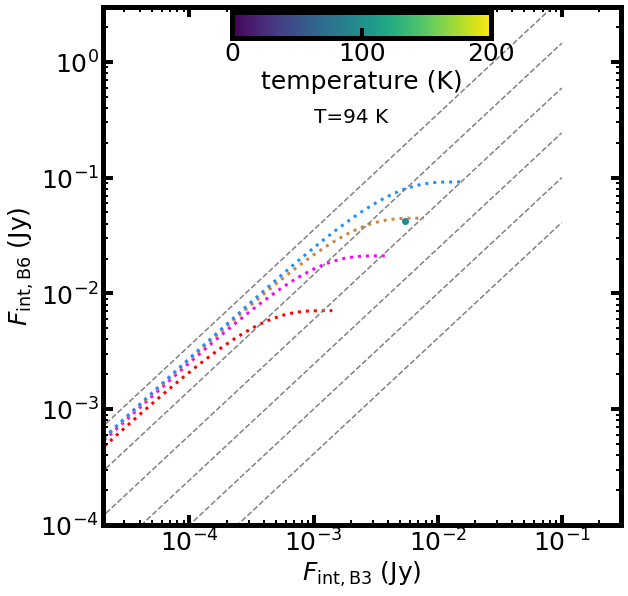

0.000494968451338643 0.009650453941952034 100.02255414737479 199.88027510306384


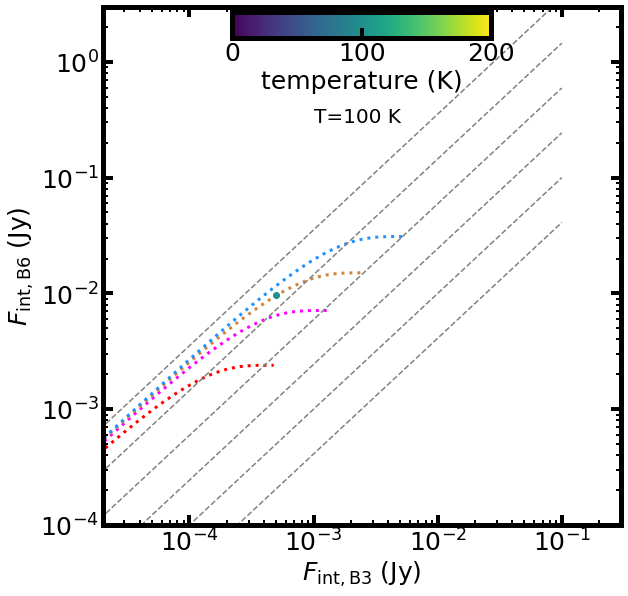

0.002772681027776904 0.15991076887132263 nan 199.88027510306384
0.0008125818692418056 0.0051968857490118205 52.14440581138643 166.80228609842368


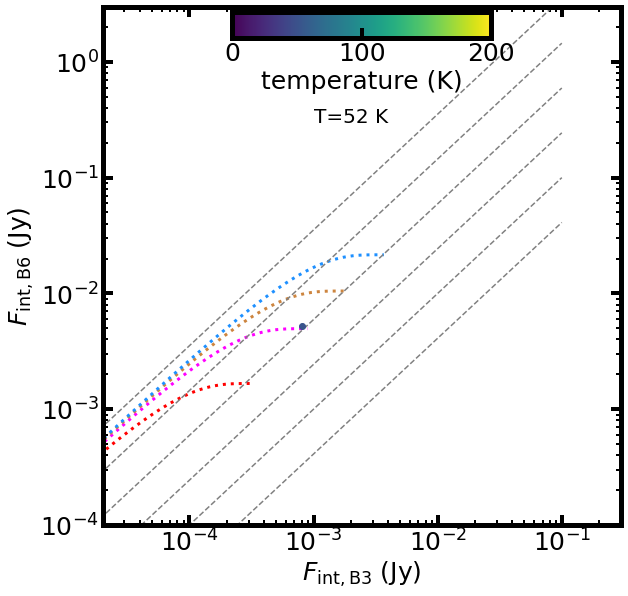

0.0012166681972683654 0.023451324828877563 99.21689956521553 280.8470442353498


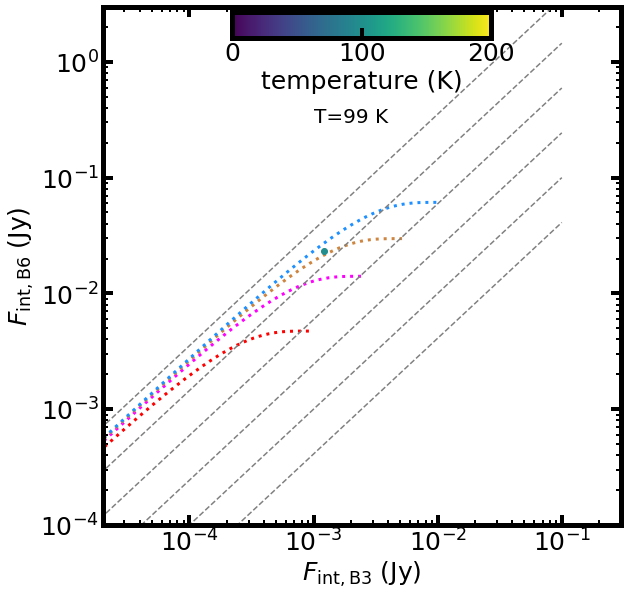

0.0055126136570566265 0.016801454467147574 nan 39.92751810301118
0.0035893871597498087 0.01148155210411263 nan 48.56565109974247
0.003187225419399808 0.014955385963252688 nan 81.90530906926922
0.00409057801548063 0.03879196194785454 88.79312154567675 343.7320117062195


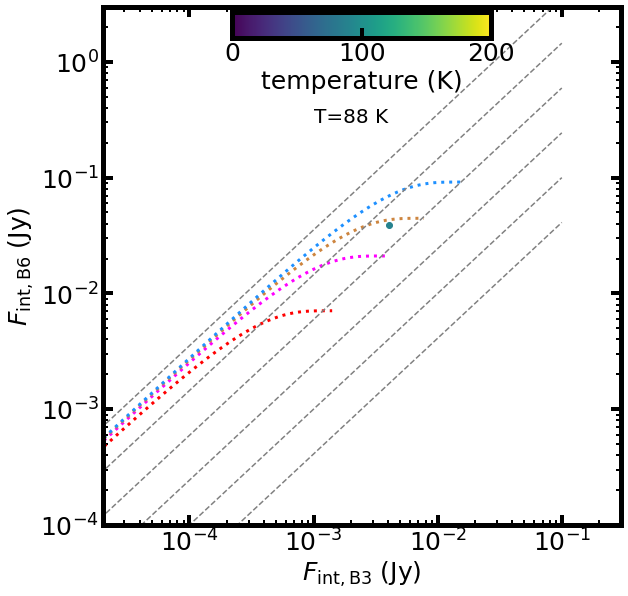

0.00345306234386882 0.033550149954579514 113.31389577066597 281.38121858875024


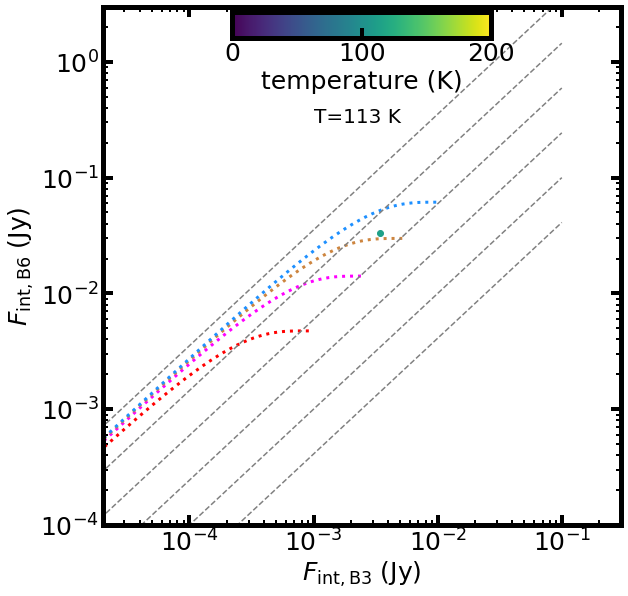

0.00022602541557275842 -99.0 nan 281.38121858875024
0.000293286446476524 -99.0 nan 281.38121858875024
0.0020878409124974687 -99.0 nan 281.38121858875024
0.002543680885632332 -99.0 nan 281.38121858875024
0.0004989175017173512 -99.0 nan 281.38121858875024
0.0002600255089360298 -99.0 nan 281.38121858875024
0.0004369515322881033 -99.0 nan 281.38121858875024
-99.0 0.0010122241355333141 nan 281.38121858875024
-99.0 0.11012878026489761 nan 281.38121858875024
-99.0 0.017215090327507145 nan 281.38121858875024
-99.0 0.09452486050980352 nan 281.38121858875024
0.0008743991011343787 -99.0 nan 281.38121858875024
0.0011004345869667974 -99.0 nan 281.38121858875024
0.00017339210634647267 -99.0 nan 281.38121858875024
0.00047965577514234327 -99.0 nan 281.38121858875024
0.0005887626316246209 -99.0 nan 281.38121858875024
0.00041776304176464754 -99.0 nan 281.38121858875024
0.0001853807222738064 -99.0 nan 281.38121858875024
0.0005368265111166734 -99.0 nan 281.38121858875024
0.0002872580437954597 -99.0 nan 28

In [26]:
temparr = np.arange(1,5000,step=1)
w51e_b3_major = w51e_b3_flux_fits['deconvolved_major']
w51e_b6_major = w51e_b6_flux_conv_fits['deconvolved_major']
w51n_b3_major = w51n_b3_flux_fits['deconvolved_major']
w51n_b6_major = w51n_b6_flux_conv_fits['deconvolved_major']
w51e_b3_minor = w51e_b3_flux_fits['deconvolved_minor']
w51e_b6_minor = w51e_b6_flux_conv_fits['deconvolved_minor']
w51n_b3_minor = w51n_b3_flux_fits['deconvolved_minor']
w51n_b6_minor = w51n_b6_flux_conv_fits['deconvolved_minor']

w51e_b3_major_upperr = w51e_b3_flux_fits['deconvolved_major_upperr']
w51e_b6_major_upperr = w51e_b6_flux_conv_fits['deconvolved_major_upperr']
w51n_b3_major_upperr = w51n_b3_flux_fits['deconvolved_major_upperr']
w51n_b6_major_upperr = w51n_b6_flux_conv_fits['deconvolved_major_upperr']
w51e_b3_minor_upperr = w51e_b3_flux_fits['deconvolved_minor_upperr']
w51e_b6_minor_upperr = w51e_b6_flux_conv_fits['deconvolved_minor_upperr']
w51n_b3_minor_upperr = w51n_b3_flux_fits['deconvolved_minor_upperr']
w51n_b6_minor_upperr = w51n_b6_flux_conv_fits['deconvolved_minor_upperr']

w51e_b3_major_lowerr = w51e_b3_flux_fits['deconvolved_major_lowerr']
w51e_b6_major_lowerr = w51e_b6_flux_conv_fits['deconvolved_major_lowerr']
w51n_b3_major_lowerr = w51n_b3_flux_fits['deconvolved_major_lowerr']
w51n_b6_major_lowerr = w51n_b6_flux_conv_fits['deconvolved_major_lowerr']
w51e_b3_minor_lowerr = w51e_b3_flux_fits['deconvolved_minor_lowerr']
w51e_b6_minor_lowerr = w51e_b6_flux_conv_fits['deconvolved_minor_lowerr']
w51n_b3_minor_lowerr = w51n_b3_flux_fits['deconvolved_minor_lowerr']
w51n_b6_minor_lowerr = w51n_b6_flux_conv_fits['deconvolved_minor_lowerr']


w51e_b3_int_fluxlow = w51e_b3_flux_fits['flux_lowerr']
w51e_b6_int_fluxlow = w51e_b6_flux_conv_fits['flux_lowerr']
w51n_b3_int_fluxlow = w51n_b3_flux_fits['flux_lowerr']
w51n_b6_int_fluxlow = w51n_b6_flux_conv_fits['flux_lowerr']

w51e_b3_int_fluxupp = w51e_b3_flux_fits['flux_upperr']
w51e_b6_int_fluxupp = w51e_b6_flux_conv_fits['flux_upperr']
w51n_b3_int_fluxupp = w51n_b3_flux_fits['flux_upperr']
w51n_b6_int_fluxupp = w51n_b6_flux_conv_fits['flux_upperr']

w51e_b3_int_fluxerr = np.hstack((w51e_b3_int_flux-w51e_b3_int_fluxlow,w51e_b3_int_fluxupp-w51e_b3_int_flux)).T
w51e_b6_int_fluxerr = np.hstack((w51e_b6_int_flux-w51e_b6_int_fluxlow,w51e_b6_int_fluxupp-w51e_b6_int_flux)).T
w51n_b3_int_fluxerr = np.hstack((w51n_b3_int_flux-w51n_b3_int_fluxlow,w51n_b3_int_fluxupp-w51n_b3_int_flux)).T
w51n_b6_int_fluxerr = np.hstack((w51n_b6_int_flux-w51n_b6_int_fluxlow,w51n_b6_int_fluxupp-w51n_b6_int_flux)).T


w51e_b3_avg_size = np.sqrt(w51e_b3_major*w51e_b3_minor) * 2 /2.355 * np.pi/180 * 5.41*1000*206265
w51e_b6_avg_size = np.sqrt(w51e_b6_major*w51e_b6_minor) * 2 /2.355 * np.pi/180 * 5.41*1000*206265
w51n_b3_avg_size = np.sqrt(w51n_b3_major*w51n_b3_minor) * 2 /2.355 * np.pi/180 * 5.1*1000*206265
w51n_b6_avg_size = np.sqrt(w51n_b6_major*w51n_b6_minor) * 2 /2.355 * np.pi/180 * 5.1*1000*206265

temp_yso_arr_w51e = make_temp_hist(w51e_b3_int_flux, w51e_b6_int_flux, w51e_b6_avg_size, surf_den, temparr, freq93, freq225,w51eind2, plot=True )
temp_yso_arr_w51n = make_temp_hist(w51n_b3_int_flux, w51n_b6_int_flux, w51n_b6_avg_size, surf_den, temparr, freq93, freq225 ,w51nind2,plot=True)
w51e_catalog['BBtemp'] = temp_yso_arr_w51e
w51e_catalog.write(w51e_matched_catalog,format='fits',overwrite=True)
w51n_catalog['BBtemp'] = temp_yso_arr_w51n
w51n_catalog.write(w51n_matched_catalog,format='fits',overwrite=True)



In [ ]:
def make_temp_hist2(b3flux, b6flux, size, surf_den, temparr, b3freq, b6freq, index, plot=False):
    temp_yso_arr = []
   
    for i in range(len(b3flux)):
        if i in index:
            rad = size[i] #use B3 size because B6 size is measured from the image before convolution
            b6fluxarr = []
            isinsidearr=[]

            for temp in temparr:
                b3flux_bb = get_bb_flux(rad, b3freq, surf_den, temp*u.K)
                b6flux_bb = get_bb_flux(rad, b6freq, surf_den, temp*u.K)
                b3ind = np.searchsorted(b3flux_bb.value, b3flux[i])
                if b3ind==len(surf_den):
                    b3ind = len(surf_den)-1
                    isinsidearr.append(False)
                else:
                    isinsidearr.append(True)
                b6flux_inbetween = b6flux_bb[b3ind].value
                b6fluxarr.append(b6flux_inbetween)


            tempind = np.searchsorted(b6fluxarr, b6flux[i])
            if tempind==len(b6fluxarr):
                tempind = len(b6fluxarr)-1
            if not isinsidearr[tempind]:
                temp_yso=np.nan
            else:
                if tempind>=len(b6fluxarr)-1:
                    weight=0
                else:
                    weight = (b6flux[i] - b6fluxarr[tempind])/(b6fluxarr[tempind+1] - b6fluxarr[tempind])

                temp_yso = temparr[tempind] + weight
        else:
            temp_yso = np.nan
            
        print(b3flux[i], b6flux[i], temp_yso, rad) 
        temp_yso_arr.append(temp_yso)
            
        if plot:
            if not np.isfinite(temp_yso):
                continue
            cmap = plt.get_cmap('viridis')
           

            r_max = size[i]
            b3flux_20 = get_bb_flux(r_max, b3freq, surf_den, 20*u.K)
            b6flux_20 = get_bb_flux(r_max, b6freq, surf_den, 20*u.K)

            b3flux_50 = get_bb_flux(r_max, b3freq, surf_den, 50*u.K)
            b6flux_50 = get_bb_flux(r_max, b6freq, surf_den, 50*u.K)

            b3flux_100 = get_bb_flux(r_max, b3freq, surf_den, 100*u.K)
            b6flux_100 = get_bb_flux(r_max, b6freq, surf_den, 100*u.K)

            b3flux_200 = get_bb_flux(r_max, b3freq, surf_den, 200*u.K)
            b6flux_200 = get_bb_flux(r_max, b6freq, surf_den, 200*u.K)

            axlist[i].plot(b3flux_20, b6flux_20, c='r', ls='dotted',lw=3)
            axlist[i].plot(b3flux_50, b6flux_50, c='magenta', ls='dotted',lw=3)
            axlist[i].plot(b3flux_100, b6flux_100, c='peru', ls='dotted',lw=3)
            axlist[i].plot(b3flux_200, b6flux_200, c='dodgerblue', ls='dotted',lw=3)


            plot=ax1.scatter(b3flux[i], b6flux[i],
                             c=temp_yso, vmin=0,vmax=200,cmap=cmap,zorder=50,s=10)



            spectral_indices=[-1,0,1,2,3,4]
            for si in spectral_indices:
                ax1.plot([1e-5,1e-1],10**(np.log10([1e-5,1e-1]) - np.log10(b3freq/b6freq) * si), c='grey',ls='dashed')      
            axlist[i].set_xscale('log')
            axlist[i].set_yscale('log')
           
            axlist[i].set_xlim(2e-5,3e-1)
            axlist[i].set_ylim(1e-4,3e0)
            
            axlist[i].text(1e-3,0.3, "T=%d K"%temp_yso,fontsize=20)


            





In [ ]:
fig = plt.figure(figsize=(17,8))
ax1 = fig.add_axes([0.12,0.15,0.38,0.8])
ax2 = fig.add_axes([0.58,0.15,0.38,0.8])

w51eind2 = np.where((w51e_peak_flux_b3>3*w51e_b3_err)&(w51e_peak_flux_b6>3*w51e_b6_err)&(w51e_b6_avg_size >0))[0]
w51nind2 = np.where((w51n_peak_flux_b3>3*w51n_b3_err)&(w51n_peak_flux_b6>3*w51n_b6_err)&(w51n_b6_avg_size >0))[0]


ax1.errorbar(w51e_b3_int_flux[w51eind], w51e_b6_int_flux[w51eind], xerr=w51e_b3_int_fluxerr[w51eind], yerr=w51e_b6_int_fluxerr[w51eind],fmt='o',c='b', label='W51-E')
ax1.errorbar(w51n_b3_int_flux[w51nind], w51n_b6_int_flux[w51nind], xerr=w51n_b3_int_fluxerr[w51nind], yerr=w51n_b6_int_fluxerr[w51nind],fmt='o',c='orange', label='W51-IRS2')

b3freq = 92982346121.91989 
b6freq = 226691598706.70853
spectral_indices=[-1,0,1,2,3,4]
for si in spectral_indices:
    ax1.plot([1e-5,1e-1],10**(np.log10([1e-5,1e-1]) - np.log10(b3freq/b6freq) * si), c='grey',ls='dashed')
ax1.text(1e-3,3e-2,r'$\alpha=4$',rotation=50,fontsize=14,c='gray')

ax1.text(1.5e-2,5e-3,r'$\alpha=-1$',rotation=50,fontsize=14,c='gray')
ax1.plot(b3flux_20, b6flux_20, c='r', ls='dotted',lw=3)
ax1.plot(b3flux_50, b6flux_50, c='magenta', ls='dotted',lw=3)
ax1.plot(b3flux_100, b6flux_100, c='dodgerblue', ls='dotted',lw=3)
ax1.text(1.5e-3,7e-3,r'$T=100\,{\rm K}$',c='dodgerblue',fontsize=13)
ax1.text(8e-4,3.5e-3,r'$T=50\,{\rm K}$',c='magenta',fontsize=13)
ax1.text(3e-4,1e-3,r'$T=20\,{\rm K}$',c='r',fontsize=13)
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel(r'$F_{\rm int, B3}$ (Jy)')
ax1.set_ylabel(r'$F_{\rm int, B6}$ (Jy)')
ax1.set_xlim(2e-5,3e-1)
ax1.set_ylim(1e-4,3e0)
ax1.legend(fontsize=14)
tempbin = np.arange(0,550,step=50)
ax2.hist(temp_yso_arr_w51e, bins=tempbin, facecolor='none',edgecolor='b', histtype='step',label='W51-E matched',lw=4)
ax2.hist(temp_yso_arr_w51n, bins=tempbin, facecolor='none',edgecolor='orange', histtype='step',label='W51-IRS2 matched',lw=4)
ax2.set_xlabel('dust temperature (K)')
ax2.set_ylabel('YSO number')
ax2.legend(fontsize=14)
plt.savefig('flux_flux.png')


In [ ]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


fig = plt.figure(figsize=(9,9))
ax1 = fig.add_axes([0.12,0.12,0.8,0.8])

w51eind2 = np.where((w51e_peak_flux_b3>3*w51e_b3_err)&(w51e_peak_flux_b6>3*w51e_b6_err)&(w51e_b6_avg_size >0))[0]
w51nind2 = np.where((w51n_peak_flux_b3>3*w51n_b3_err)&(w51n_peak_flux_b6>3*w51n_b6_err)&(w51n_b6_avg_size >0))[0]

#temp_yso_arr_w51e = make_temp_hist(w51e_b3_int_flux[w51eind2], w51e_b6_int_flux[w51eind2], w51e_b6_avg_size[w51eind2], surf_den, temparr, freq93, freq225 )
#temp_yso_arr_w51n = make_temp_hist(w51n_b3_int_flux[w51nind2], w51n_b6_int_flux[w51nind2], w51n_b6_avg_size[w51nind2], surf_den, temparr, freq93, freq225 )

cmap = plt.get_cmap('viridis')

temp_w51e_ind = np.where((np.array(temp_yso_arr_w51e)<4000)&np.isfinite(temp_yso_arr_w51e))[0]

temp_w51n_ind = np.where((np.array(temp_yso_arr_w51n)<4000)&np.isfinite(temp_yso_arr_w51n))[0]
ax1.errorbar(w51e_b3_int_flux[w51eind][temp_w51e_ind], w51e_b6_int_flux[w51eind][temp_w51e_ind], xerr=w51e_b3_int_fluxerr[w51eind][temp_w51e_ind], 
             yerr=w51e_b6_int_fluxerr[w51eind][temp_w51e_ind],fmt='o',c='k', label='W51-E')
ax1.errorbar(w51n_b3_int_flux[w51nind][temp_w51n_ind], w51n_b6_int_flux[w51nind][temp_w51n_ind], xerr=w51n_b3_int_fluxerr[w51nind][temp_w51n_ind]
             , yerr=w51n_b6_int_fluxerr[w51nind][temp_w51n_ind],fmt='o',c='k', label='W51-IRS2')
plot=ax1.scatter(w51e_b3_int_flux[w51eind][temp_w51e_ind], w51e_b6_int_flux[w51eind][temp_w51e_ind], c=np.array(temp_yso_arr_w51e)[temp_w51e_ind], vmin=0,vmax=200,cmap=cmap,zorder=50)
ax1.scatter(w51n_b3_int_flux[w51nind][temp_w51n_ind], w51n_b6_int_flux[w51nind][temp_w51n_ind], c=np.array(temp_yso_arr_w51n)[temp_w51n_ind], vmin=0,vmax=200,cmap=cmap,zorder=50)

temp_w51e_ind = np.where((np.array(temp_yso_arr_w51e)>4000)&np.isfinite(temp_yso_arr_w51e))[0]
temp_w51n_ind = np.where((np.array(temp_yso_arr_w51n)>4000)&np.isfinite(temp_yso_arr_w51n))[0]
ax1.errorbar(w51e_b3_int_flux[w51eind][temp_w51e_ind], w51e_b6_int_flux[w51eind][temp_w51e_ind], xerr=w51e_b3_int_fluxerr[w51eind][temp_w51e_ind], 
             yerr=w51e_b6_int_fluxerr[w51eind][temp_w51e_ind],fmt='o',c='r', label='W51-E')
ax1.errorbar(w51n_b3_int_flux[w51nind][temp_w51n_ind], w51n_b6_int_flux[w51nind][temp_w51n_ind], xerr=w51n_b3_int_fluxerr[w51nind][temp_w51n_ind]
             , yerr=w51n_b6_int_fluxerr[w51nind][temp_w51n_ind],fmt='o',c='r', label='W51-IRS2')

temp_w51e_ind = np.where(~np.isfinite(temp_yso_arr_w51e))[0]
temp_w51n_ind = np.where(~np.isfinite(temp_yso_arr_w51n))[0]
ax1.errorbar(w51e_b3_int_flux[w51eind][temp_w51e_ind], w51e_b6_int_flux[w51eind][temp_w51e_ind], xerr=w51e_b3_int_fluxerr[w51eind][temp_w51e_ind], 
             yerr=w51e_b6_int_fluxerr[w51eind][temp_w51e_ind],fmt='o',c='gray', label='W51-E')
ax1.errorbar(w51n_b3_int_flux[w51nind][temp_w51n_ind], w51n_b6_int_flux[w51nind][temp_w51n_ind], xerr=w51n_b3_int_fluxerr[w51nind][temp_w51n_ind]
             , yerr=w51n_b6_int_fluxerr[w51nind][temp_w51n_ind],fmt='o',c='gray', label='W51-IRS2')

axins1 = inset_axes(
    ax1,
    width="50%",  # width: 50% of parent_bbox width
    height="5%",  # height: 5%
    loc="upper center",
)
axins1.xaxis.set_ticks_position("bottom")
axcbr = fig.colorbar(plot, cax=axins1, orientation="horizontal", ticks=[0, 100, 200,300,400,500])
axcbr.set_label('temperature (K)')

b3freq = 92982346121.91989 
b6freq = 226691598706.70853
spectral_indices=[-1,0,1,2,3,4]
for si in spectral_indices:
    ax1.plot([1e-5,1e-1],10**(np.log10([1e-5,1e-1]) - np.log10(b3freq/b6freq) * si), c='grey',ls='dashed')
ax1.text(1e-3,3e-2,r'$\alpha=4$',rotation=50,fontsize=14,c='gray')

ax1.text(1.5e-2,5e-3,r'$\alpha=-1$',rotation=50,fontsize=14,c='gray')


ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_xlabel(r'$F_{\rm int, B3}$ (Jy)')
ax1.set_ylabel(r'$F_{\rm int, B6}$ (Jy)')
ax1.set_xlim(2e-5,3e-1)
ax1.set_ylim(1e-4,3e0)

plt.savefig('flux_flux.png')


In [ ]:
temp_w51e_ind = np.where((np.array(temp_yso_arr_w51e)<4000)&np.isfinite(temp_yso_arr_w51e))[0]

for i in range(len(temp_w51e_ind)):
    fig = plt.figure(figsize=(9,9))
    ax1 = fig.add_axes([0.12,0.12,0.8,0.8])

    r_max = w51e_b6_avg_size[w51eind][temp_w51e_ind][i]
    b3flux_20 = get_bb_flux(r_max, freq93, surf_den, 20*u.K)
    b6flux_20 = get_bb_flux(r_max, freq225, surf_den, 20*u.K)

    b3flux_50 = get_bb_flux(r_max, freq93, surf_den, 50*u.K)
    b6flux_50 = get_bb_flux(r_max, freq225, surf_den, 50*u.K)

    b3flux_100 = get_bb_flux(r_max, freq93, surf_den, 100*u.K)
    b6flux_100 = get_bb_flux(r_max, freq225, surf_den, 100*u.K)
    
    b3flux_200 = get_bb_flux(r_max, freq93, surf_den, 200*u.K)
    b6flux_200 = get_bb_flux(r_max, freq225, surf_den, 200*u.K)
    
    ax1.plot(b3flux_20, b6flux_20, c='r', ls='dotted',lw=3)
    ax1.plot(b3flux_50, b6flux_50, c='magenta', ls='dotted',lw=3)
    ax1.plot(b3flux_100, b6flux_100, c='peru', ls='dotted',lw=3)
    ax1.plot(b3flux_200, b6flux_200, c='dodgerblue', ls='dotted',lw=3)
    
    ax1.errorbar(w51e_b3_int_flux[w51eind2][temp_w51e_ind][i], w51e_b6_int_flux[w51eind2][temp_w51e_ind][i], 
                 xerr=w51e_b3_int_fluxerr[w51eind2][i], yerr=w51e_b6_int_fluxerr[w51eind2][temp_w51e_ind][i],
                 fmt='o',c='b', label='W51-E')
    plot=ax1.scatter(w51e_b3_int_flux[w51eind2][temp_w51e_ind][i], w51e_b6_int_flux[w51eind2][temp_w51e_ind][i],
                     c=np.array(temp_yso_arr_w51e)[temp_w51e_ind][i], vmin=0,vmax=200,cmap=cmap,zorder=50)

    print(w51e_b3_int_flux[w51eind2][temp_w51e_ind][i], w51e_b6_int_flux[w51eind2][temp_w51e_ind][i]
          , r_max, np.array(temp_yso_arr_w51e)[temp_w51e_ind][i]) 
    
    
    axins1 = inset_axes(
    ax1,
    width="50%",  # width: 50% of parent_bbox width
    height="5%",  # height: 5%
    loc="upper center",
    )
    axins1.xaxis.set_ticks_position("bottom")
    axcbr = fig.colorbar(plot, cax=axins1, orientation="horizontal", ticks=[0, 100, 200])
    b3freq = 92982346121.91989 
    b6freq = 226691598706.70853
    spectral_indices=[-1,0,1,2,3,4]
    for si in spectral_indices:
        ax1.plot([1e-5,1e-1],10**(np.log10([1e-5,1e-1]) - np.log10(b3freq/b6freq) * si), c='grey',ls='dashed')      
    axcbr.set_label('temperature (K)')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlabel(r'$F_{\rm int, B3}$ (Jy)')
    ax1.set_ylabel(r'$F_{\rm int, B6}$ (Jy)')
    ax1.set_xlim(2e-5,3e-1)
    ax1.set_ylim(1e-4,3e0)
    
    
    plt.show()
    plt.close()

In [ ]:
fig = plt.figure(figsize=(9,9))
ax1 = fig.add_axes([0.12,0.12,0.8,0.8])

ax1.scatter(w51e_b6_avg_size[w51eind2],temp_yso_arr_w51e, s=10, c='b')
ax1.scatter(w51n_b6_avg_size[w51nind2],temp_yso_arr_w51n, s=10, c='orange')
ax1.set_xlim(0,2000)
ax1.set_ylim(0,600)


In [ ]:
fig = plt.figure(figsize=(18,8))
ax1 = fig.add_axes([0.12,0.15,0.35,0.8])
ax2 = fig.add_axes([0.6,0.15,0.35,0.8])

ax1.plot([5e-5,1e0],[5e-5,1e0], ls='dashed',lw=3,c='k')
ax2.plot([5e-4,3e0],[5e-4,3e0], ls='dashed',lw=3,c='k')

ax1.errorbar( w51e_peak_flux_b3[w51eind],w51e_b3_int_flux[w51eind], xerr=w51e_b3_int_fluxerr[w51eind], yerr=w51e_b3_err,fmt='o',c='b', label='W51-E')
ax1.errorbar( w51n_peak_flux_b3[w51eind],w51n_b3_int_flux[w51eind], xerr=w51n_b3_int_fluxerr[w51eind], yerr=w51n_b3_err,fmt='o',c='orange', label='W51-IRS2')


ax2.errorbar( w51e_peak_flux_b6[w51eind],w51e_b6_int_flux[w51eind], xerr=w51e_b6_int_fluxerr[w51eind], yerr=w51e_b6_err,fmt='o',c='b', label='W51-E')
ax2.errorbar( w51n_peak_flux_b6[w51eind],w51n_b6_int_flux[w51eind], xerr=w51n_b6_int_fluxerr[w51eind], yerr=w51n_b6_err,fmt='o',c='orange', label='W51-IRS2')


ax1.set_xlabel(r'$F_{\rm peak, B3} (Jy)$')
ax1.set_ylabel(r'$F_{\rm int, B3} (Jy)$')
ax2.set_xlabel(r'$F_{\rm peak, B6} (Jy)$')
ax2.set_ylabel(r'$F_{\rm int, B6} (Jy)$')
ax1.set_xscale('log')
ax1.set_yscale('log')
ax2.set_xscale('log')
ax2.set_yscale('log')
ax1.legend(fontsize=14)
ax2.legend(fontsize=14)


In [ ]:





w51e_b3_avg_size = np.sqrt(w51e_b3_major * w51e_b3_minor) * np.pi/180 * 5.41*1000*206265
w51e_b6_avg_size = np.sqrt(w51e_b6_major * w51e_b6_minor)* np.pi/180 * 5.41*1000*206265
w51n_b3_avg_size = np.sqrt(w51n_b3_major * w51n_b3_minor) * np.pi/180 * 5.1*1000*206265
w51n_b6_avg_size = np.sqrt(w51n_b6_major * w51n_b6_minor) * np.pi/180 * 5.1*1000*206265

w51e_b3_flux_ratio = w51e_peak_flux_b3[w51eind]/w51e_b3_int_flux[w51eind]
w51e_b6_flux_ratio = w51e_peak_flux_b6[w51eind]/w51e_b6_int_flux[w51eind]
w51n_b3_flux_ratio = w51n_peak_flux_b3[w51nind]/w51n_b3_int_flux[w51nind]
w51n_b6_flux_ratio = w51n_peak_flux_b6[w51nind]/w51n_b6_int_flux[w51nind]

fig = plt.figure(figsize=(18,8))
ax1 = fig.add_axes([0.12,0.15,0.35,0.8])
ax2 = fig.add_axes([0.6,0.15,0.35,0.8])

ax1.scatter(w51e_b3_avg_size[w51eind],w51e_b3_flux_ratio, c='r', label='B3')
ax1.scatter(w51e_b6_avg_size[w51eind],w51e_b6_flux_ratio, c='b', label='B6')
ax2.scatter(w51n_b3_avg_size[w51nind],w51n_b3_flux_ratio, c='r', label='B3')
ax2.scatter(w51n_b6_avg_size[w51nind],w51n_b6_flux_ratio, c='b', label='B6')

ax1.set_xlabel(r'$FWHM_{\rm dec}$ (AU)')
ax2.set_xlabel(r'$FWHM_{\rm dec}$ (AU)')
ax1.set_ylabel(r'$F_{\rm peak}/F_{\rm int}$')
ax2.set_ylabel(r'$F_{\rm peak}/F_{\rm int}$')
ax1.legend(fontsize=14)
ax2.legend(fontsize=14)
ax1.set_xlim(0,500)
ax2.set_xlim(0,500)